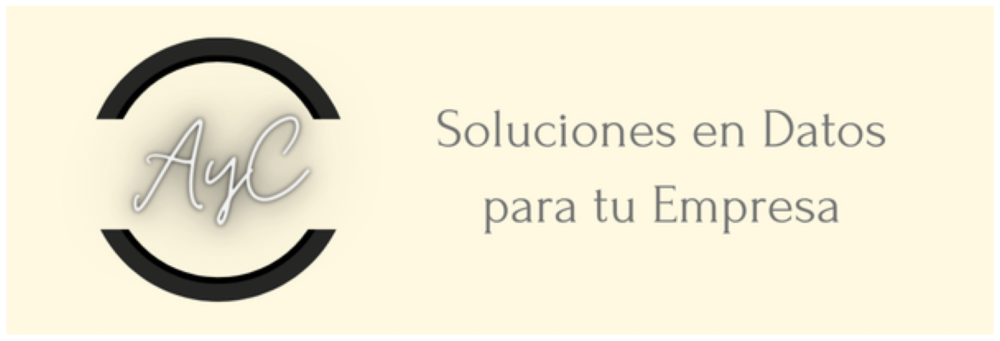

In [109]:
# r.Imagen("../assets/banner_consultora_ayc.png", (20,10))

# Importaciones e Instancia de Datos

In [1]:
# Modulos a utilizar
import os
import pandas as pd
import numpy as np
import pyarrow as pa
import pyarrow.parquet as pq
import matplotlib.pyplot as plt
import seaborn as sns
# from google.colab import drive # En el caso de trabajar en el entorno de Google Colab, debemos importar algunas dependencias.

%load_ext autoreload
%autoreload 2
import resources as r # en el caso de trabajar modularizando las funciones con respecto al cuaderno, creando un script que las contenga y que actue como libreria para su importación

import warnings
warnings.filterwarnings(action= 'ignore')


In [69]:
# Montamos el repositorio drive para trabajar los archivos que contiene (de ser necesario)
# drive.mount('/content/drive')

In [70]:
# instanciamos el fichero con la data en caso de trabajar con colab y con drive
# df_appearances= pd.read_parquet('/content/drive/MyDrive/NoCountry_rendimiento_deportivo/data_normalizada/appearances.parquet')
# df_club_games= pd.read_parquet('/content/drive/MyDrive/NoCountry_rendimiento_deportivo/data_normalizada/club_games.parquet')
# df_clubs= pd.read_parquet('/content/drive/MyDrive/NoCountry_rendimiento_deportivo/data_normalizada/clubs.parquet')
# df_competitions= pd.read_parquet('/content/drive/MyDrive/NoCountry_rendimiento_deportivo/data_normalizada/competitions.parquet')
# df_game_events= pd.read_parquet('/content/drive/MyDrive/NoCountry_rendimiento_deportivo/data_normalizada/game_events.parquet')
# df_game_lineups= pd.read_parquet('/content/drive/MyDrive/NoCountry_rendimiento_deportivo/data_normalizada/game_lineups.parquet')
# df_games= pd.read_parquet('/content/drive/MyDrive/NoCountry_rendimiento_deportivo/data_normalizada/games.parquet')
# df_player_valuations= pd.read_parquet('/content/drive/MyDrive/NoCountry_rendimiento_deportivo/data_normalizada/player_valuations.parquet')
# df_players= pd.read_parquet('/content/drive/MyDrive/NoCountry_rendimiento_deportivo/data_normalizada/players.parquet')

In [2]:
df_appearances= pd.read_parquet('../data/data_normalizada/appearances.parquet')
df_club_games= pd.read_parquet('../data/data_normalizada/club_games.parquet')
df_clubs= pd.read_parquet('../data/data_normalizada/clubs.parquet')
df_competitions= pd.read_parquet('../data/data_normalizada/competitions.parquet')
df_game_events= pd.read_parquet('../data/data_normalizada/game_events.parquet')
df_game_lineups= pd.read_parquet('../data/data_normalizada/game_lineups.parquet')
df_games= pd.read_parquet('../data/data_normalizada/games.parquet')
df_player_valuations= pd.read_parquet('../data/data_normalizada/player_valuations.parquet')
df_players= pd.read_parquet('../data/data_normalizada/players.parquet')

# <h1 align= 'center'>Informe de Análisis Exploratorio de Datos sobre el Rendimiento Académico en las Pruebas ICFES</h1>


*   Introducción

El presente informe detalla el análisis exploratorio de datos realizado sobre el rendimiento deportivo de jugadores y clubes en las diferentes competencias. El objetivo es comprender la distribución, tendencias y posibles factores asociados al desempeño de los diferentes clubes e identificar los patrones y causas generales que inciden en ello.

*   Objetivo del Análisis

El objetivo de este informe es analizar el rendimiento deportivo de los clubes en las diferentes competencias para identificar tendencias, patrones y posibles factores asociados con el rendimiento.

*   Datos Utilizados

El conjunto de datos utilizado en este análisis contiene información sobre el rendimiento deportivo de los jugadores en particular y de los clubes en general en las diferentes competencias (locales, nacionales e internacionales), así como datos generales de las competencias, valoraciones a nivel club y a  nivel particular de jugadores,  de los rendimientos, estadisticas de los eventos y partidos, y resultados de los mismos.

# Índice

- [Desarrollo](#Desarrollo)
    - [Appearances](#Appearances)
    - [Club_games](#Club_games)
    - [Clubs](#Clubs)
    - [Competitions](#Competitions)
    - [Game_events](#Game_events)
    - [Game_lineups](#Game_lineups)
    - [Games](#Games)
    - [Player_valuations](#Player_valuations)
    - [Players](#Players)
- [Analisis General](#Análisis%20General)
- [Conclusiones](#Conclusiones)


# <h1 align= 'center'><u>**Desarrollo**</u></h1>

In [72]:
# Configura Pandas para mostrar todas las columnas
# pd.set_option('display.max_columns', None)

# veamos nuestro dataframe
# df.head(5)

## Appearances

<h2 align= 'center'><u>Informe Preliminar</u></h2>

### <h3 align= 'center'><u>General</u></h3>

In [73]:
r.informe_dataframe(df_appearances)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 1579515
Columnas: 13

--Numero de datos--
20533695

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 1579514
Columnas: ['appearance_id', 'game_id', 'player_id', 'player_club_id', 'player_current_club_id', 'date', 'player_name', 'competition_id', 'yellow_cards', 'red_cards', 'goals', 'assists', 'minutes_played']

--Tipo de columnas--
appearance_id                     object
game_id                            int64
player_id                          int64
player_club_id                     int64
player_current_club_id             int64
date                      datetime64[ns]
player_name                       object
competition_id                    object
yellow_cards                       int64
red_cards                          int64
goals                              int64
assists                            int64
minutes_played                     i

'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [74]:
r.verificar_tipo_datos(df_appearances)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,appearance_id,[<class 'str'>],100.0,0.0,0
1,game_id,[<class 'int'>],100.0,0.0,0
2,player_id,[<class 'int'>],100.0,0.0,0
3,player_club_id,[<class 'int'>],100.0,0.0,0
4,player_current_club_id,[<class 'int'>],100.0,0.0,0
5,date,[<class 'pandas._libs.tslibs.timestamps.Timest...,100.0,0.0,0
6,player_name,[<class 'str'>],100.0,0.0,0
7,competition_id,[<class 'str'>],100.0,0.0,0
8,yellow_cards,[<class 'int'>],100.0,0.0,0
9,red_cards,[<class 'int'>],100.0,0.0,0


### <h3 align= 'center'><u>Particular</u></h3>

In [75]:
for columna in df_appearances.columns:
    r.informe_columna(df_appearances, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE appearance_id:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
1579515

--Valores unicos en la columna (Primeros 5 valores)--
['2231978_38004' '2233748_79232' '2234413_42792' '2234418_73333'
 '2234421_122011']

--Moda de la columna especificada--
Valor modal -----> 2231978_38004
Frecuencia acumulada ------> 1

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 2231978_38004     1
3394883_105695    1
3412937_284732    1
Name: appearance_id, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE game_id:

--Numero de datos nulos--
0

--Valores unicos en la columna--
Ej: [2231978 2233748 2234413 2234418 2234421]  -----> Desde 2231978  Hasta 411

### <h3 size= 22 align= 'center'><u>Análisis Descriptivo</u></h3>

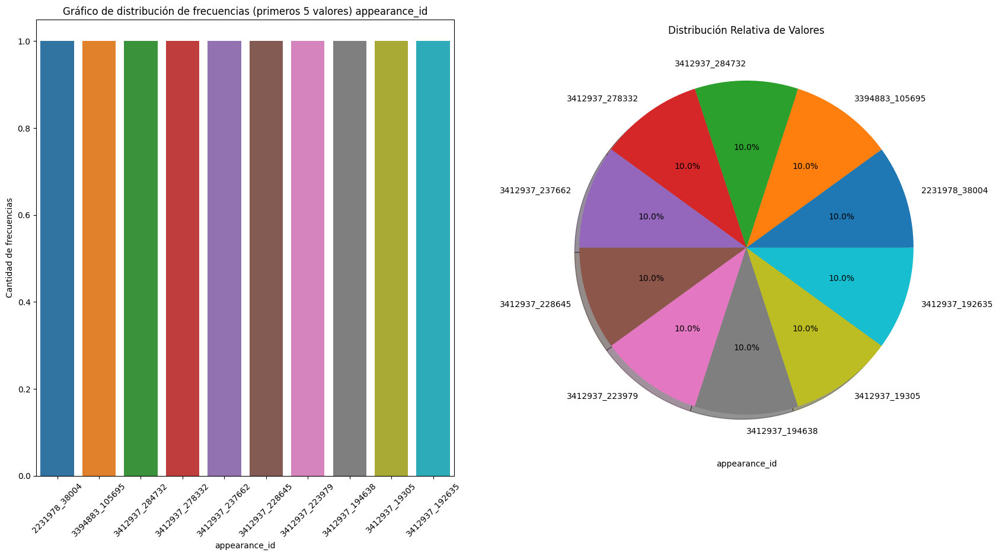



Estadísticas Básicas


count           1579515
unique          1579515
top       2231978_38004
freq                  1
Name: appearance_id, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




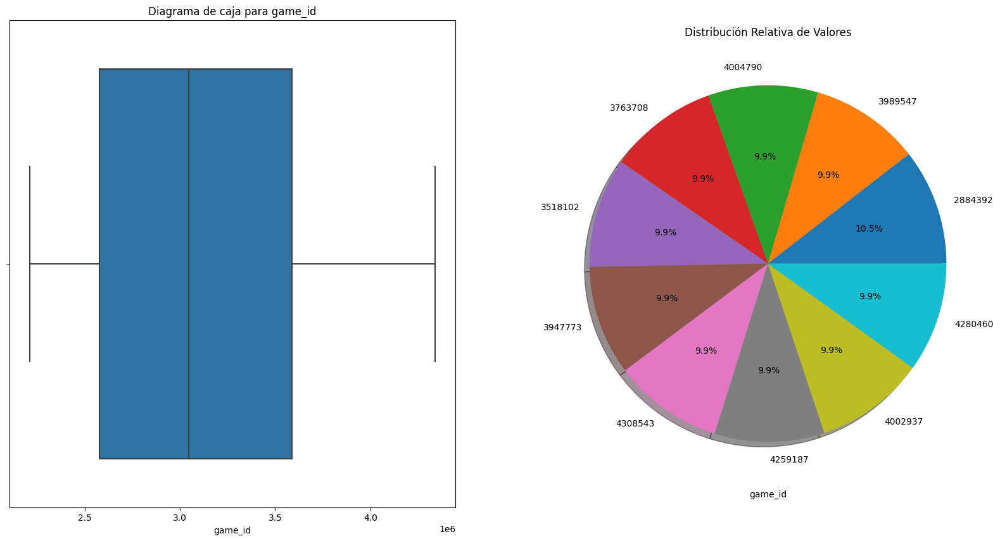



Estadísticas Básicas


count    1.579515e+06
mean     3.068853e+06
std      5.918917e+05
min      2.211607e+06
25%      2.578087e+06
50%      3.047826e+06
75%      3.588592e+06
max      4.340617e+06
Name: game_id, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




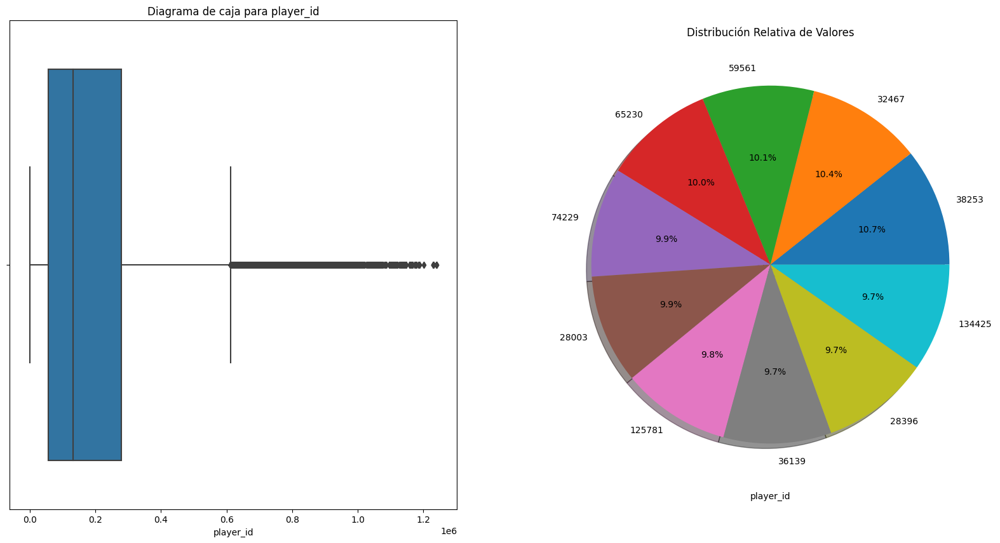



Estadísticas Básicas


count    1.579515e+06
mean     1.902541e+05
std      1.746710e+05
min      1.000000e+01
25%      5.602600e+04
50%      1.322970e+05
75%      2.783320e+05
max      1.240467e+06
Name: player_id, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




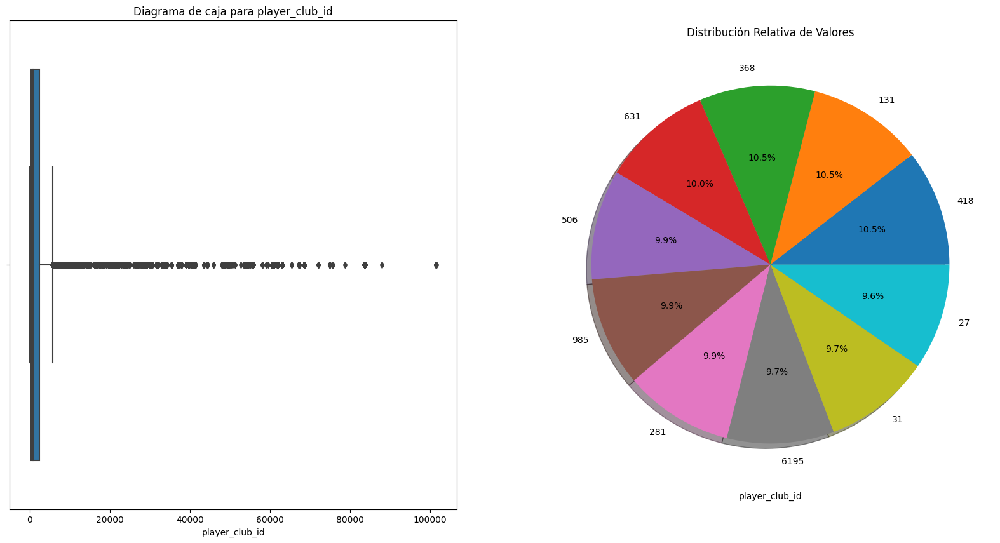



Estadísticas Básicas


count    1.579515e+06
mean     2.999544e+03
std      7.637521e+03
min      1.000000e+00
25%      2.890000e+02
50%      8.330000e+02
75%      2.441000e+03
max      1.016340e+05
Name: player_club_id, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




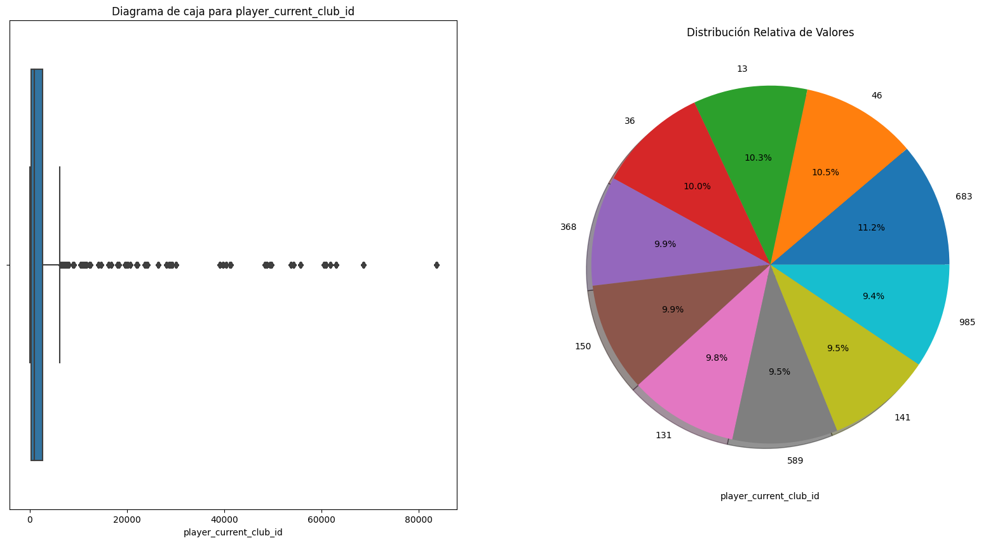



Estadísticas Básicas


count    1.579515e+06
mean     3.661786e+03
std      9.341060e+03
min     -1.000000e+00
25%      3.360000e+02
50%      9.240000e+02
75%      2.687000e+03
max      8.367800e+04
Name: player_current_club_id, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




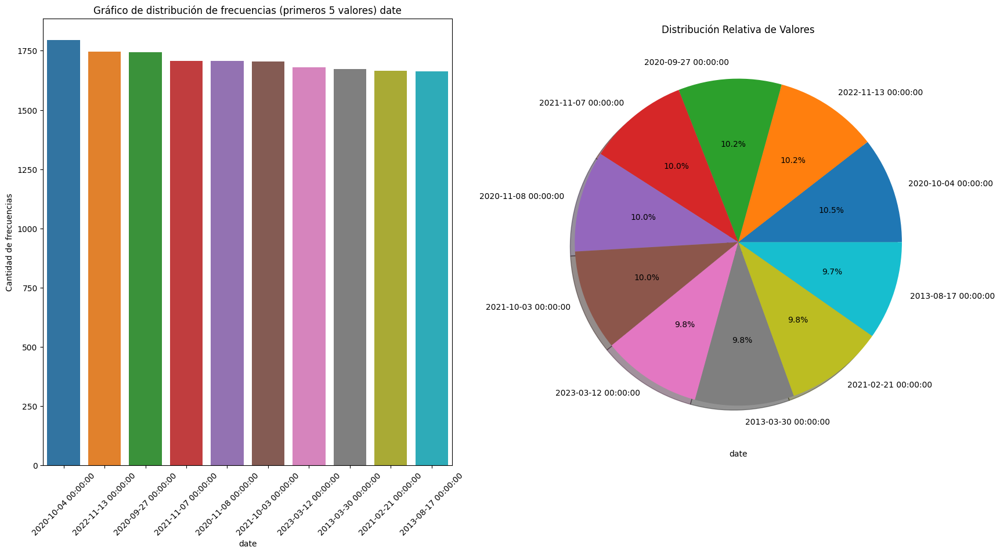



Estadísticas Básicas


count                 1579515
unique                   3491
top       2020-10-04 00:00:00
freq                     1795
first     2012-07-03 00:00:00
last      2024-05-16 00:00:00
Name: date, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




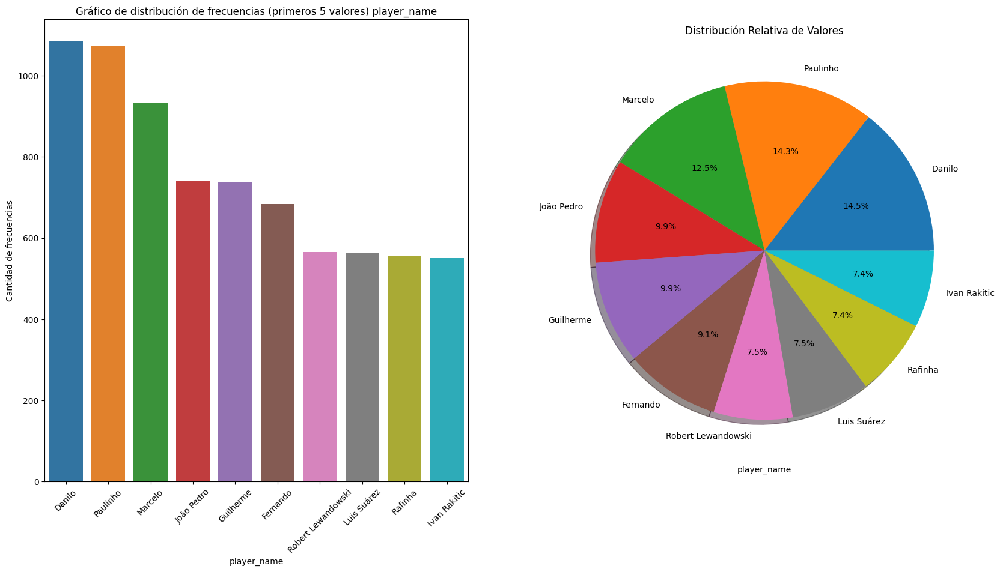



Estadísticas Básicas


count     1579515
unique      23555
top        Danilo
freq         1084
Name: player_name, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




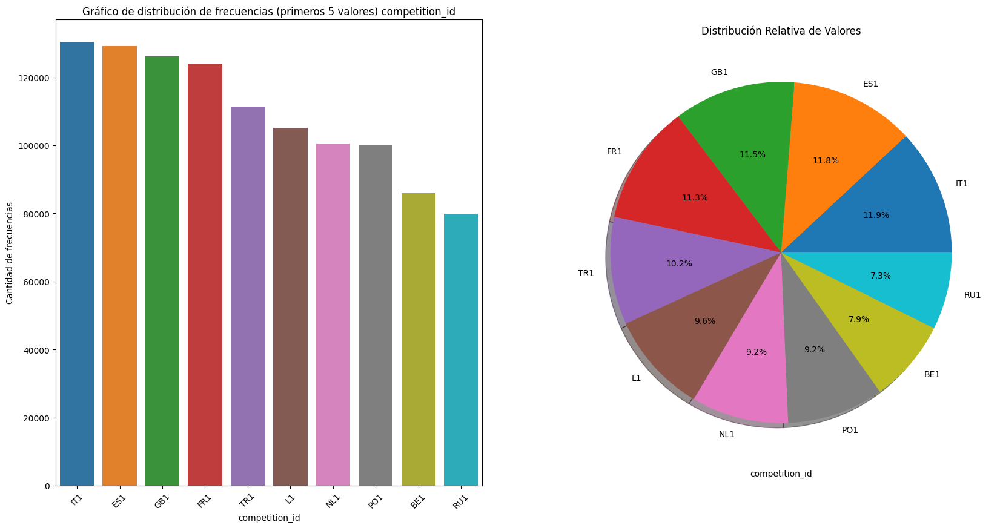



Estadísticas Básicas


count     1579515
unique         43
top           IT1
freq       130473
Name: competition_id, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




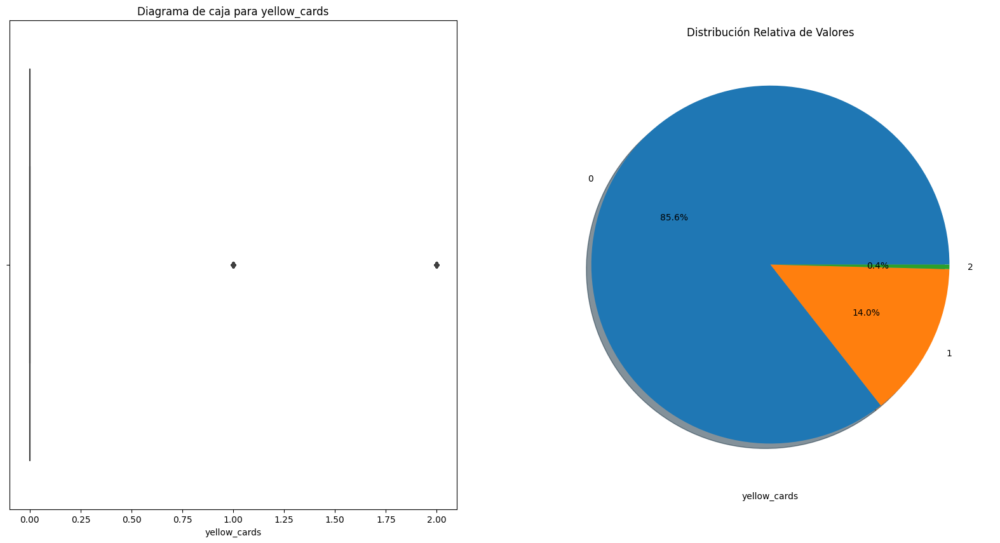



Estadísticas Básicas


count    1.579515e+06
mean     1.483151e-01
std      3.666977e-01
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      2.000000e+00
Name: yellow_cards, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




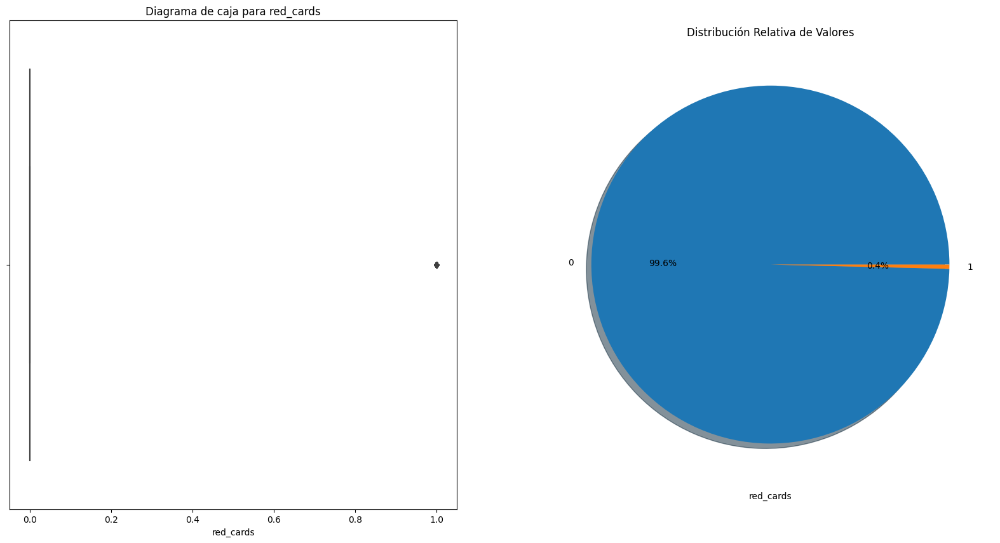



Estadísticas Básicas


count    1.579515e+06
mean     3.803066e-03
std      6.155165e-02
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.000000e+00
Name: red_cards, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




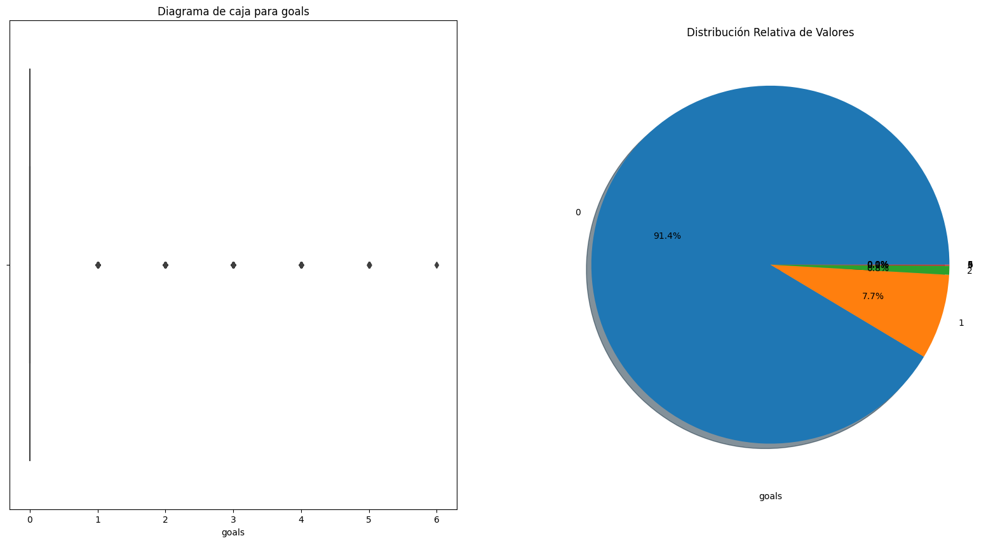



Estadísticas Básicas


count    1.579515e+06
mean     9.620991e-02
std      3.315039e-01
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      6.000000e+00
Name: goals, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




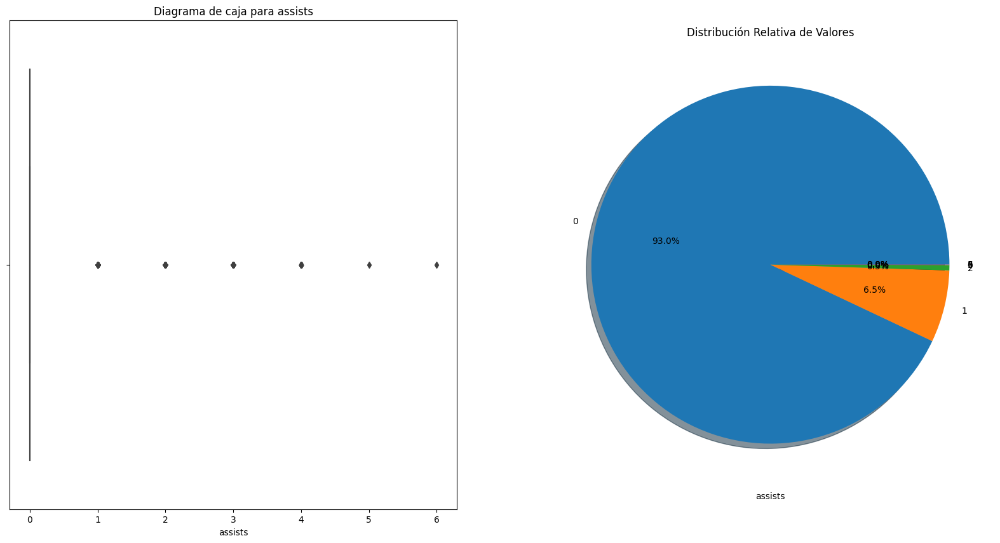



Estadísticas Básicas


count    1.579515e+06
mean     7.578022e-02
std      2.861986e-01
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      6.000000e+00
Name: assists, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




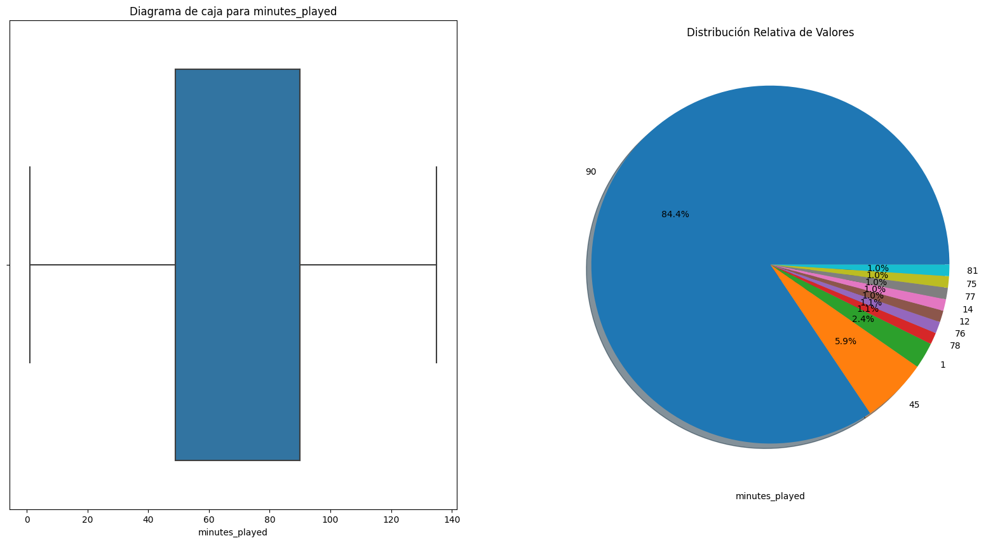



Estadísticas Básicas


count    1.579515e+06
mean     6.947028e+01
std      2.983752e+01
min      1.000000e+00
25%      4.900000e+01
50%      9.000000e+01
75%      9.000000e+01
max      1.350000e+02
Name: minutes_played, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




In [76]:
r.descripcion_distribucion(df_appearances)

###  N° total de apariciones por jugador

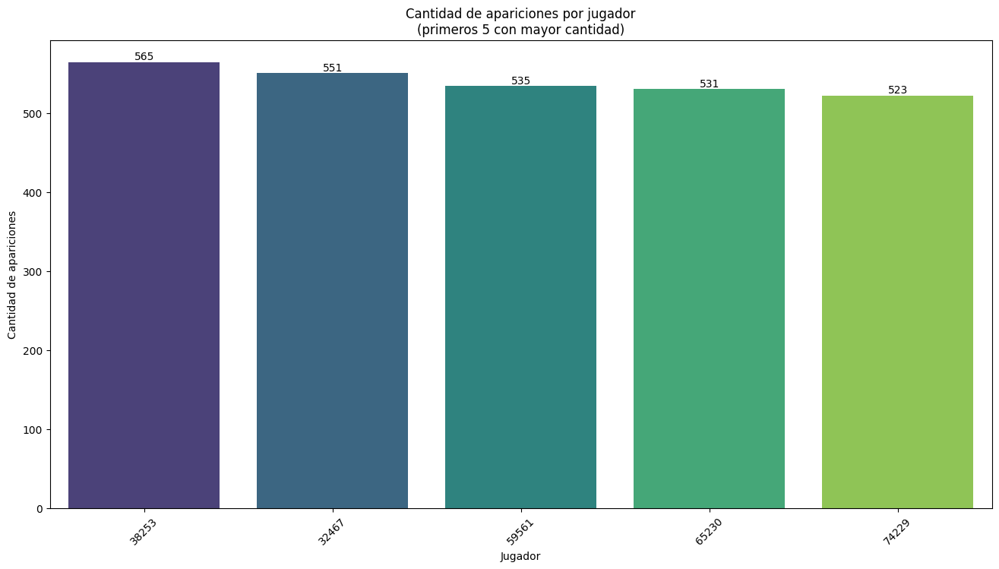

{'38253': 'Robert Lewandowski',
 '32467': 'Ivan Rakitic',
 '59561': 'Dani Parejo',
 '65230': 'Sergio Busquets',
 '74229': 'Koke'}

In [24]:
r.apariciones_x_jugador(df_appearances)

Esta distribucion de cantidad de apariciones por aprtido viene supeditada a varios factores, entre los que podemos nombrar entre otros, la frecuencia a lesionarse del jugador, el rendimiento individual para ser parte del equipo titular (o ingresar durante los partidos), el tamaño de la plantilla del equipo, la capacidad del club a ser parte de diferentes competencias nacionales e internacionales y de avanzar hasta las ultimas instancias en ellas (ya que llevaria a jugar mas partidos), la posicion de campo del jugador, etc.

### Minutos jugados por partido

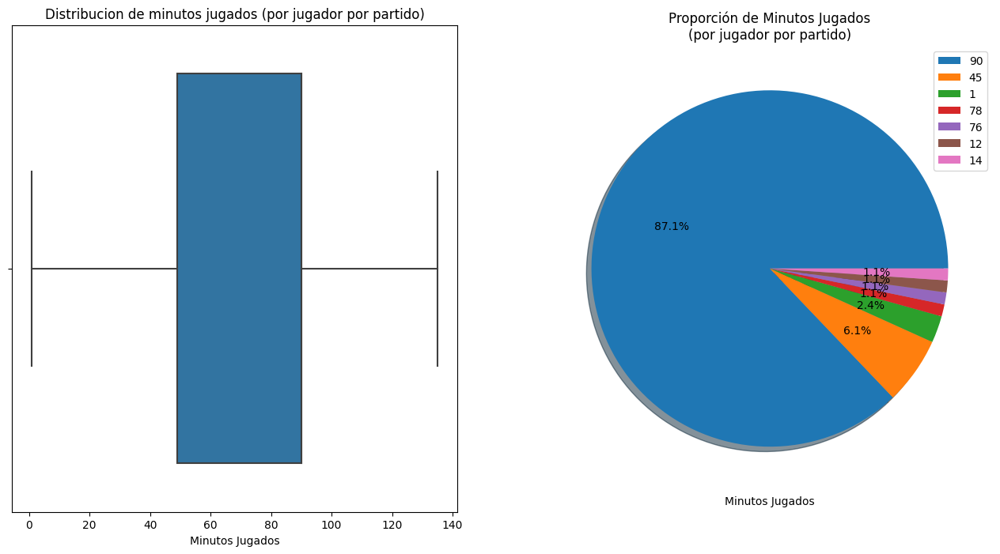

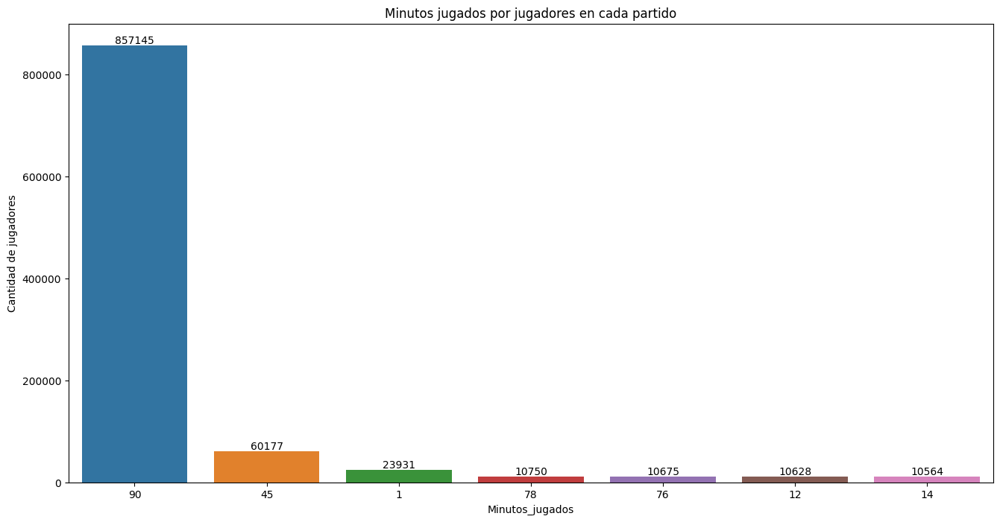

In [9]:
r.minutos_x_partido(df_appearances)

Esto nos indica que existen x registros de jugadores que jugaron x cantidad de minutos (tomar en cuenta que en un partido juegan 22 jugadores de campo, y a eso hay que agregar las sustituciones que se pueden hacer).

Todos los valores en 90 min jugados por jugadores, se debe a que completaron el partido sin ser sustituidos (y tiene sentido que ese valor sea abrumadoramente alto con respecto a otros registros de minutos jugados, ya que no siempre se usan todos los cambios y los cambios solo afectan como maximo a 6 jugadores en total en un partido (de 22 que juegan en el campo, vale destacar que en los ultimos años post-pandemia se elevo a 10 en total el maximo de cambios en un partido (5 por cada equipo, en tiempo reglamentario))).

### Cantidad de tarjetas por jugador

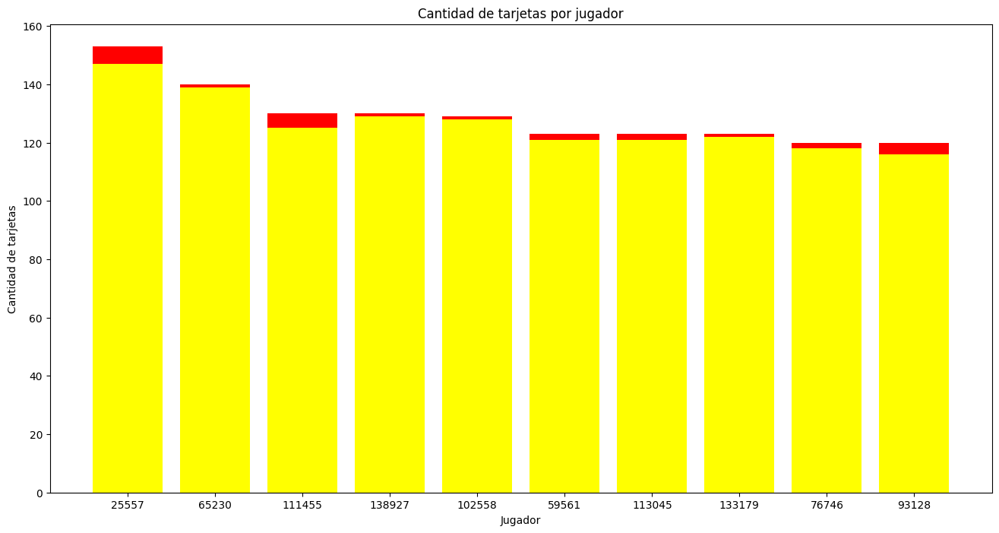

,player_id,yellow_cards,red_cards,total_cards
2071,25557,147,6,153
5517,65230,139,1,140
7885,111455,125,5,130
9091,138927,129,1,130
7511,102558,128,1,129
5095,59561,121,2,123
7958,113045,121,2,123
8897,133179,122,1,123
6229,76746,118,2,120
7071,93128,116,4,120


In [26]:
r.tarjetas_x_jugador(df_appearances)

###  Goles y Asistencias por jugador por temporada

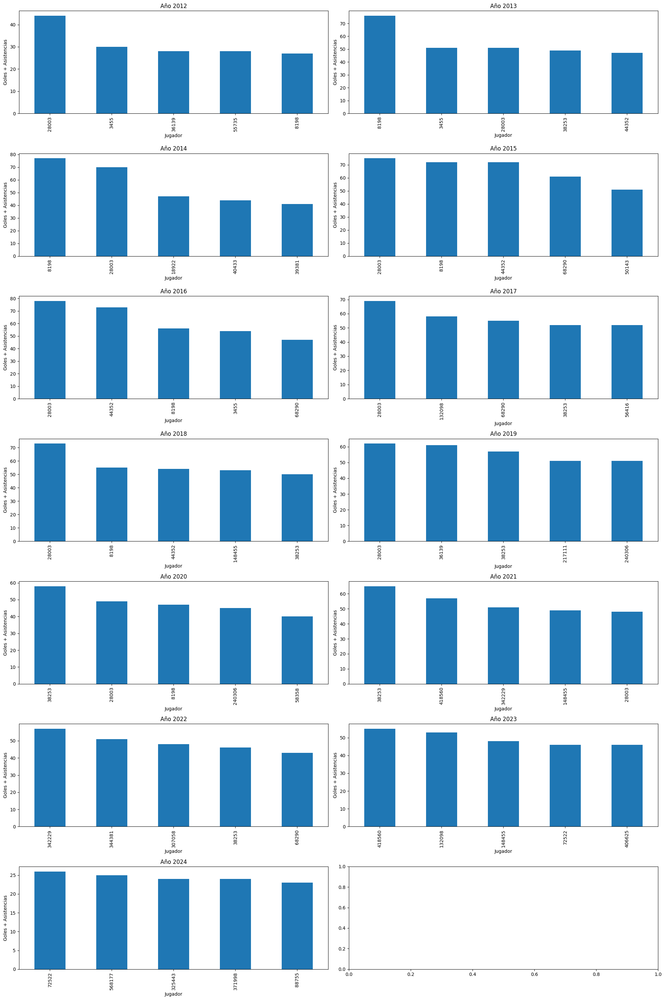

,player_id,player_name,year,goals,assists,total_participacion_goles
9312,28003,Lionel Messi,2012,35,9,44
631,3455,Zlatan Ibrahimović,2012,20,10,30
12463,36139,Dusan Tadic,2012,11,17,28
21114,55735,Henrikh Mkhitaryan,2012,20,8,28
2701,8198,Cristiano Ronaldo,2012,23,4,27
...,...,...,...,...,...,...
97129,1176866,Motez Nourani,2024,0,0,0
97131,1178474,Amadou Koné,2024,0,0,0
97134,1187799,Franciszek Franczak,2024,0,0,0
97135,1201294,Ozan Demirbağ,2024,0,0,0


In [4]:
r.goles_y_asistencias(df_appearances)

## Club_games

<h2 align= 'center'><u>Informe Preliminar</u></h2>

### <h3 align= 'center'><u>General</u></h3>

In [77]:
r.informe_dataframe(df_club_games)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 136344
Columnas: 11

--Numero de datos--
1499784

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 136343
Columnas: ['game_id', 'club_id', 'own_goals', 'own_position', 'own_manager_name', 'opponent_id', 'opponent_goals', 'opponent_position', 'opponent_manager_name', 'hosting', 'is_win']

--Tipo de columnas--
game_id                   int64
club_id                   int64
own_goals                 int64
own_position              int64
own_manager_name         object
opponent_id               int64
opponent_goals            int64
opponent_position         int64
opponent_manager_name    object
hosting                  object
is_win                    int64
dtype: object
--Cantidad de registros duplicados--
0



'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [78]:
r.verificar_tipo_datos(df_club_games)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,game_id,[<class 'int'>],100.0,0.0,0
1,club_id,[<class 'int'>],100.0,0.0,0
2,own_goals,[<class 'int'>],100.0,0.0,0
3,own_position,[<class 'int'>],100.0,0.0,0
4,own_manager_name,[<class 'str'>],100.0,0.0,0
5,opponent_id,[<class 'int'>],100.0,0.0,0
6,opponent_goals,[<class 'int'>],100.0,0.0,0
7,opponent_position,[<class 'int'>],100.0,0.0,0
8,opponent_manager_name,[<class 'str'>],100.0,0.0,0
9,hosting,[<class 'str'>],100.0,0.0,0


### <h3 align= 'center'><u>Particular</u></h3>

In [79]:
for columna in df_club_games.columns:
    r.informe_columna(df_club_games, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE game_id:

--Numero de datos nulos--
0

--Valores unicos en la columna--
Ej: [2320450 2320460 2320472 2321044 2321060]  -----> Desde 2320450  Hasta 3520159

--Estadisticos Principales de la columna--
Media: 3063156.19
Desviacion Estandar: 590641.23
Primer cuartil: 2559106.75
Mediana: 3047452.5
Tercer cuartil: 3583517.25

--Valores extremos--
Valor maximo: 4340617
Valor minimo: 2211607

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 2320450    2
3690536    2
3631966    2
Name: game_id, dtype: int64

--Valor maximo y minimo--
Maximo: 4340617
Minimo: 2211607

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE club_id:

--Numero de datos nulos--
0

--Valores unicos en la columna

### <h3 size= 22 align= 'center'><u>Análisis Descriptivo</u></h3>

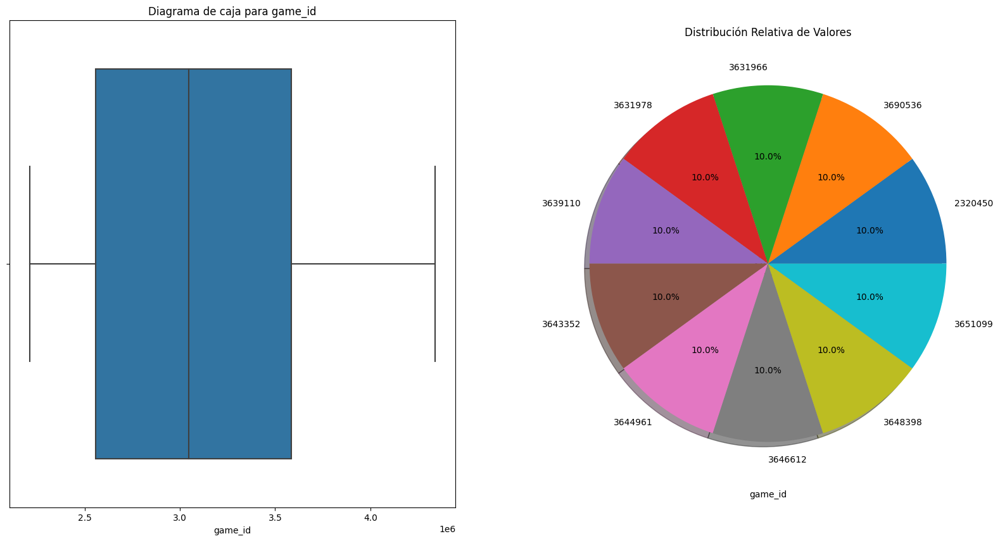



Estadísticas Básicas


count    1.363440e+05
mean     3.063156e+06
std      5.906412e+05
min      2.211607e+06
25%      2.559107e+06
50%      3.047452e+06
75%      3.583517e+06
max      4.340617e+06
Name: game_id, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




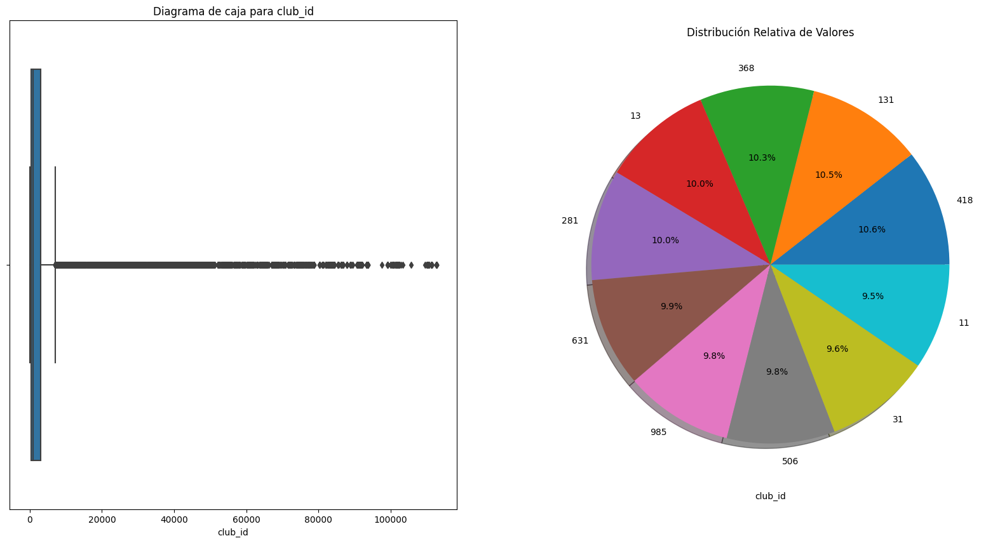



Estadísticas Básicas


count    136344.000000
mean       4653.052815
std       10839.432267
min           1.000000
25%         352.000000
50%         989.000000
75%        3057.000000
max      112755.000000
Name: club_id, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




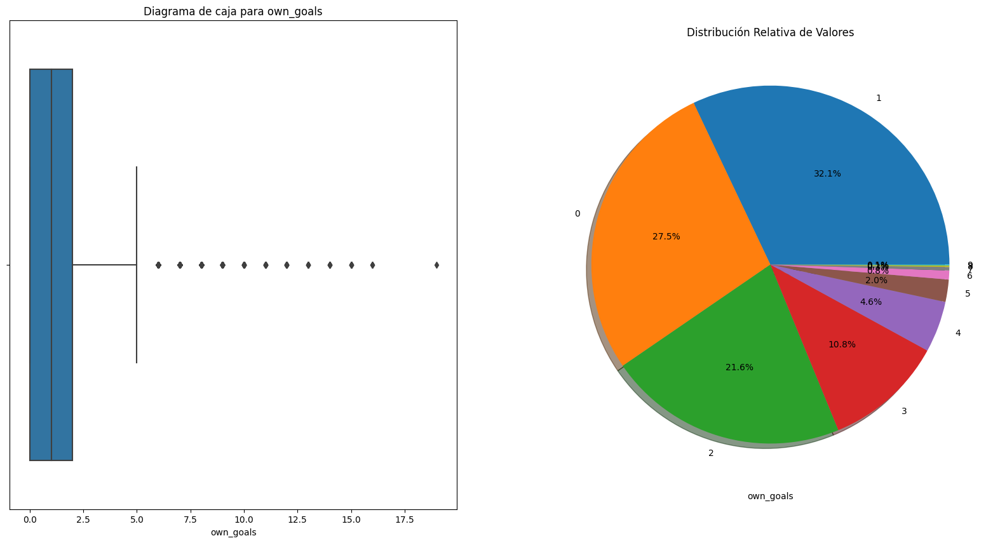



Estadísticas Básicas


count    136344.000000
mean          1.458839
std           1.400641
min           0.000000
25%           0.000000
50%           1.000000
75%           2.000000
max          19.000000
Name: own_goals, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




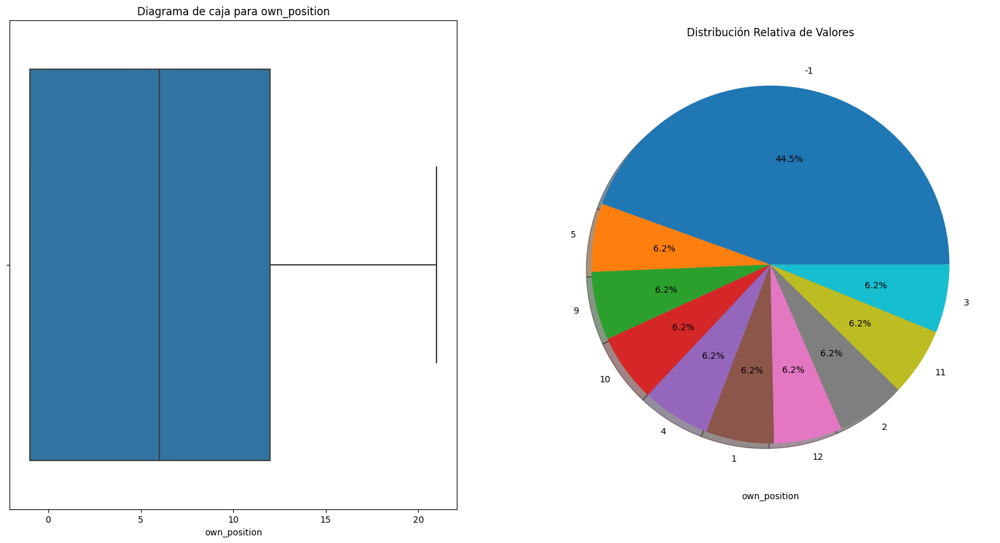



Estadísticas Básicas


count    136344.000000
mean          6.322383
std           6.500878
min          -1.000000
25%          -1.000000
50%           6.000000
75%          12.000000
max          21.000000
Name: own_position, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




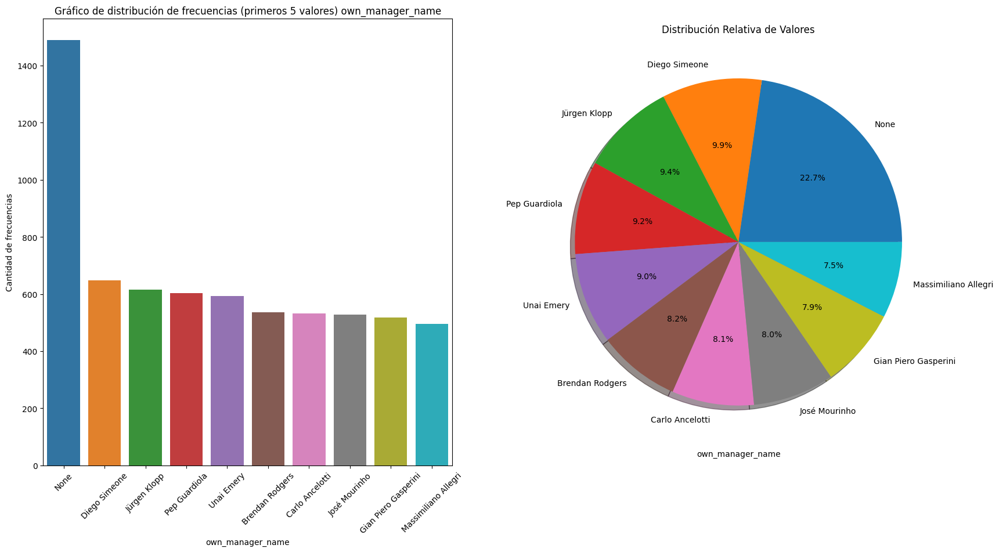



Estadísticas Básicas


count     136344
unique      5671
top         None
freq        1490
Name: own_manager_name, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




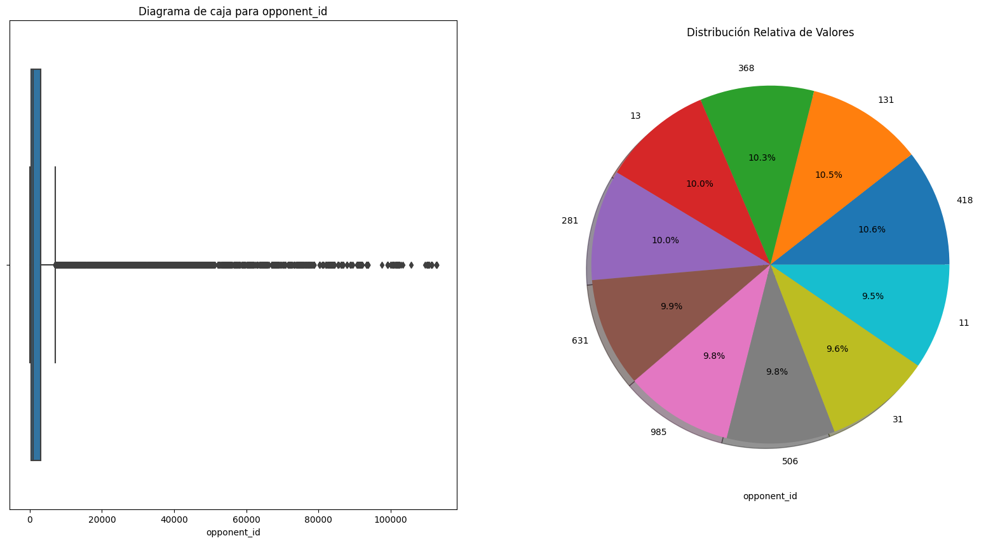



Estadísticas Básicas


count    136344.000000
mean       4653.052815
std       10839.432267
min           1.000000
25%         352.000000
50%         989.000000
75%        3057.000000
max      112755.000000
Name: opponent_id, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




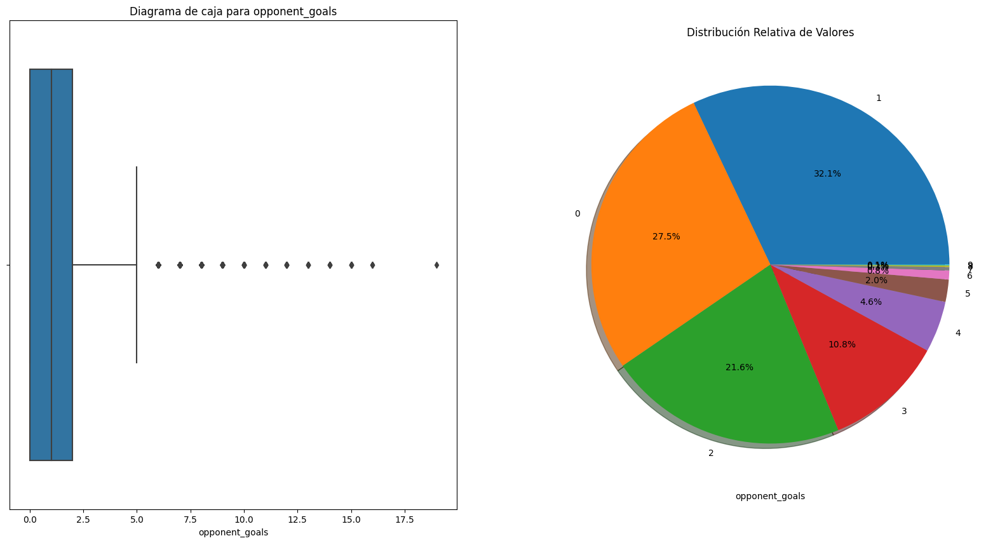



Estadísticas Básicas


count    136344.000000
mean          1.458839
std           1.400641
min           0.000000
25%           0.000000
50%           1.000000
75%           2.000000
max          19.000000
Name: opponent_goals, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




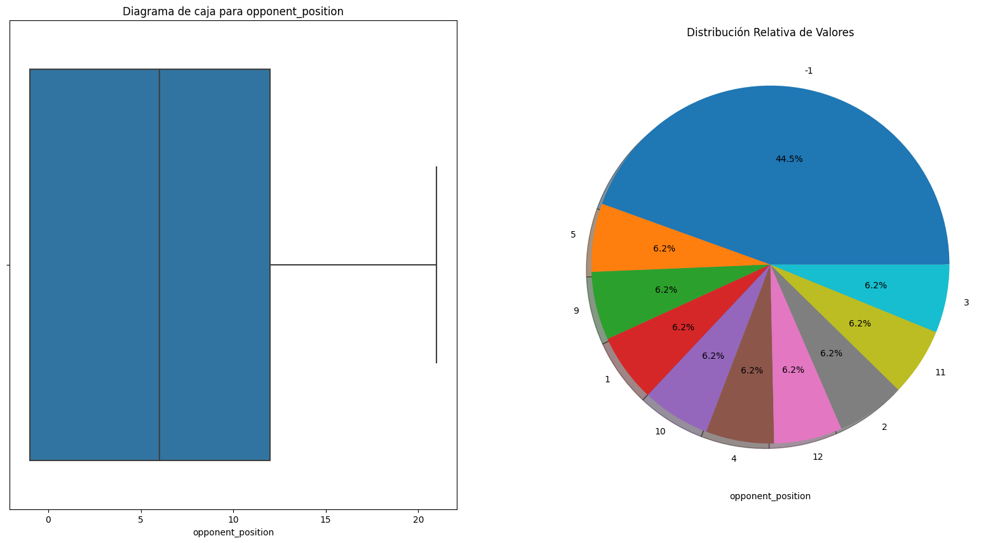



Estadísticas Básicas


count    136344.000000
mean          6.322383
std           6.500878
min          -1.000000
25%          -1.000000
50%           6.000000
75%          12.000000
max          21.000000
Name: opponent_position, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




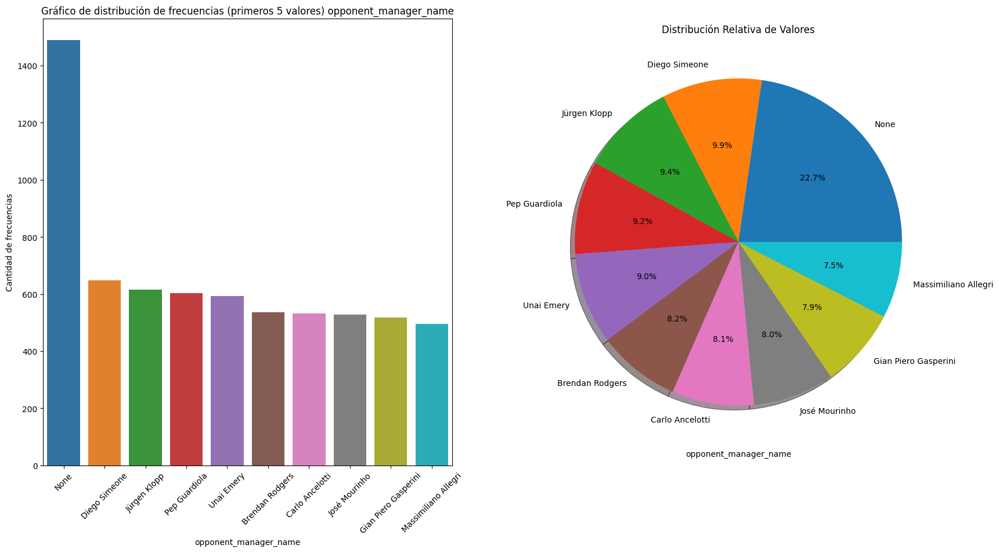



Estadísticas Básicas


count     136344
unique      5671
top         None
freq        1490
Name: opponent_manager_name, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




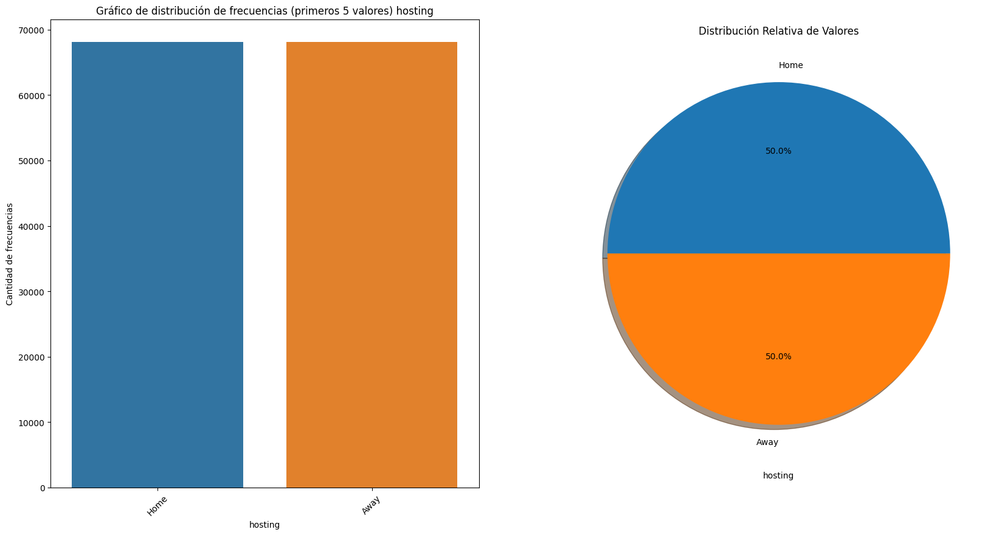



Estadísticas Básicas


count     136344
unique         2
top         Home
freq       68172
Name: hosting, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




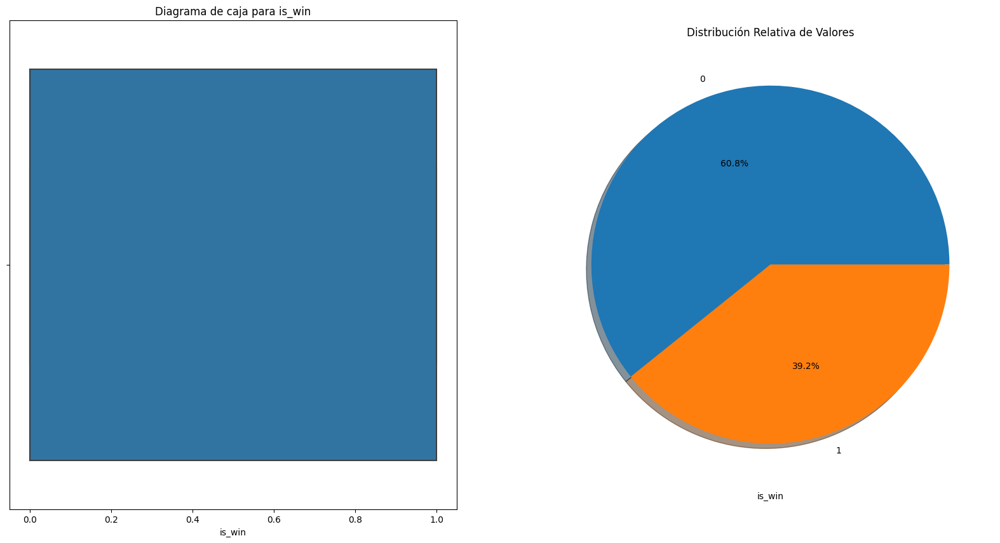



Estadísticas Básicas


count    136344.000000
mean          0.392302
std           0.488265
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max           1.000000
Name: is_win, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




In [80]:
r.descripcion_distribucion(df_club_games)

### Distribución de goles anotados por el club local y el oponente

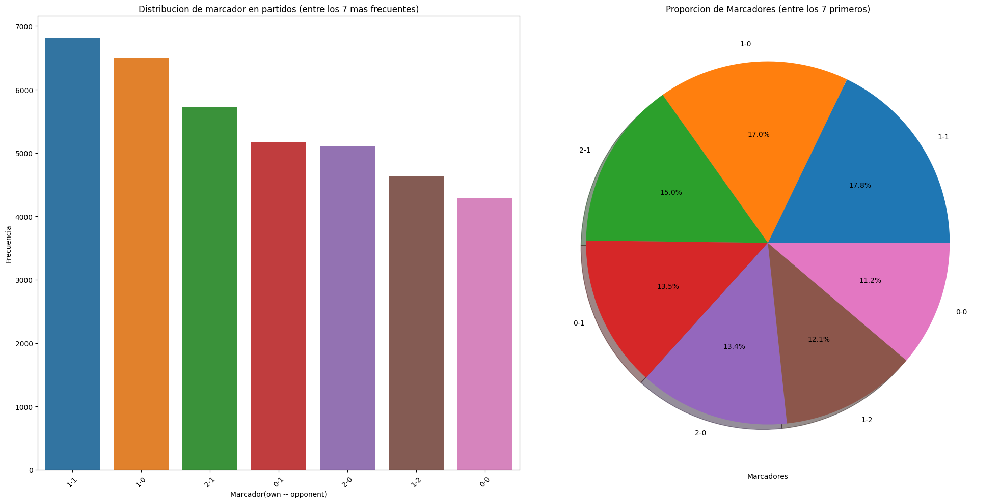

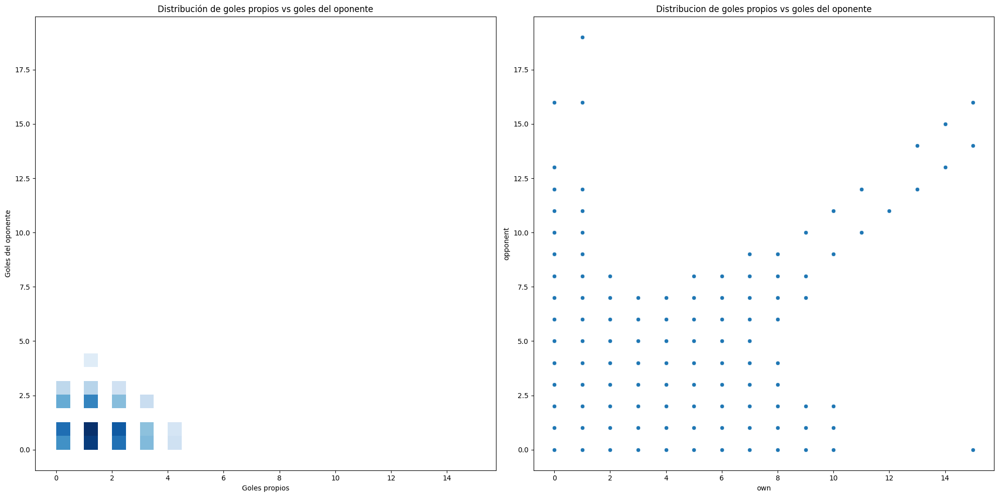

,index,scores
0,1-1,6820
1,1-0,6494
2,2-1,5722
3,0-1,5171
4,2-0,5108
5,1-2,4630
6,0-0,4287


In [7]:
r.goles_x_local_o_oponente(df_club_games)

Este análisis lo tomamos desde la perspectiva de un equipo local, para realizar adecuadamente y segmentar correctamente los datos y desarrollar resultados precisos.

Como vemos, existe en general, una preponderancia de resultados con baja cantidad total de goles, y de baja diferencia de gol entre un equipo y el otro (se puede ver que solo un score con diferencia de mas de 1 gol esta entre los 7 scores mas frecuentes).
Vemos que existe una concentracion pronunciada en este tipo de marcadores (de baja diferencia de gol o sin diferencia de gol entre equipos, en conjunto con baja cantidad de goles), tambien podemos ver que los equipos locales tienden a no perder (solo dos scores entre los 7 mas frecuentes son de derrotas).

A traves del grafico de dispersion, tomando como referencia goles propios y goles del oponente, podemos ver que luego de una cierta cantidad, la cantidad de goles de uno y otro equipo muestra una correlacion directa creciente (en principio), aunque no es una conclusion solida, ya que no sabemos si la correlacion es lineal o no.

Para llegar a consolidar las conclusiones obtenidas en el analisis de esta data, necesitamos examinar otros campos que fundamenten de manera mas concreta las conclusiones a las que llegamos

### Mayor cantidad de victorias como locales

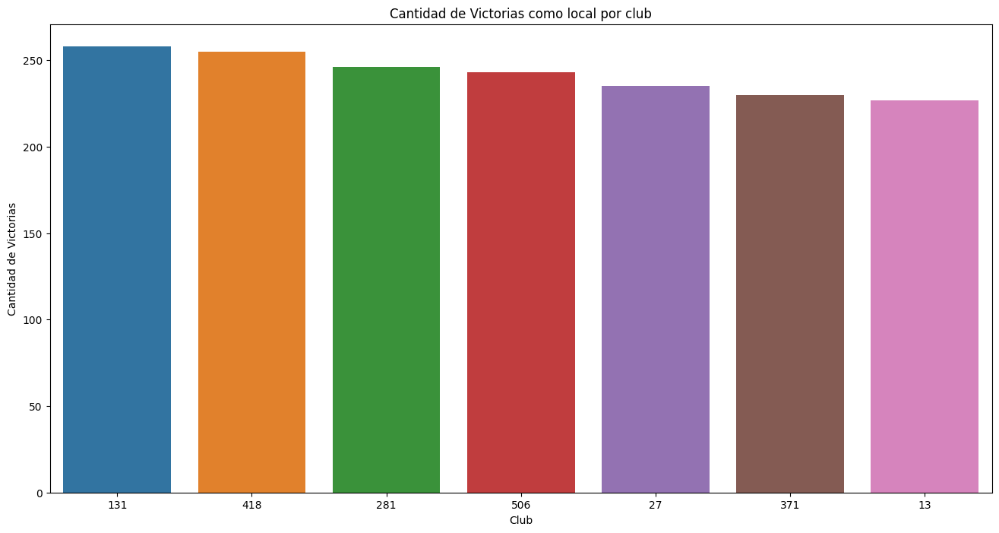

,club_id,is_win
85,131,258
194,418,255
143,281,246
225,506,243
23,27,235
176,371,230
11,13,227


In [3]:
r.victorias_como_locales(df_club_games)

### Correlación entre la posición en la liga y el número de goles anotados

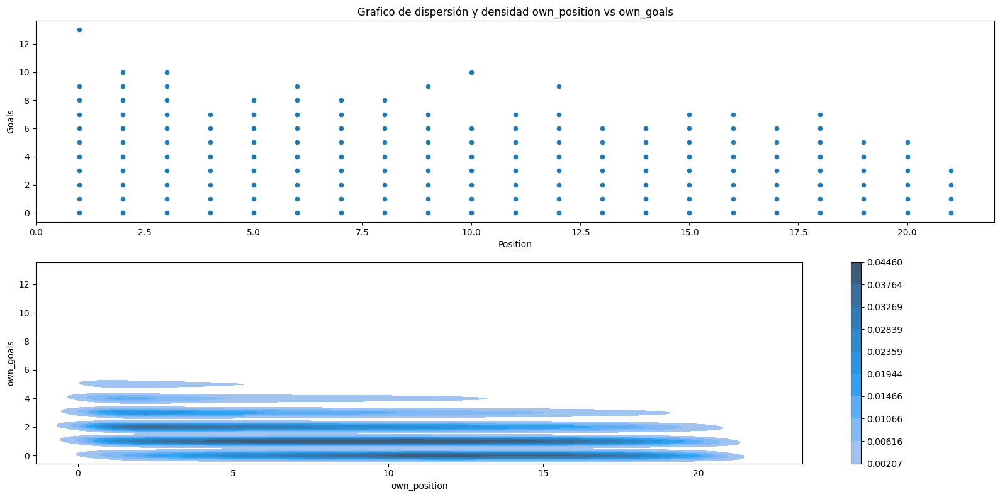

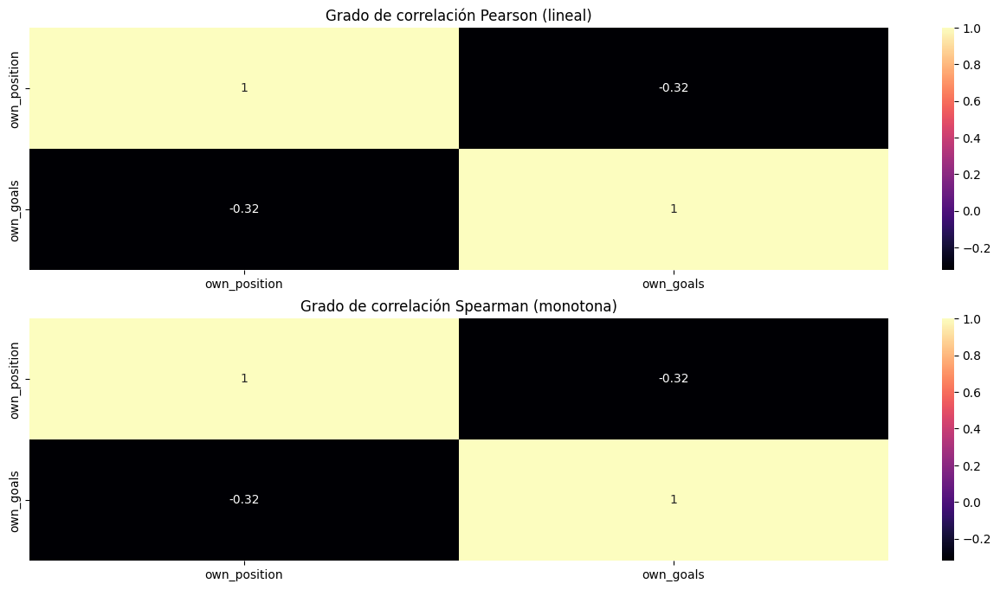

,own_position,own_goals
3,1,2
4,18,0
5,13,2
6,15,1
7,7,0
...,...,...
136326,17,2
136327,13,1
136328,18,4
136329,16,1


In [4]:
r.correlacion_posicion_x_goles_anotados(df_club_games)

Podemos observar que el grado de goles propios realizados por cada club tiene un cierto grado de correlacion (en este caso, negativa... pero tiene sentido ya que las posiciones en un torneo tienen la logica de cuanto menor es el numero, es una mejor posicion) podemos observarla en los graficos (aunque no se ve tan claramente con una correlacion lineal) y tambien en el grado de correlacion de Pearson que obtuvimos (-0.37). 

Este analisis podria ser complementado por la otra faceta que integra la conformacion de un score (que es el que decide el resultado del partido y que a su vez incide en la posicion en la tabla de un club determinado) que son los goles en contra.

Tambien debemos tener en cuenta la cantidad de registros que hay sobre determinado club, en conjunto con el torneo que se esta jugando (no es lo mismo la incidencia de la cantidad de goles a favor en un campeonato domestico (que suele tener muchos partidos) a la cantidad de goles a favor en una copa internacional (que tiende a tener pocos partidos, e incluso en algunos casos, 1 solo partido como por ejemplo la supercopa europea))

### Partidos ganados, perdidos y empatados por club

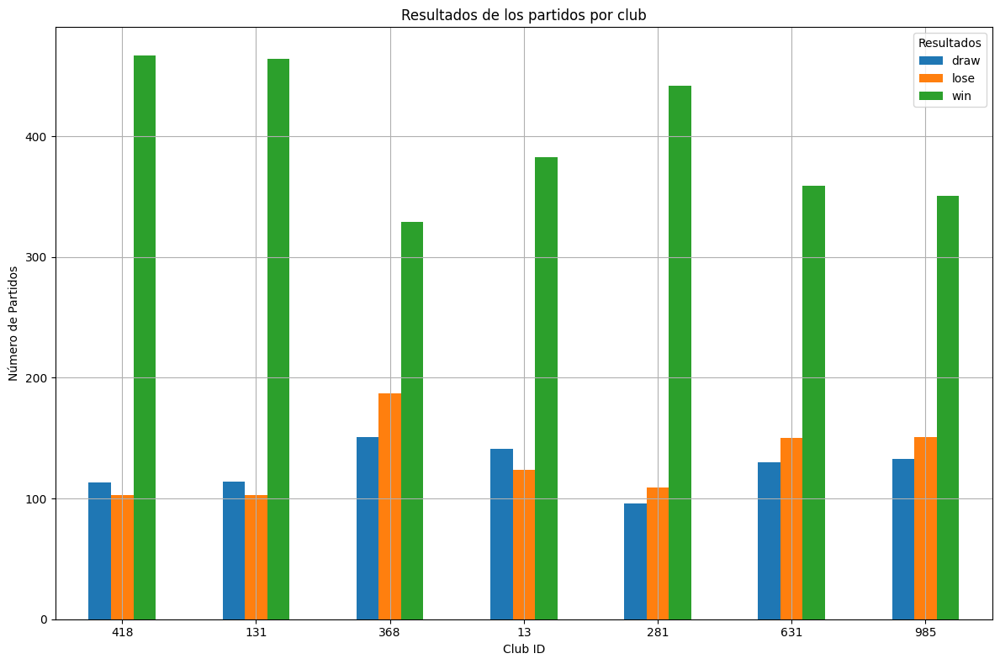

results,club_id,draw,lose,win,draw_mean,win_mean,lose_mean,total_games
221,418,113,103,467,16.54,68.37,15.08,683
98,131,114,103,464,16.74,68.14,15.12,681
199,368,151,187,329,22.64,49.33,28.04,667
12,13,141,124,383,21.76,59.10,19.14,648
162,281,96,109,442,14.84,68.32,16.85,647
...,...,...,...,...,...,...,...,...
2245,48712,0,1,0,0.00,0.00,100.00,1
2246,48725,0,1,0,0.00,0.00,100.00,1
1555,18393,0,1,0,0.00,0.00,100.00,1
1554,18385,0,1,0,0.00,0.00,100.00,1


In [5]:
r.resultado_partido_x_club(df_club_games)

Veamos que existe una tendencia a que a mayor cantidad de partidos, mayor es la diferencia entre la cantidad de partidos ganados en relacion a los partidos perdidos y empatados.

Esto se lleva con que en general, los clubes que mayor cantidad de partidos juegan por temporada (y en total en general tambien), tienden a ser los clubes con mejor rendimiento y mejor plantilla ya que se considera de esto que llegan a ultimas instancias de competiciones en sistemas de eliminacion o de grupos, asi como en campeonatos/ligas locales llegan con chances de campeonar.

Eso se refleja en la cantidad de partidos en total jugados, y en porcentaje de partidos ganados en total. Tambien vemos que los clubes con mayooor cantidad de partidos jugados, tienen alrededor de el 50/60 o más de porcentaje de victorias en partidos.

### Rendimiento de entrenadores locales vs visitantes

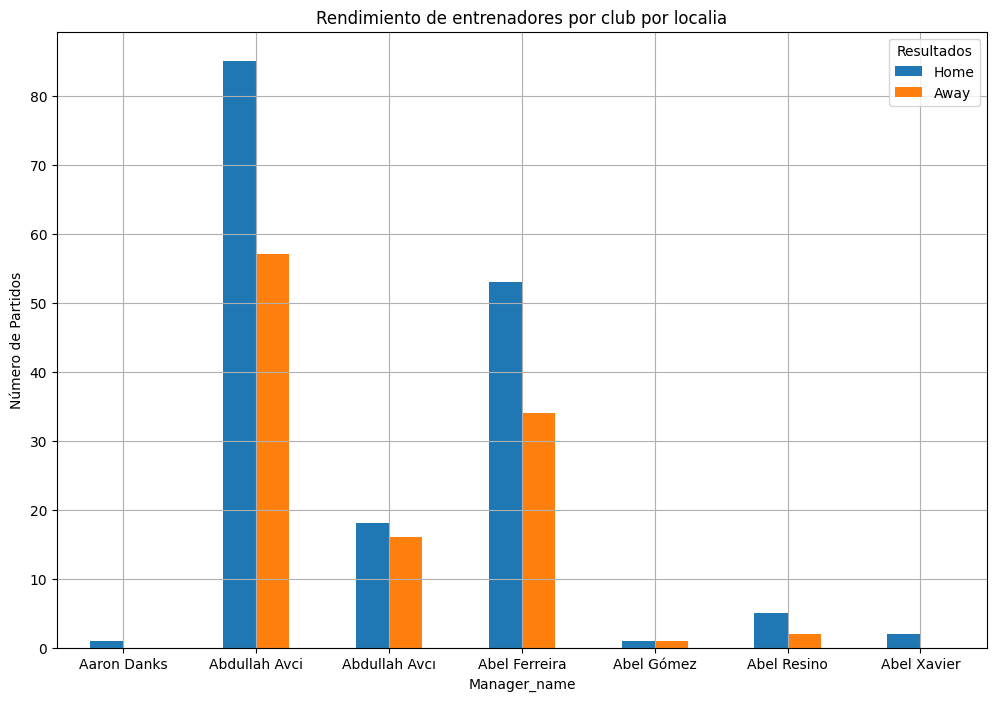

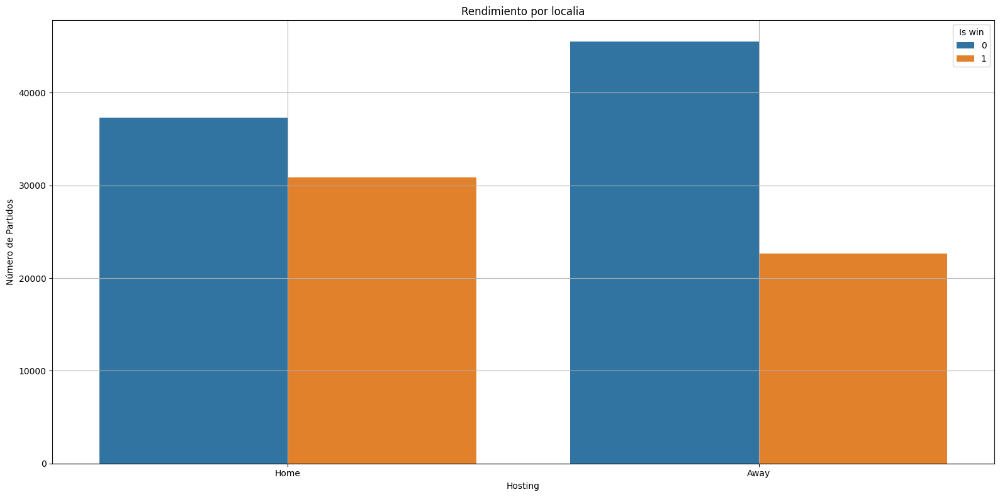

hosting,own_manager_name,Away,Home
0,Aaron Danks,0,1
1,Abdullah Avci,57,85
2,Abdullah Avcı,16,18
3,Abel Ferreira,34,53
4,Abel Gómez,1,1
...,...,...,...
3809,Ünal Karaman,13,24
3810,İbrahim Üzülmez,1,2
3811,İlhan Palut,3,11
3812,İsmail Kartal,21,20


In [26]:
r.rendimiento_entrenadores(df_club_games)

Podemos ver aqui el rendimiento en partidos de entrenadores en condicioin de local y de visitante.

Este primer grafico nos muestra, ademas de sus rendimientos en condicion de local y visitante, que existen registros de un mismo entrenador en diferentes clubes, por eso se repiten como valores en el primer grafico (se ve esto en las etiquetas del eje x correspondiente a los entrenadores)

Tambien podemos ver que el registro de de partidos que no son victorias (its_win == 0) es mayor tanto en condicion de local como de visitante, esto puede deverse a que se estan registrando tambien los partidos empatados como valor de 'no ganado' tanto para locales como para visitantes. Tambien podemos pensar que existe una cierta diferencia en cantidad de partidos de local y de visitante que puede jugar un determinado club por razones varias (campeonatos continentales, mundiales, copas, traslado forzoso de localia, etc).


## Clubs

<h2 align= 'center'><u>Informe Preliminar</u></h2>

### <h3 align= 'center'><u>General</u></h3>

In [81]:
r.informe_dataframe(df_clubs)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 426
Columnas: 12



--Numero de datos--
5112

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 425
Columnas: ['club_id', 'name', 'domestic_competition_id', 'squad_size', 'average_age', 'foreigners_number', 'foreigners_percentage', 'national_team_players', 'stadium_name', 'stadium_seats', 'net_transfer_record', 'last_season']

--Tipo de columnas--
club_id                      int64
name                        object
domestic_competition_id     object
squad_size                   int64
average_age                float64
foreigners_number            int64
foreigners_percentage      float64
national_team_players        int64
stadium_name                object
stadium_seats                int64
net_transfer_record        float64
last_season                  int64
dtype: object
--Cantidad de registros duplicados--
0



'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [13]:
r.verificar_tipo_datos(df_clubs)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,club_id,[<class 'int'>],100.0,0.0,0
1,name,[<class 'str'>],100.0,0.0,0
2,domestic_competition_id,[<class 'str'>],100.0,0.0,0
3,squad_size,[<class 'int'>],100.0,0.0,0
4,average_age,[<class 'float'>],100.0,0.0,0
5,foreigners_number,[<class 'int'>],100.0,0.0,0
6,foreigners_percentage,[<class 'float'>],100.0,0.0,0
7,national_team_players,[<class 'int'>],100.0,0.0,0
8,stadium_name,[<class 'str'>],100.0,0.0,0
9,stadium_seats,[<class 'int'>],100.0,0.0,0


### <h3 align= 'center'><u>Particular</u></h3>

In [83]:
for columna in df_clubs.columns:
    r.informe_columna(df_clubs, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE club_id:

--Numero de datos nulos--
0

--Valores unicos en la columna--
Ej: [  105 11127   114    12   148]  -----> Desde 105  Hasta 984

--Estadisticos Principales de la columna--
Media: 5314.53
Desviacion Estandar: 11752.01
Primer cuartil: 421.0
Mediana: 1139.5
Tercer cuartil: 3415.75

--Valores extremos--
Valor maximo: 83678
Valor minimo: 3

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 105     1
1416    1
1387    1
Name: club_id, dtype: int64

--Valor maximo y minimo--
Maximo: 83678
Minimo: 3

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE name:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
426

--Valores unicos en la columna (Primeros 

### <h3 size= 22 align= 'center'><u>Análisis Descriptivo</u></h3>

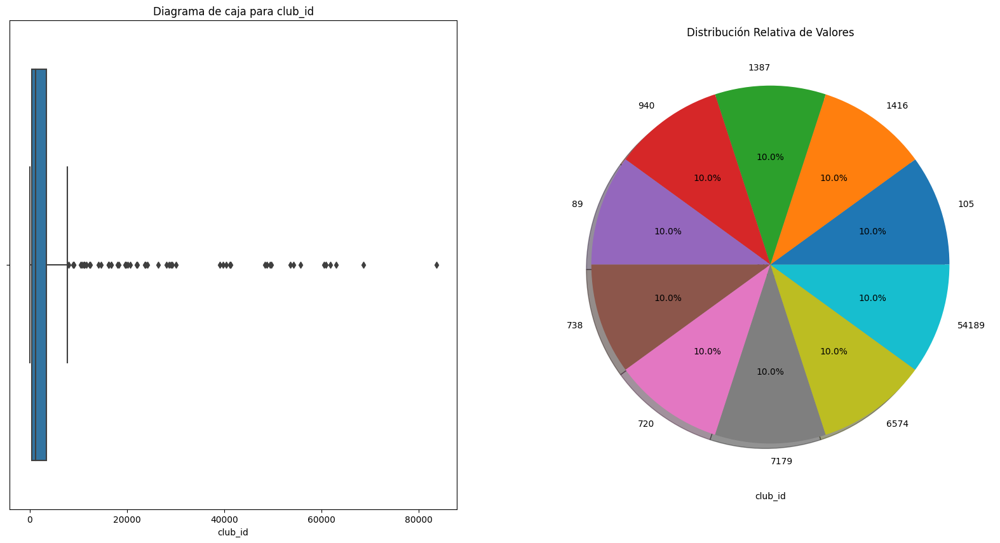



Estadísticas Básicas


count      426.000000
mean      5314.525822
std      11752.013818
min          3.000000
25%        421.000000
50%       1139.500000
75%       3415.750000
max      83678.000000
Name: club_id, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




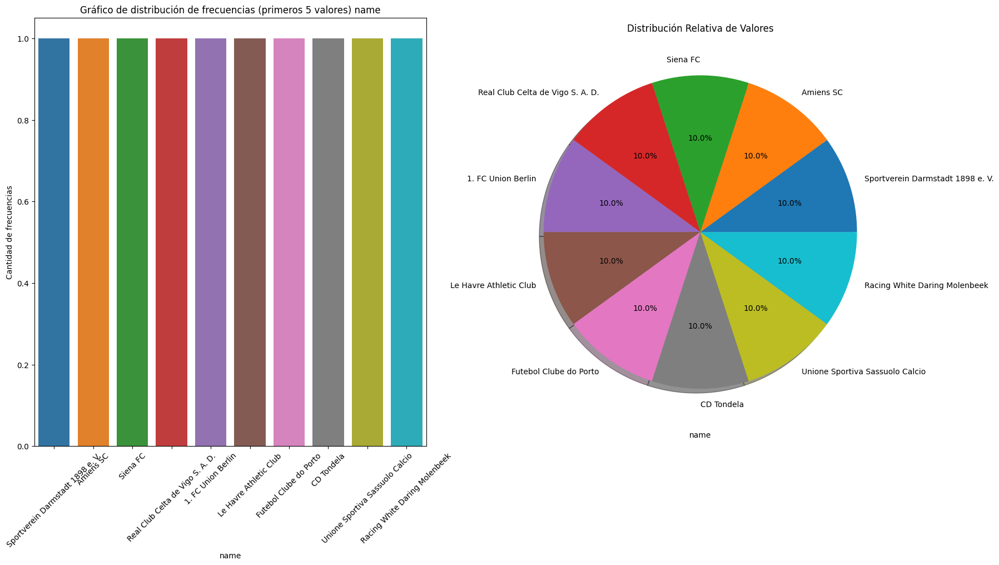



Estadísticas Básicas


count                                  426
unique                                 426
top       Sportverein Darmstadt 1898 e. V.
freq                                     1
Name: name, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




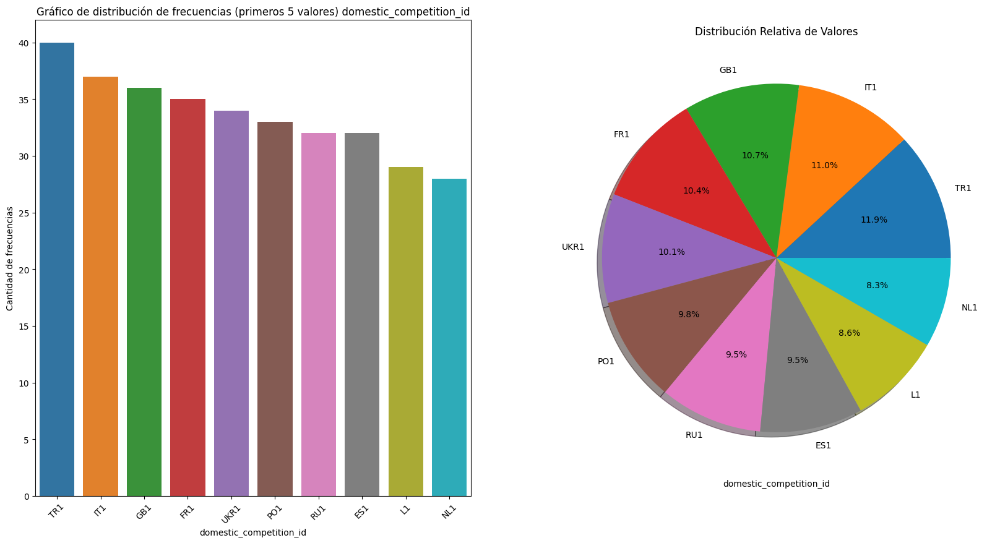



Estadísticas Básicas


count     426
unique     14
top       TR1
freq       40
Name: domestic_competition_id, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




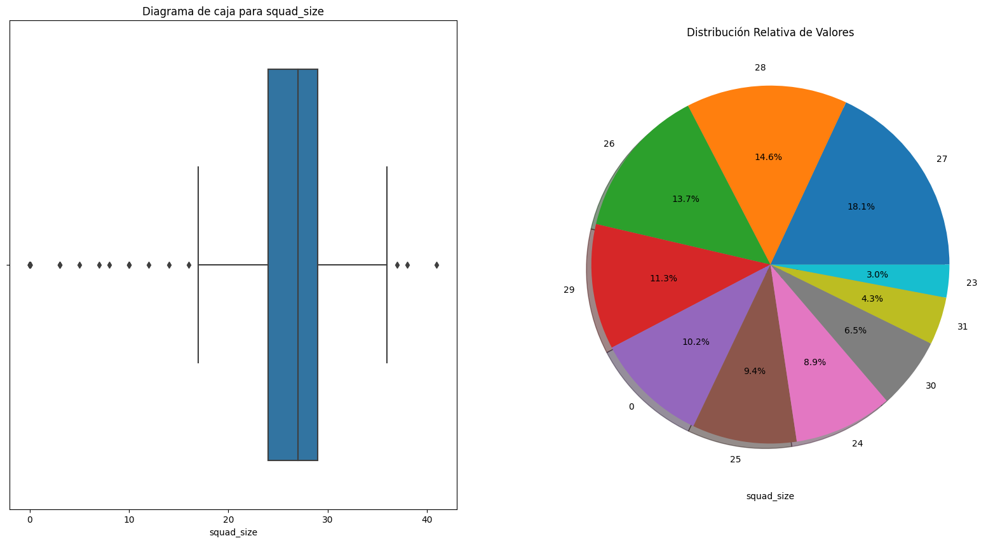



Estadísticas Básicas


count    426.000000
mean      24.288732
std        8.735255
min        0.000000
25%       24.000000
50%       27.000000
75%       29.000000
max       41.000000
Name: squad_size, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




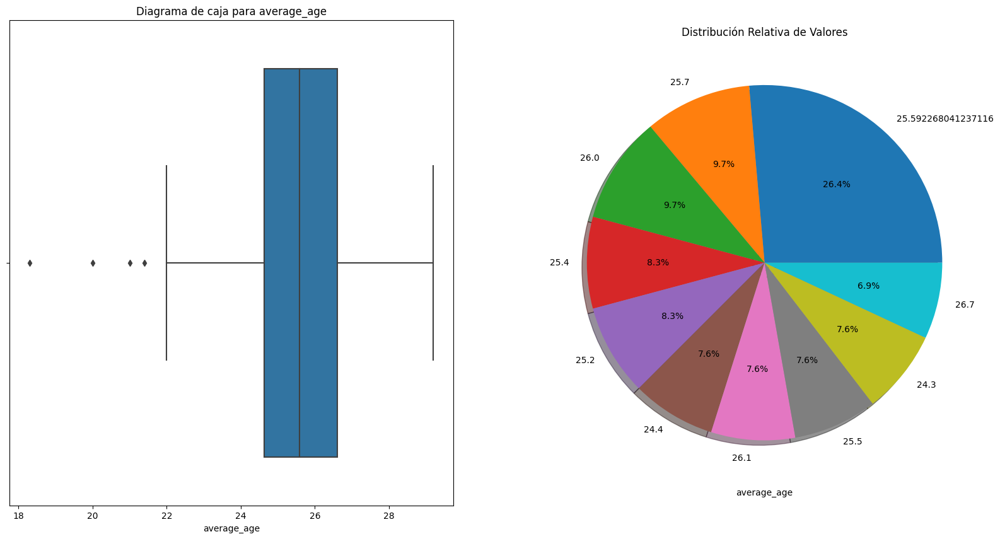



Estadísticas Básicas


count    426.000000
mean      25.592268
std        1.501965
min       18.300000
25%       24.625000
50%       25.592268
75%       26.600000
max       29.200000
Name: average_age, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




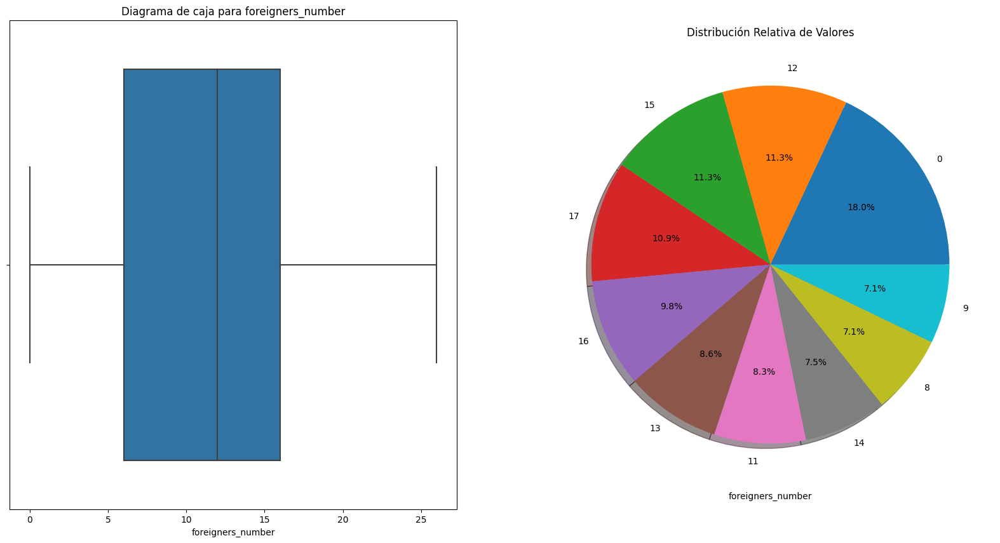



Estadísticas Básicas


count    426.000000
mean      10.992958
std        6.617798
min        0.000000
25%        6.000000
50%       12.000000
75%       16.000000
max       26.000000
Name: foreigners_number, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




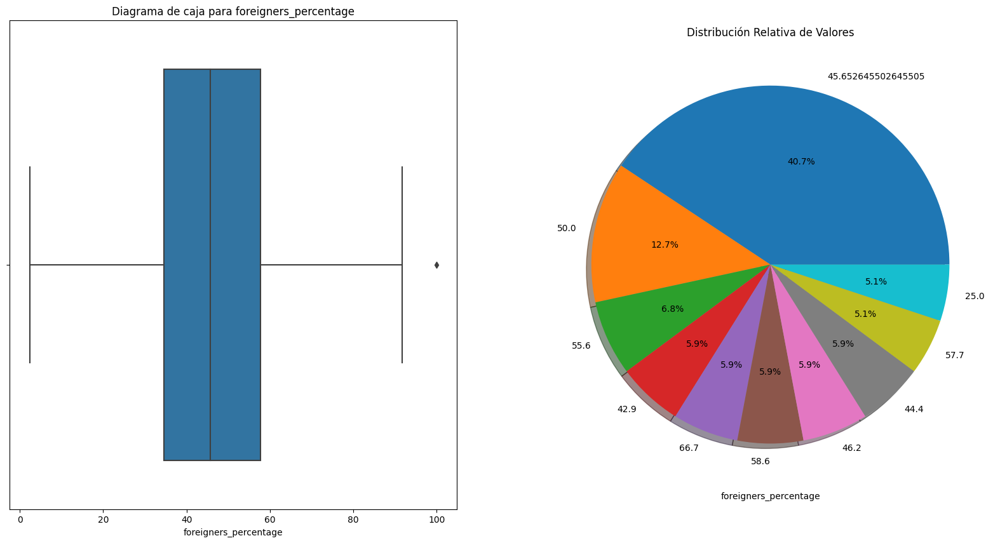



Estadísticas Básicas


count    426.000000
mean      45.652646
std       18.654194
min        2.400000
25%       34.500000
50%       45.652646
75%       57.700000
max      100.000000
Name: foreigners_percentage, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




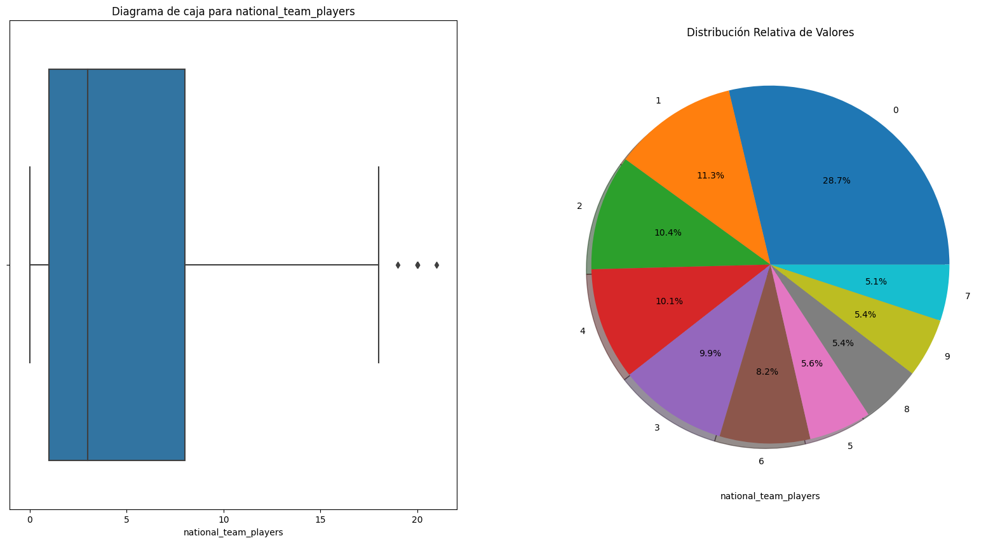



Estadísticas Básicas


count    426.000000
mean       4.866197
std        4.982646
min        0.000000
25%        1.000000
50%        3.000000
75%        8.000000
max       21.000000
Name: national_team_players, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




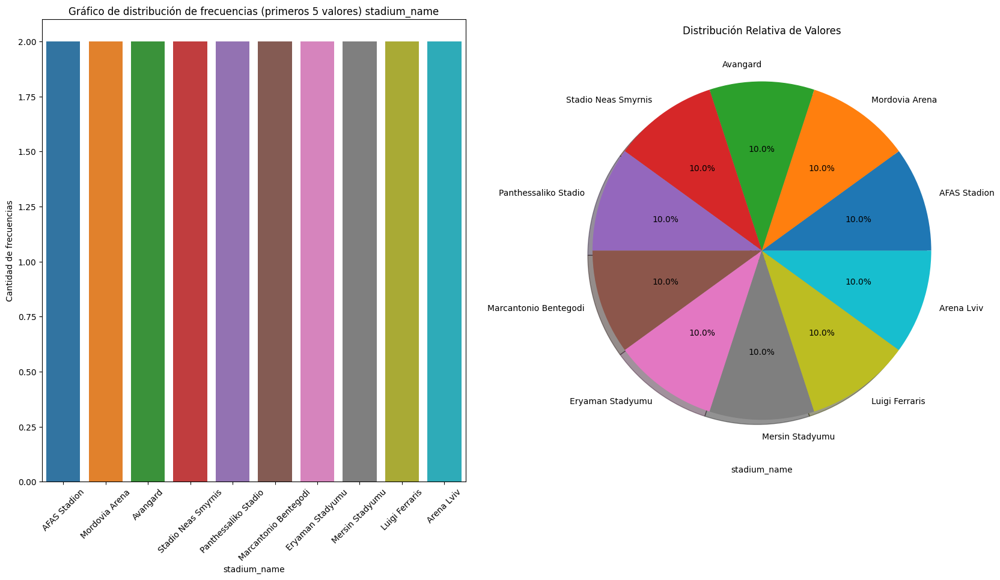



Estadísticas Básicas


count              426
unique             410
top       AFAS Stadion
freq                 2
Name: stadium_name, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




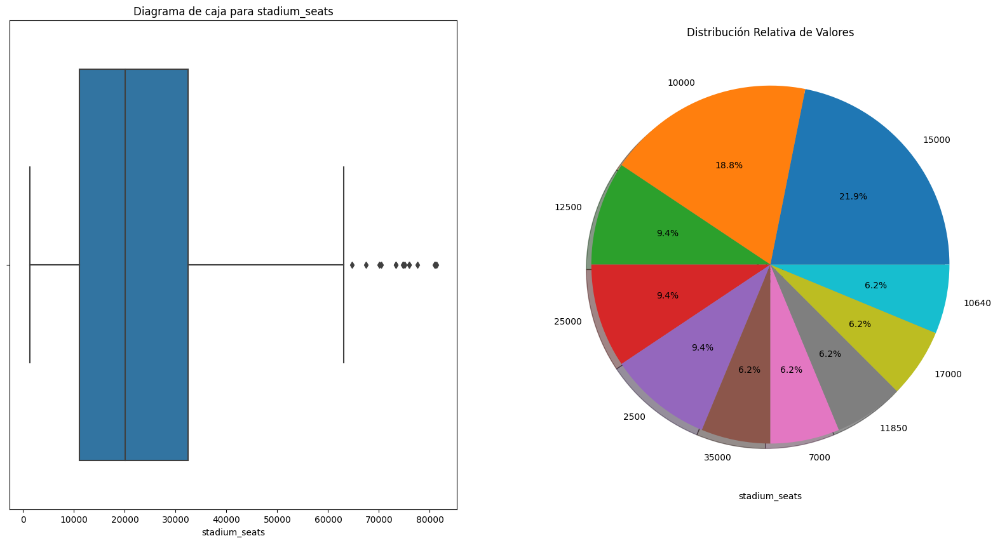



Estadísticas Básicas


count      426.000000
mean     24299.420188
std      17192.103990
min       1312.000000
25%      11024.500000
50%      20046.000000
75%      32448.000000
max      81365.000000
Name: stadium_seats, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




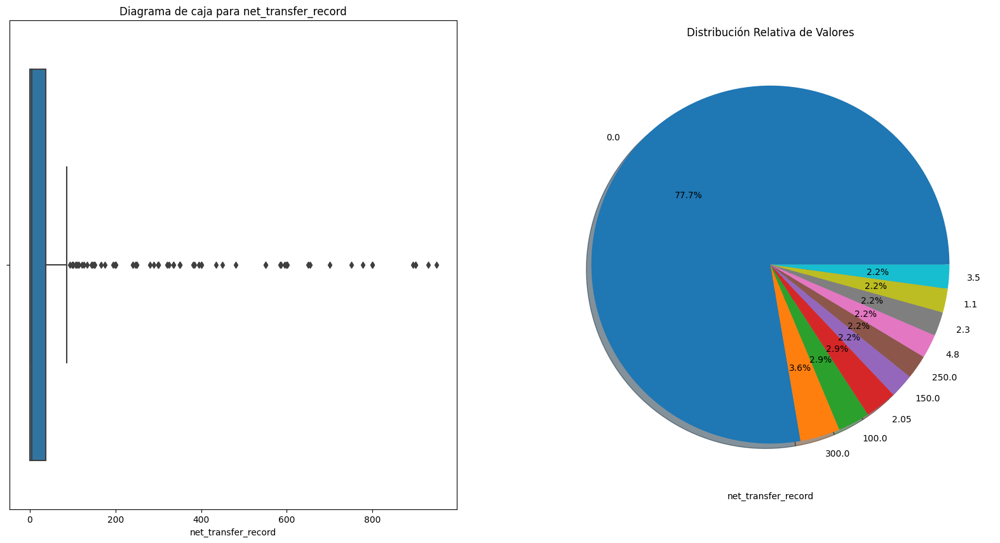



Estadísticas Básicas


count    426.000000
mean      74.183709
std      171.742563
min        0.000000
25%        0.000000
50%        5.340000
75%       37.137500
max      950.000000
Name: net_transfer_record, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




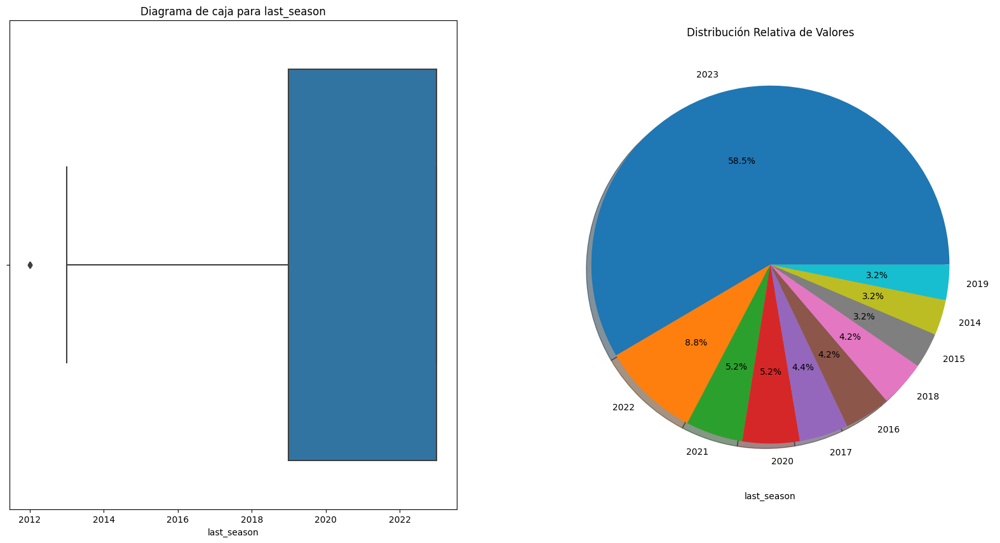



Estadísticas Básicas


count     426.000000
mean     2020.830986
std         3.207283
min      2012.000000
25%      2019.000000
50%      2023.000000
75%      2023.000000
max      2023.000000
Name: last_season, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




In [84]:
r.descripcion_distribucion(df_clubs)

### Tamaño promedio de plantillas en clubes

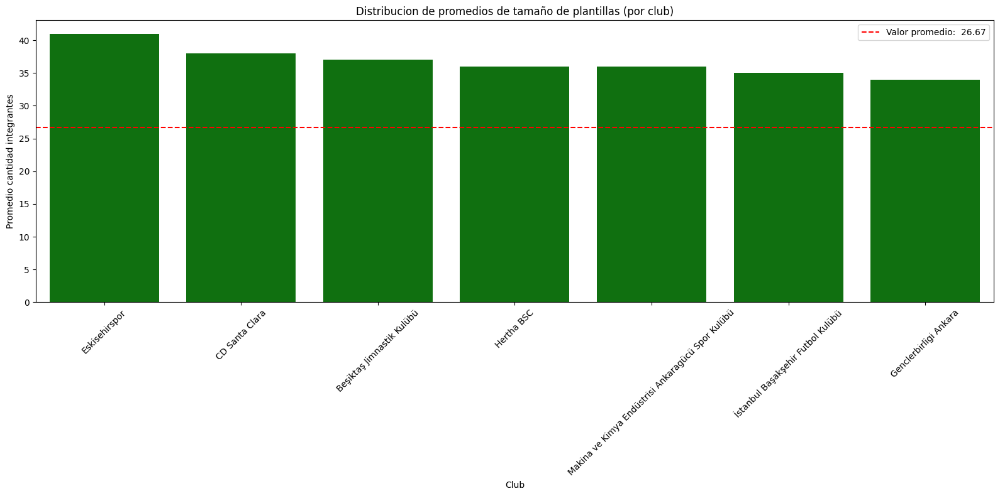

,club_id,name,squad_size
0,825,Eskisehirspor,41.0
1,2423,CD Santa Clara,38.0
2,114,Beşiktaş Jimnastik Kulübü,37.0
3,44,Hertha BSC,36.0
4,868,Makina ve Kimya Endüstrisi Ankaragücü Spor Kulübü,36.0
...,...,...,...
383,8838,Zirka Kropyvnytskyi,7.0
384,3558,GFC Ajaccio,5.0
385,18105,PFK Lviv,3.0
386,2323,Orduspor,3.0


In [37]:
r.tamaño_promedio_plantillas(df_clubs)

El valor promedio de integrantes de una plantilla en clubes es de alrededor de 27, lo que nos indica que un equipo que no necesariamente es un indicador de mayor nivel de un club, ya que como vemos, los primeros puestos estan ocupados por equipos de tabla media-baja en torneos de baja competitividad y calidad general.

Tambien podemos observar que se presentan muchos clubes con valores extremos muy bajos, lo que pude presentarse por error, incapacidad de registro, entre otros motivos

### Cantidad de jugadores extranjeros por club

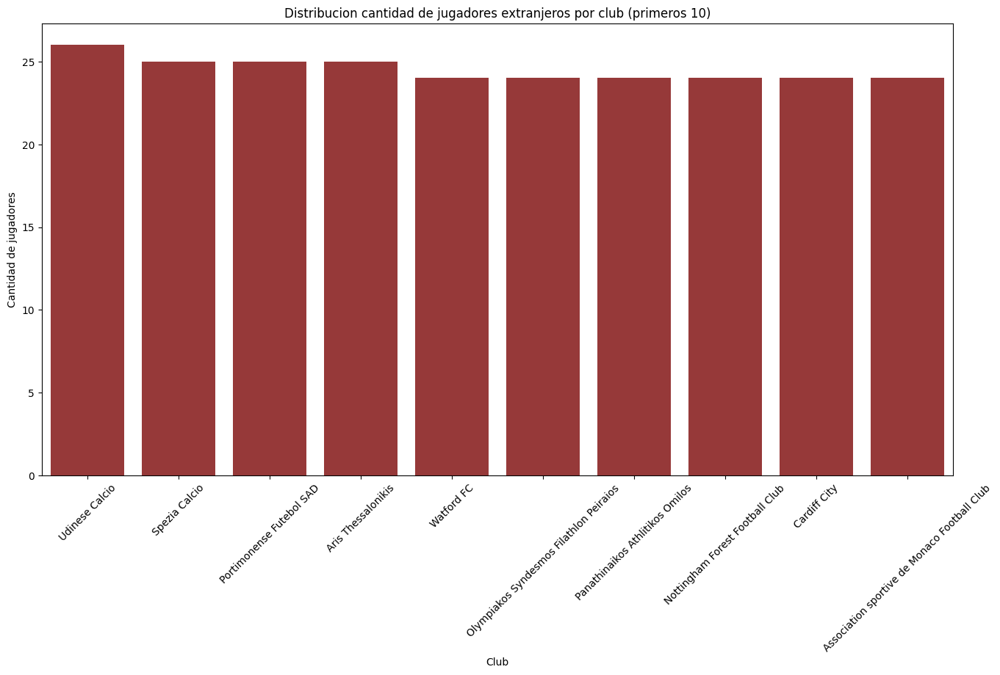

,club_id,name,foreigners_number
0,410,Udinese Calcio,26
1,3522,Spezia Calcio,25
2,7378,Portimonense Futebol SAD,25
3,605,Aris Thessalonikis,25
4,1010,Watford FC,24
5,683,Olympiakos Syndesmos Filathlon Peiraios,24
6,265,Panathinaikos Athlitikos Omilos,24
7,703,Nottingham Forest Football Club,24
8,603,Cardiff City,24
9,162,Association sportive de Monaco Football Club,24


In [5]:
r.extranjeros_x_club(df_clubs)

Este grafico nos muestra los 10 clubes que tuvieron mas registros de jugadores extranjeros en su plantilla, tomemos en cuenta que el promedio de tamaño de una plantilla en un club es de alrededor de 27, vemos que estos clubes cuentan con una gran porcentaje mayoritario de jugadores extranjeros en su plantilla.

### Número de jugadores en selecciones nacionales

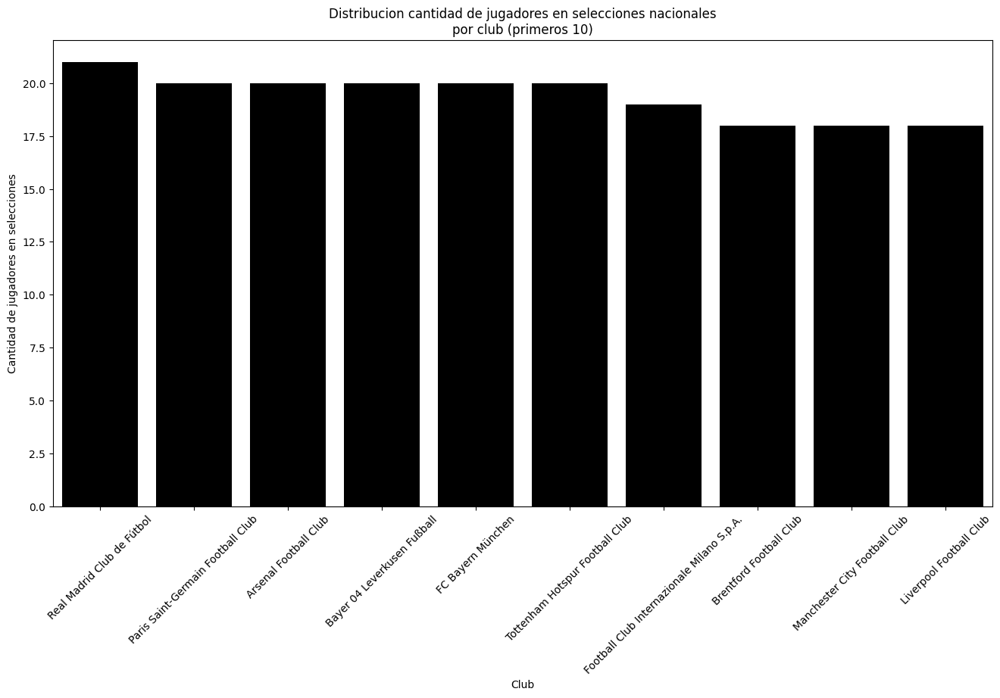

,club_id,name,national_team_players
0,418,Real Madrid Club de Fútbol,21
1,583,Paris Saint-Germain Football Club,20
2,11,Arsenal Football Club,20
3,15,Bayer 04 Leverkusen Fußball,20
4,27,FC Bayern München,20
5,148,Tottenham Hotspur Football Club,20
6,46,Football Club Internazionale Milano S.p.A.,19
7,1148,Brentford Football Club,18
8,281,Manchester City Football Club,18
9,31,Liverpool Football Club,18


In [11]:
r.jugadores_en_selecciones(df_clubs)

Aqui vemos la cantidad de jugadores en selecciones nacionales de cada plantilla. Tener jugadores en selecciones puede ser un indicador de calidad para el club en particular y para la liga/torneo en general, ya que los jugadores comvocados para integrar la seleccion de cada nacion, son los de mejor rendimiento actual, general o historico o una combinacion de estos 3 aspectos.

Dicho esto, vemos que 5 de los 10 clubes con mas cantidad de jugadores de seleccion, pertenecen a la liga inglesa (Premier League), 2 a la Liga de España, 2 a la Liga Alemana (Bundesliga) y uno a la liga de Italia (Scudetto)

### Relación entre la capacidad del estadio y el tamaño del club


Valor de Correlacioin lineal entre la capacidad del estadio y el tamaño del club:

               stadium_seats  squad_size
stadium_seats       1.000000    0.158656
squad_size          0.158656    1.000000


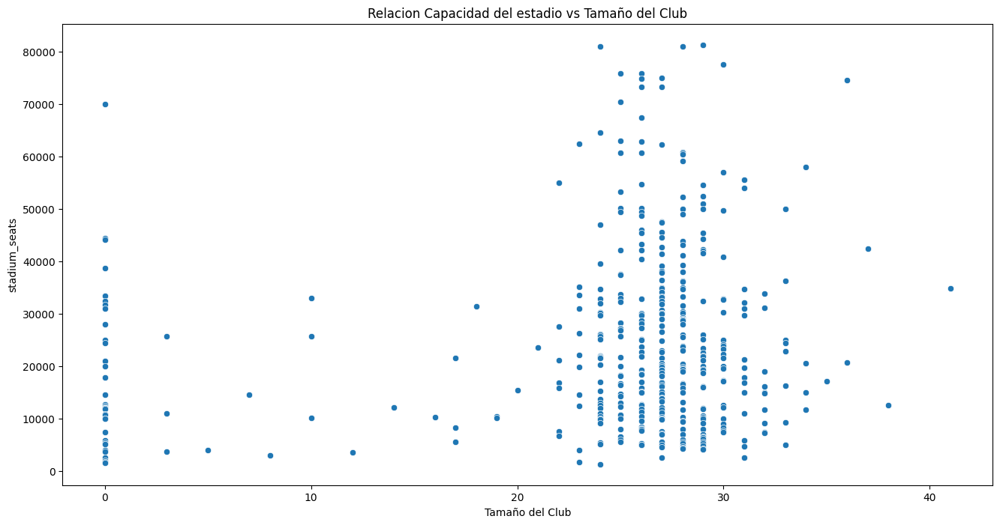

,club_id,name,stadium_seats,squad_size
178,16,Borussia Dortmund,81365,29
281,418,Real Madrid Club de Fútbol,81044,24
174,1186,Torpedo Moscow,81000,28
236,6646,Fatih Karagümrük Sportif Faaliyetler San. Tic....,77563,30
309,5,Associazione Calcio Milan,75923,26
...,...,...,...,...
341,6894,Kayseri Erciyesspor,2000,0
129,49364,Ingulets Petrove,1720,23
225,23611,Olimpik Donetsk,1678,0
254,2700,Anzhi Makhachkala ( -2022),1600,0


In [18]:
r.estadio_x_tamaño_club(df_clubs)

Por lo que podemos ver, no existe una correlacion clara entre las variables de tamaño de club con capacidad del estadio, esto se puede ver graficamente en el grafico con la dispersion irregular de los valores, y en el valor estadistico de correlacion lineal de Pearson, que mientras el valor se acerque mas a 0 menor grado de correlacion hay entre las variables (el valor resultante es del 0,15).

### Registro neto de transferencias por club

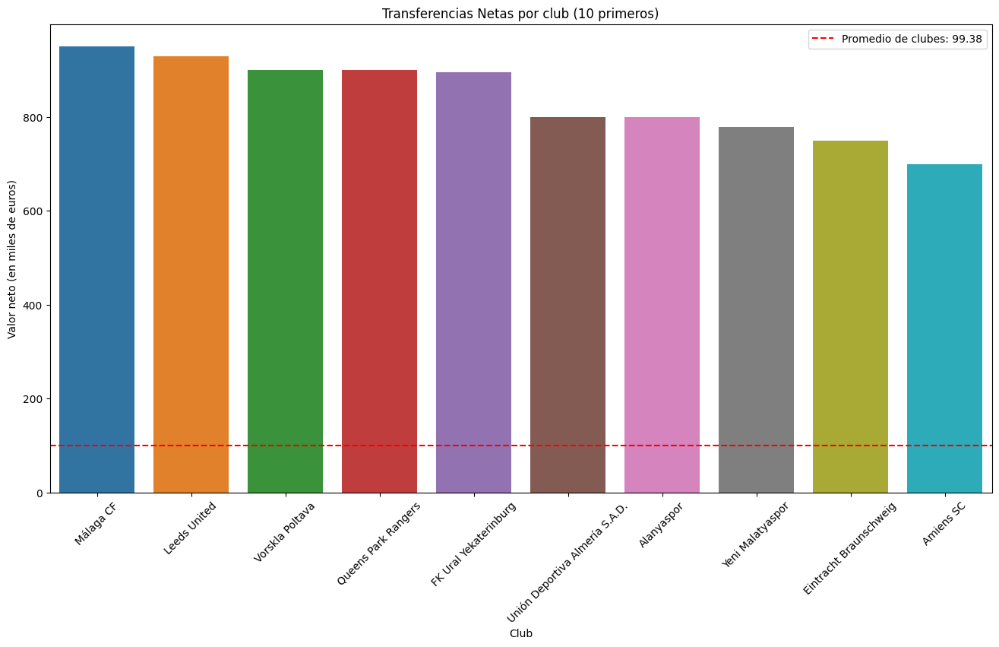

,name,net_transfer_record
170,Málaga CF,950.0
414,Leeds United,930.0
41,Vorskla Poltava,900.0
196,Queens Park Rangers,900.0
1,FK Ural Yekaterinburg,895.0
330,Unión Deportiva Almería S.A.D.,800.0
243,Alanyaspor,800.0
9,Yeni Malatyaspor,778.0
352,Eintracht Braunschweig,750.0
292,Amiens SC,700.0


In [13]:
r.transferencias_x_club(df_clubs)

En este caso, eliminamos las transferencias que contaban con valores 0, ya que pueden ser producidas por falta de datos o por valores nulos que se rellenaron.

Dicho esto, vemos que el valor promedio neto de transferencia es de €99 mil euros (esto es, sopezando los ingresos por transferencias y los gastos por transferencias). Se debe tener en cuenta que los clubes tienen muchas fuentes y vias de generacion de ingresos, por lo que no siempre es negativo el hecho de contar con un bajo saldo positivo neto en transferencias (o un saldo negativo)

## Competitions

<h2 align= 'center'><u>Informe Preliminar</u></h2>

### <h3 align= 'center'><u>General</u></h3>

In [85]:
r.informe_dataframe(df_competitions)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 43
Columnas: 10

--Numero de datos--
430

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 42
Columnas: ['competition_id', 'competition_code', 'name', 'sub_type', 'type', 'country_id', 'country_name', 'domestic_league_code', 'confederation', 'is_major_national_league']

--Tipo de columnas--
competition_id              object
competition_code            object
name                        object
sub_type                    object
type                        object
country_id                   int64
country_name                object
domestic_league_code        object
confederation               object
is_major_national_league    object
dtype: object
--Cantidad de registros duplicados--
0



'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [86]:
r.verificar_tipo_datos(df_competitions)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,competition_id,[<class 'str'>],100.0,0.0,0
1,competition_code,[<class 'str'>],100.0,0.0,0
2,name,[<class 'str'>],100.0,0.0,0
3,sub_type,[<class 'str'>],100.0,0.0,0
4,type,[<class 'str'>],100.0,0.0,0
5,country_id,[<class 'int'>],100.0,0.0,0
6,country_name,[<class 'str'>],100.0,0.0,0
7,domestic_league_code,[<class 'str'>],100.0,0.0,0
8,confederation,[<class 'str'>],100.0,0.0,0
9,is_major_national_league,[<class 'str'>],100.0,0.0,0


### <h3 align= 'center'><u>Particular</u></h3>

In [87]:
for columna in df_competitions.columns:
    r.informe_columna(df_competitions, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE competition_id:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
43

--Valores unicos en la columna (Primeros 5 valores)--
['CIT' 'NLSC' 'GRP' 'POSU' 'RUSS']

--Moda de la columna especificada--
Valor modal -----> CIT
Frecuencia acumulada ------> 1

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 CIT     1
L1      1
UKR1    1
Name: competition_id, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE competition_code:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
42

--Valores unicos en la columna (Primeros 5 valores)--
['italy-cup' 'johan-cruijff-schaal' 'kypello-elladas'
 'supertaca-candido-de-oliveira' 'rus

### <h3 size= 22 align= 'center'><u>Análisis Descriptivo</u></h3>

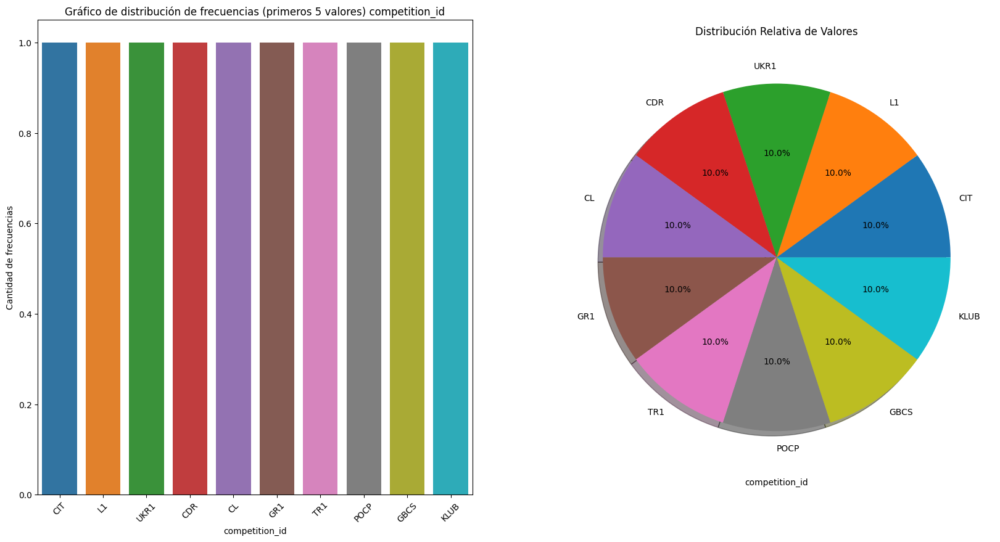



Estadísticas Básicas


count      43
unique     43
top       CIT
freq        1
Name: competition_id, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




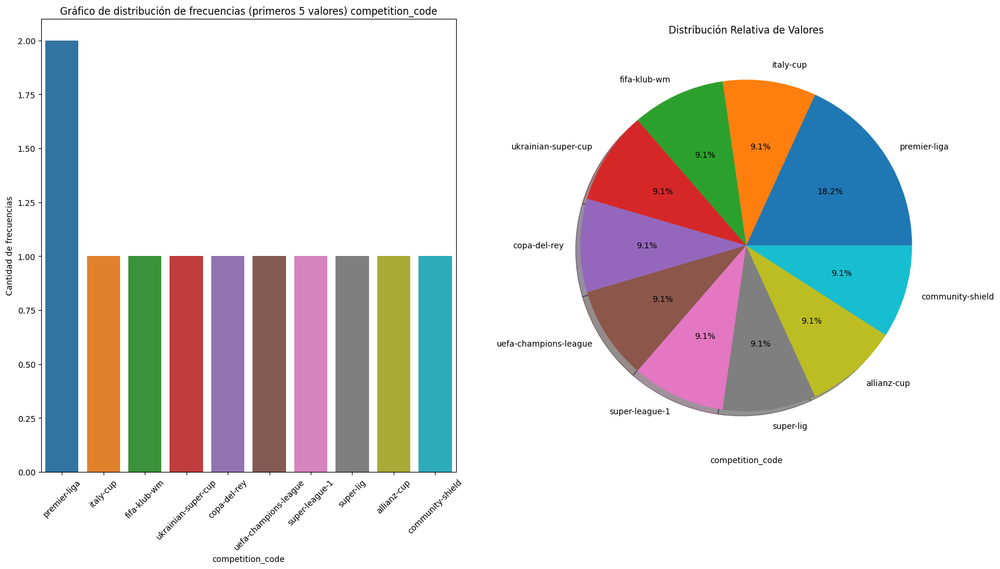



Estadísticas Básicas


count               43
unique              42
top       premier-liga
freq                 2
Name: competition_code, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




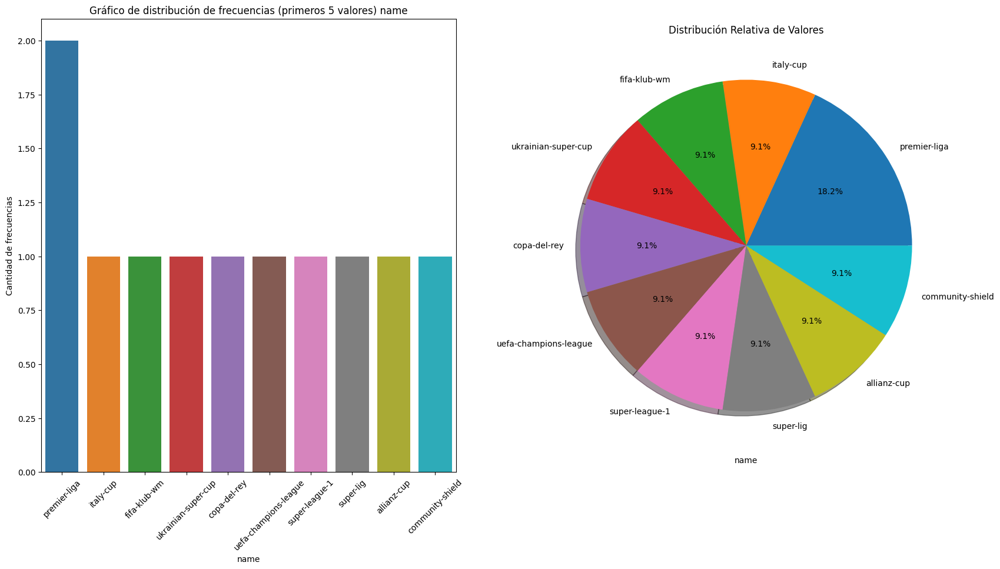



Estadísticas Básicas


count               43
unique              42
top       premier-liga
freq                 2
Name: name, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




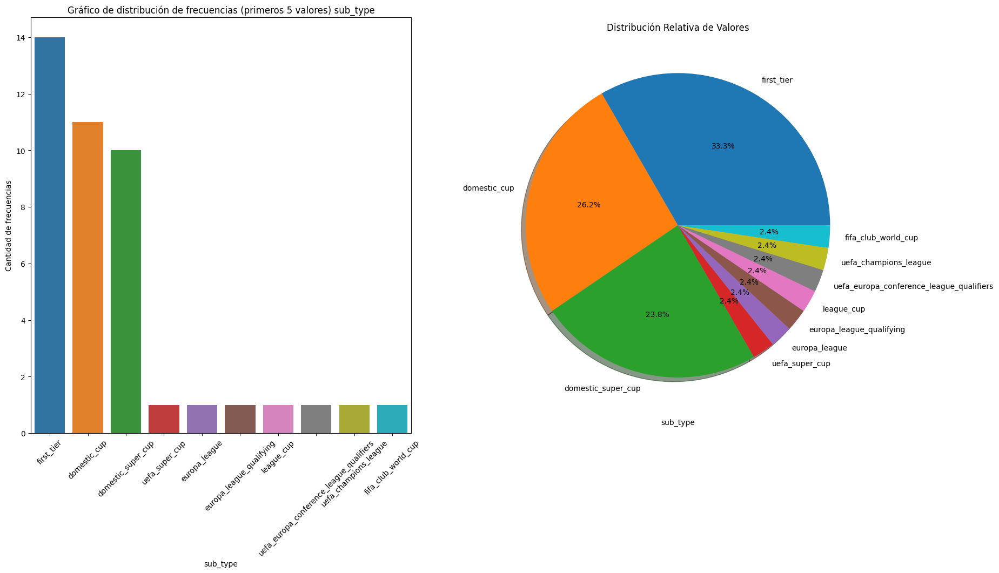



Estadísticas Básicas


count             43
unique            11
top       first_tier
freq              14
Name: sub_type, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




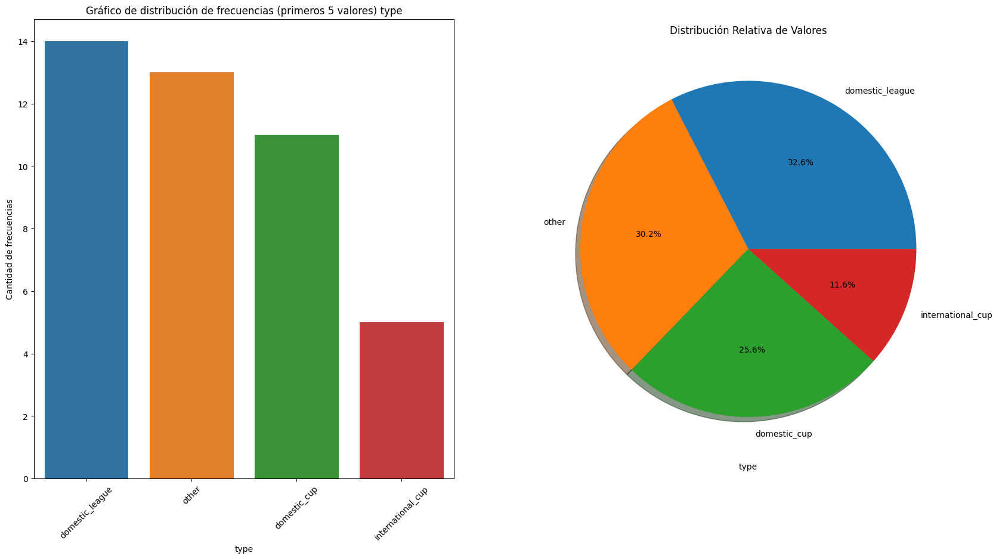



Estadísticas Básicas


count                  43
unique                  4
top       domestic_league
freq                   14
Name: type, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




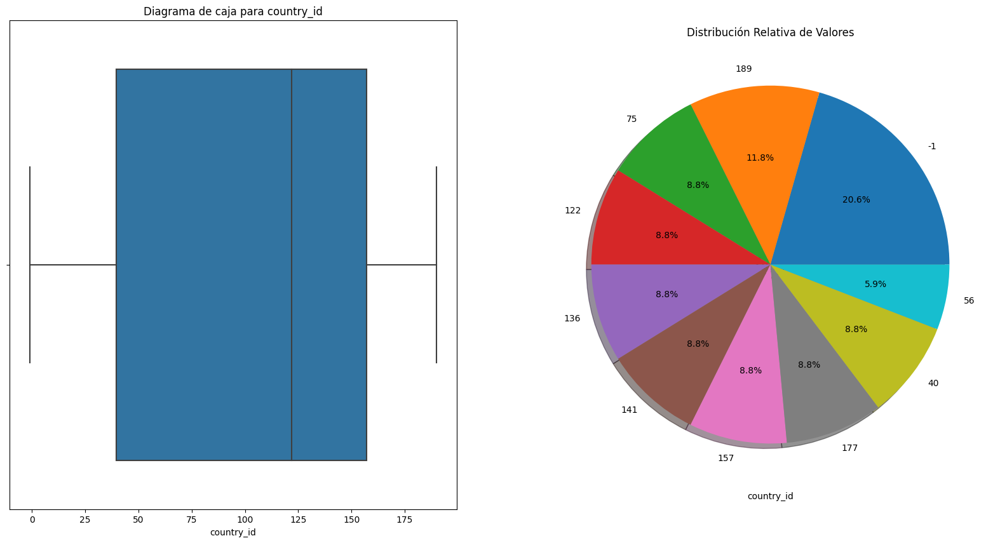



Estadísticas Básicas


count     43.000000
mean      97.093023
std       69.766896
min       -1.000000
25%       39.500000
50%      122.000000
75%      157.000000
max      190.000000
Name: country_id, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




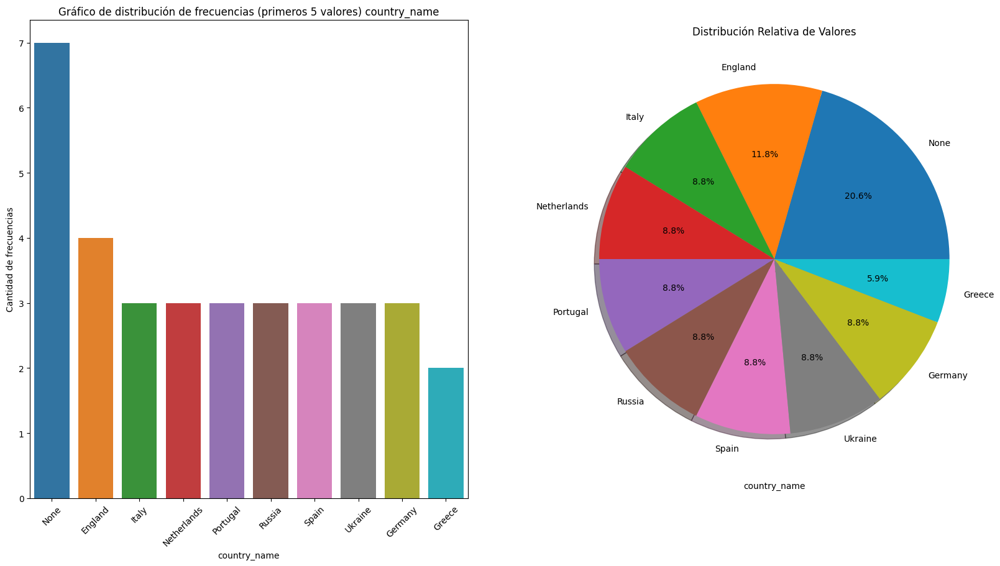



Estadísticas Básicas


count       43
unique      15
top       None
freq         7
Name: country_name, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




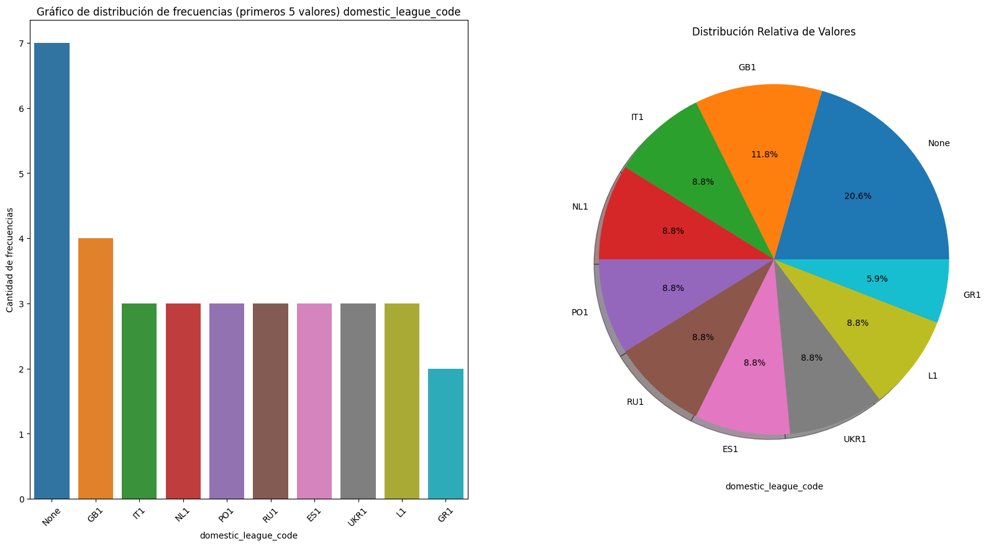



Estadísticas Básicas


count       43
unique      15
top       None
freq         7
Name: domestic_league_code, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




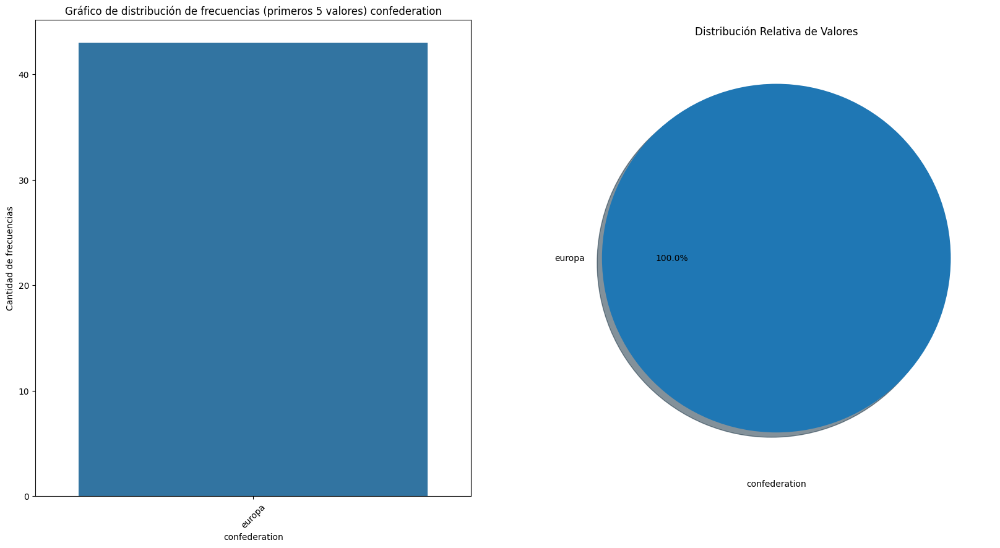



Estadísticas Básicas


count         43
unique         1
top       europa
freq          43
Name: confederation, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




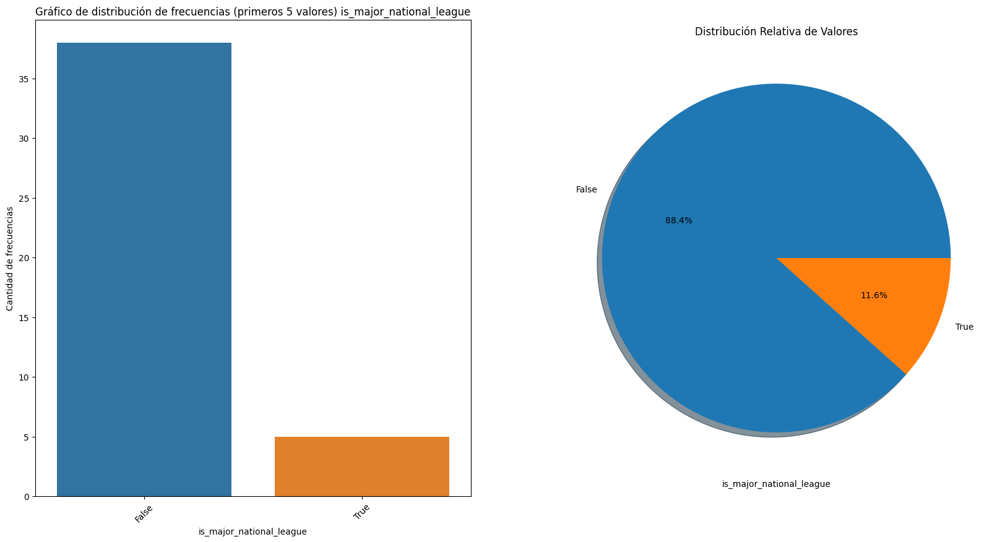



Estadísticas Básicas


count        43
unique        2
top       False
freq         38
Name: is_major_national_league, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




In [88]:
r.descripcion_distribucion(df_competitions)

### Competiciones por tipo

In [ ]:
r.

## Game_events

<h2 align= 'center'><u>Informe Preliminar</u></h2>

### <h3 align= 'center'><u>General</u></h3>

In [89]:
r.informe_dataframe(df_game_events)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 737339
Columnas: 9

--Numero de datos--
6636051

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 737338
Columnas: ['game_event_id', 'date', 'game_id', 'minute', 'type', 'club_id', 'player_id', 'player_in_id', 'player_assist_id']

--Tipo de columnas--
game_event_id               object
date                datetime64[ns]
game_id                      int64
minute                       int64
type                        object
club_id                      int64
player_id                    int64
player_in_id                 int64
player_assist_id             int64
dtype: object
--Cantidad de registros duplicados--
0



'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [90]:
r.verificar_tipo_datos(df_game_events)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,game_event_id,[<class 'str'>],100.0,0.0,0
1,date,[<class 'pandas._libs.tslibs.timestamps.Timest...,100.0,0.0,0
2,game_id,[<class 'int'>],100.0,0.0,0
3,minute,[<class 'int'>],100.0,0.0,0
4,type,[<class 'str'>],100.0,0.0,0
5,club_id,[<class 'int'>],100.0,0.0,0
6,player_id,[<class 'int'>],100.0,0.0,0
7,player_in_id,[<class 'int'>],100.0,0.0,0
8,player_assist_id,[<class 'int'>],100.0,0.0,0


### <h3 align= 'center'><u>Particular</u></h3>

In [91]:
for columna in df_game_events.columns:
    r.informe_columna(df_game_events, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE game_event_id:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
737339

--Valores unicos en la columna (Primeros 5 valores)--
['2f41da30c471492e7d4a984951671677' 'a72f7186d132775f234d3e2f7bc0ed5b'
 'b2d721eaed4692a5c59a92323689ef18' 'aef768899cedac0c9a650980219075a2'
 '5d6d9533023057b6619ecd145a038bbe']

--Moda de la columna especificada--
Valor modal -----> 2f41da30c471492e7d4a984951671677
Frecuencia acumulada ------> 1

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 2f41da30c471492e7d4a984951671677    1
ca9cb564fc129d2aff57c96df41485cb    1
c7183f6fd6797793af705e3bae4e9d69    1
Name: game_event_id, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA

### <h3 size= 22 align= 'center'><u>Análisis Descriptivo</u></h3>

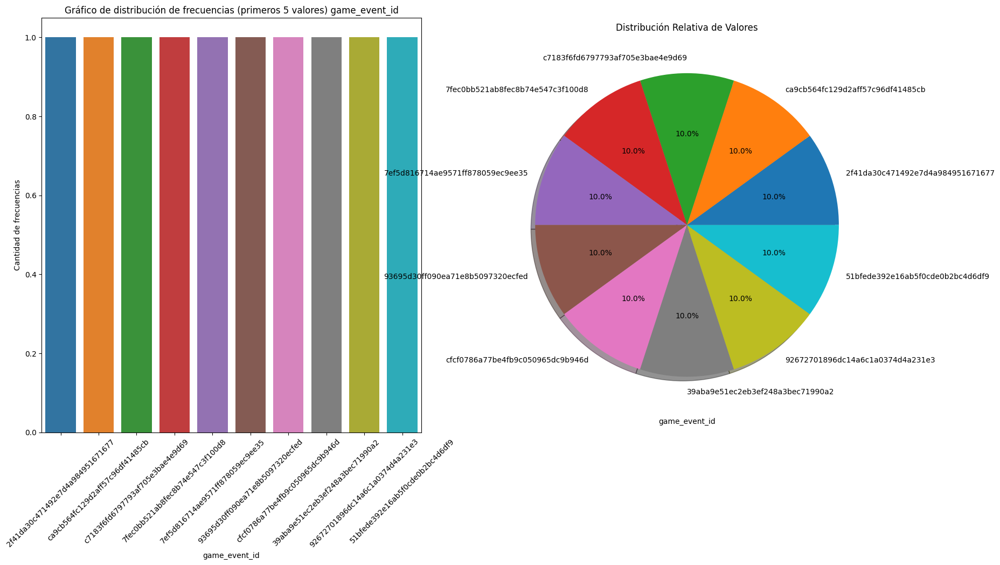



Estadísticas Básicas


count                               737339
unique                              737339
top       2f41da30c471492e7d4a984951671677
freq                                     1
Name: game_event_id, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




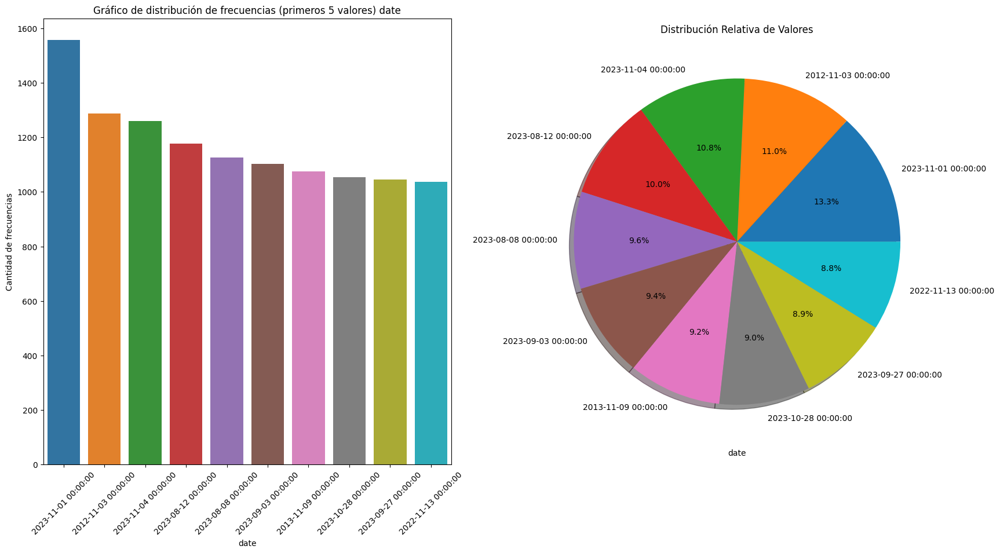



Estadísticas Básicas


count                  737339
unique                   3559
top       2023-11-01 00:00:00
freq                     1557
first     2012-07-03 00:00:00
last      2024-05-16 00:00:00
Name: date, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




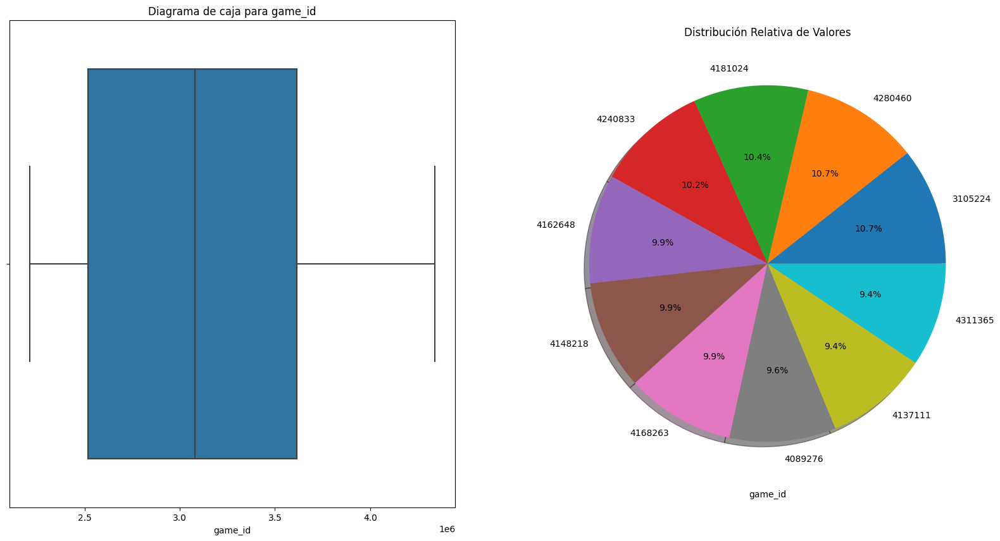



Estadísticas Básicas


count    7.373390e+05
mean     3.117010e+06
std      6.323039e+05
min      2.211607e+06
25%      2.518617e+06
50%      3.080219e+06
75%      3.614544e+06
max      4.340617e+06
Name: game_id, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




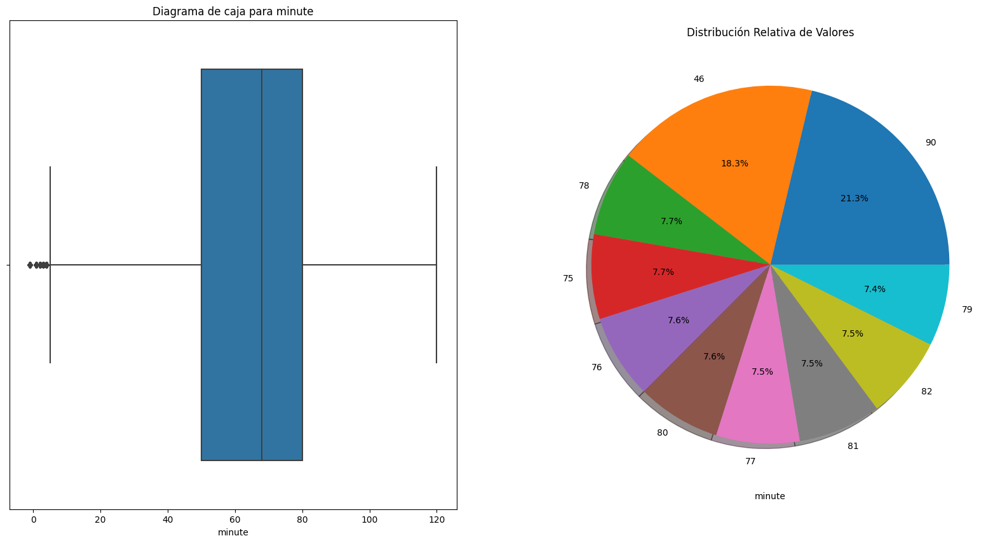



Estadísticas Básicas


count    737339.000000
mean         63.273363
std          22.216079
min          -1.000000
25%          50.000000
50%          68.000000
75%          80.000000
max         120.000000
Name: minute, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




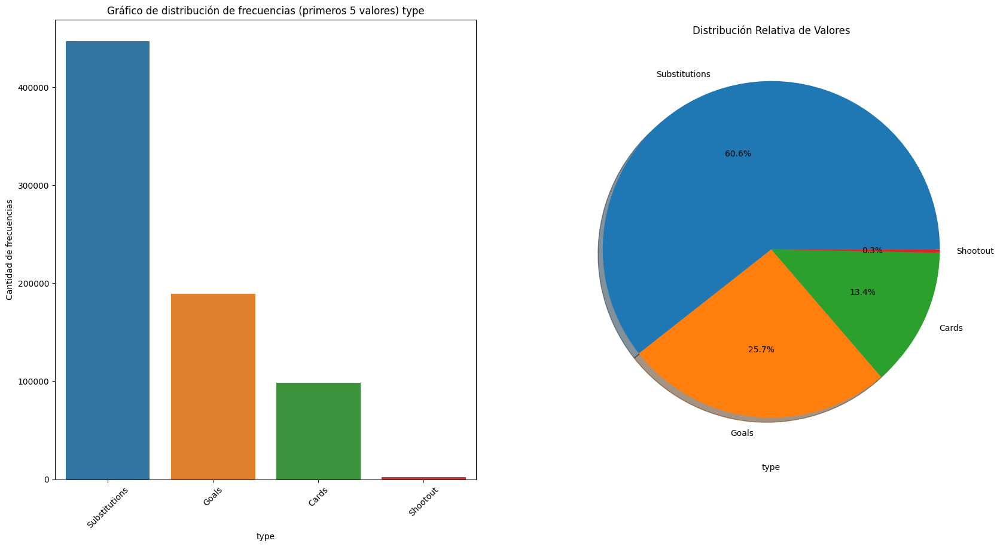



Estadísticas Básicas


count            737339
unique                4
top       Substitutions
freq             446932
Name: type, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




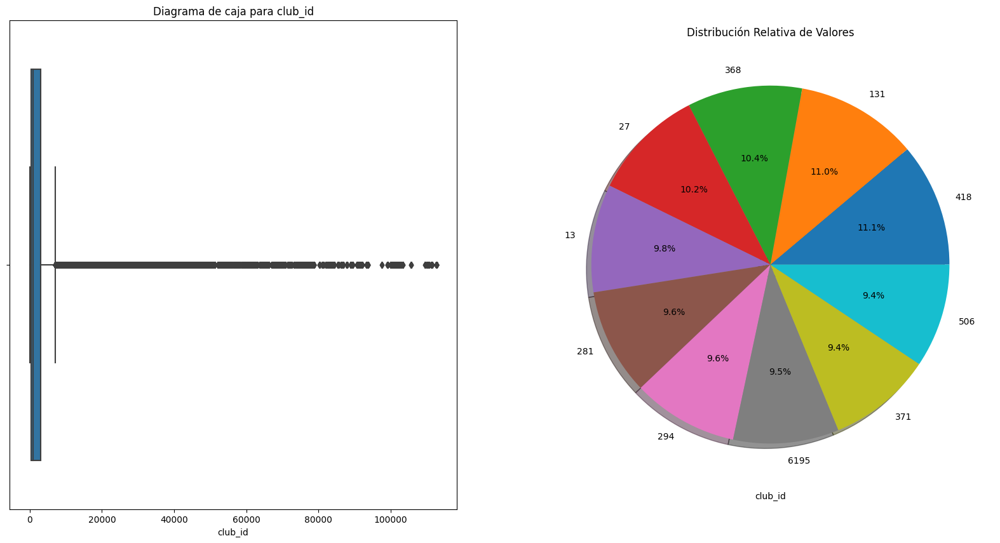



Estadísticas Básicas


count    737339.000000
mean       4564.726308
std       10834.028811
min           1.000000
25%         338.000000
50%         982.000000
75%        3023.000000
max      112755.000000
Name: club_id, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




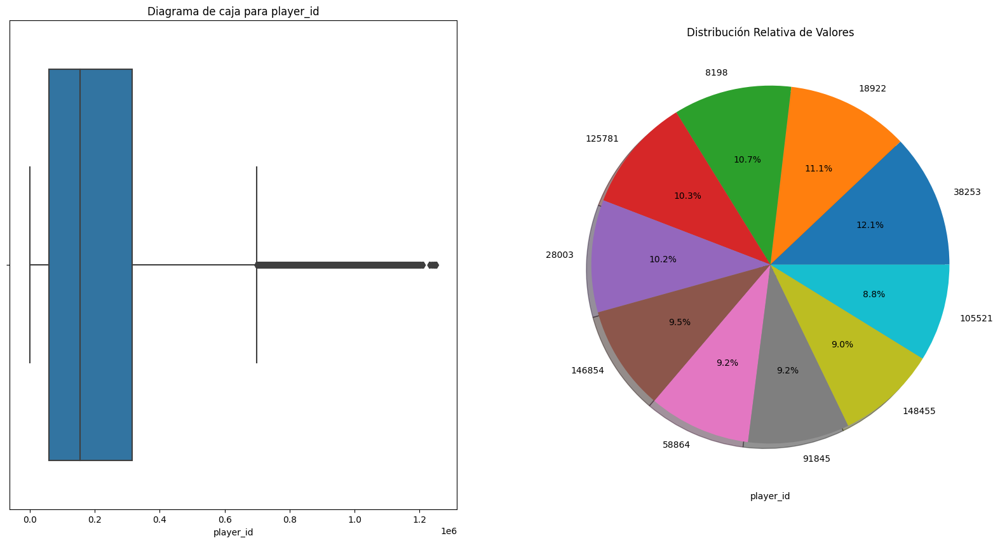



Estadísticas Básicas


count    7.373390e+05
mean     2.126078e+05
std      1.949348e+05
min      1.000000e+01
25%      5.934400e+04
50%      1.553950e+05
75%      3.151100e+05
max      1.252661e+06
Name: player_id, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




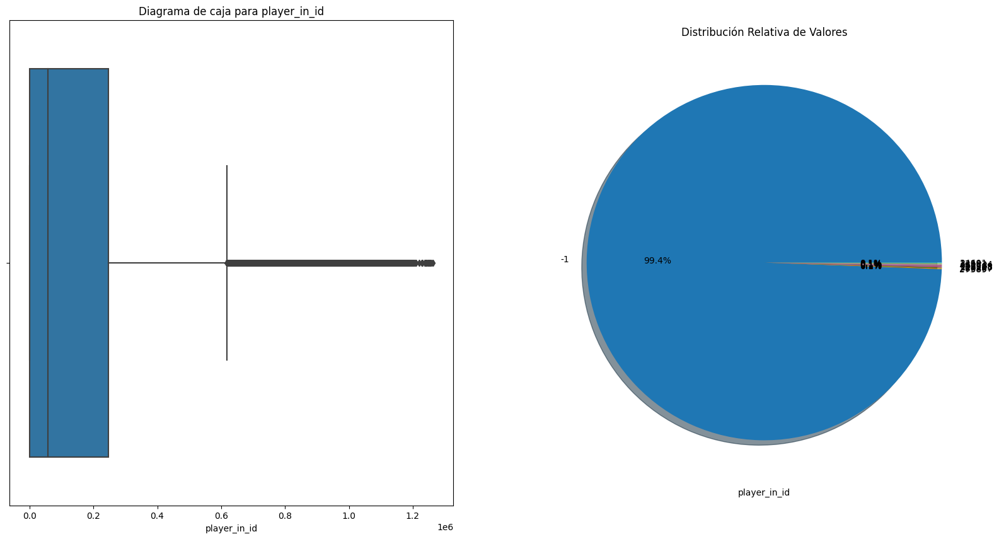



Estadísticas Básicas


count    7.373390e+05
mean     1.536055e+05
std      2.087472e+05
min     -1.000000e+00
25%     -1.000000e+00
50%      5.651800e+04
75%      2.473660e+05
max      1.264192e+06
Name: player_in_id, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




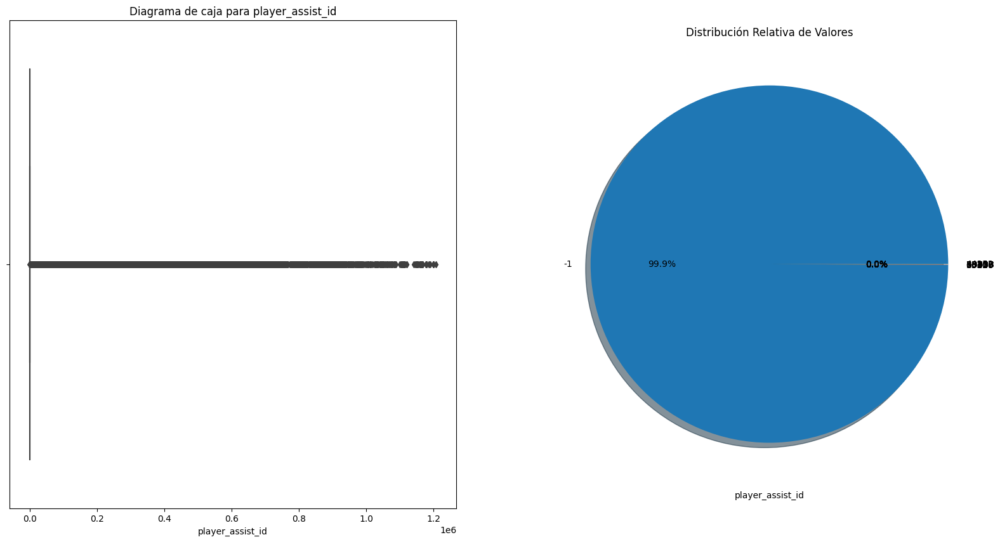



Estadísticas Básicas


count    7.373390e+05
mean     1.154430e+04
std      6.546994e+04
min     -1.000000e+00
25%     -1.000000e+00
50%     -1.000000e+00
75%     -1.000000e+00
max      1.207623e+06
Name: player_assist_id, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




In [92]:
r.descripcion_distribucion(df_game_events)

## Game_lineups

<h2 align= 'center'><u>Informe Preliminar</u></h2>

### <h3 align= 'center'><u>General</u></h3>

In [93]:
r.informe_dataframe(df_game_lineups)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 2191911
Columnas: 10

--Numero de datos--
21919110

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 2191910
Columnas: ['game_lineups_id', 'date', 'game_id', 'player_id', 'club_id', 'player_name', 'type', 'position', 'number', 'team_captain']

--Tipo de columnas--
game_lineups_id            object
date               datetime64[ns]
game_id                     int64
player_id                   int64
club_id                     int64
player_name                object
type                       object
position                   object
number                      int64
team_captain                int64
dtype: object
--Cantidad de registros duplicados--
0



'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [94]:
r.verificar_tipo_datos(df_game_lineups)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,game_lineups_id,[<class 'str'>],100.0,0.0,0
1,date,[<class 'pandas._libs.tslibs.timestamps.Timest...,100.0,0.0,0
2,game_id,[<class 'int'>],100.0,0.0,0
3,player_id,[<class 'int'>],100.0,0.0,0
4,club_id,[<class 'int'>],100.0,0.0,0
5,player_name,[<class 'str'>],100.0,0.0,0
6,type,[<class 'str'>],100.0,0.0,0
7,position,[<class 'str'>],100.0,0.0,0
8,number,[<class 'int'>],100.0,0.0,0
9,team_captain,[<class 'int'>],100.0,0.0,0


### <h3 align= 'center'><u>Particular</u></h3>

In [95]:
for columna in df_game_lineups.columns:
    r.informe_columna(df_game_lineups, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE game_lineups_id:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
2191911

--Valores unicos en la columna (Primeros 5 valores)--
['b2dbe01c3656b06c8e23e9de714e26bb' 'b50a3ec6d52fd1490aab42042ac4f738'
 '7d890e6d0ff8af84b065839966a0ec81' '8c355268678b9bbc7084221b1f0fde36'
 '76193074d549e5fdce4cdcbba0d66247']

--Moda de la columna especificada--
Valor modal -----> b2dbe01c3656b06c8e23e9de714e26bb
Frecuencia acumulada ------> 1

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 b2dbe01c3656b06c8e23e9de714e26bb    1
268011a34a45c44e8283bf964f936f3f    1
6760952f2960de1e63c90051aed889e9    1
Name: game_lineups_id, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOB

### <h3 size= 22 align= 'center'><u>Análisis Descriptivo</u></h3>

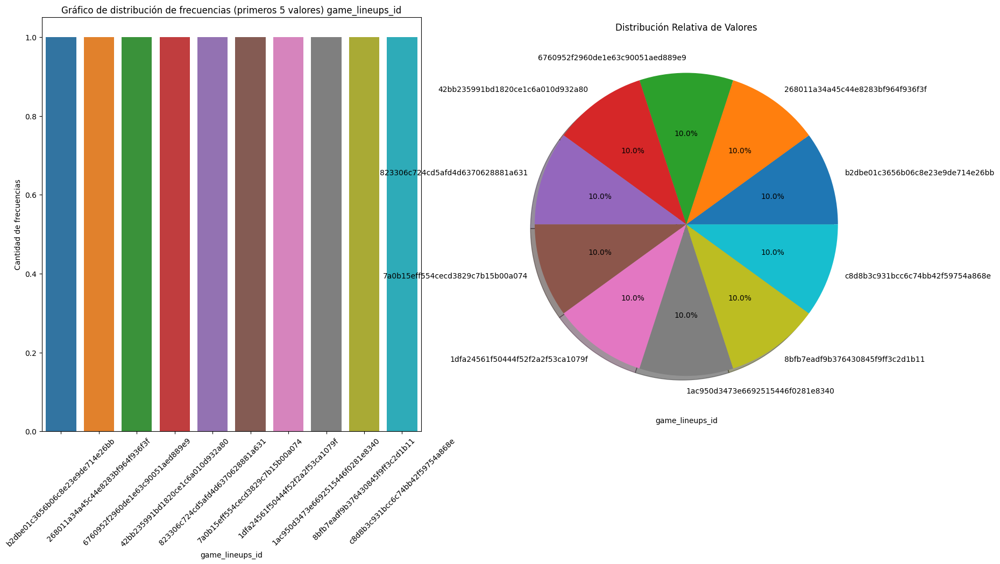



Estadísticas Básicas


count                              2191911
unique                             2191911
top       b2dbe01c3656b06c8e23e9de714e26bb
freq                                     1
Name: game_lineups_id, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




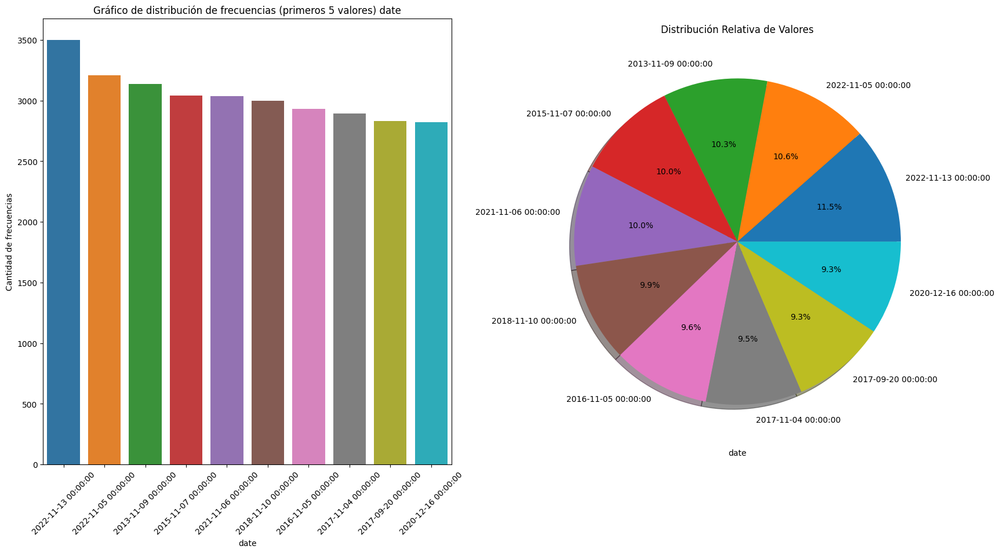



Estadísticas Básicas


count                 2191911
unique                   3059
top       2022-11-13 00:00:00
freq                     3500
first     2013-07-02 00:00:00
last      2024-03-17 00:00:00
Name: date, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




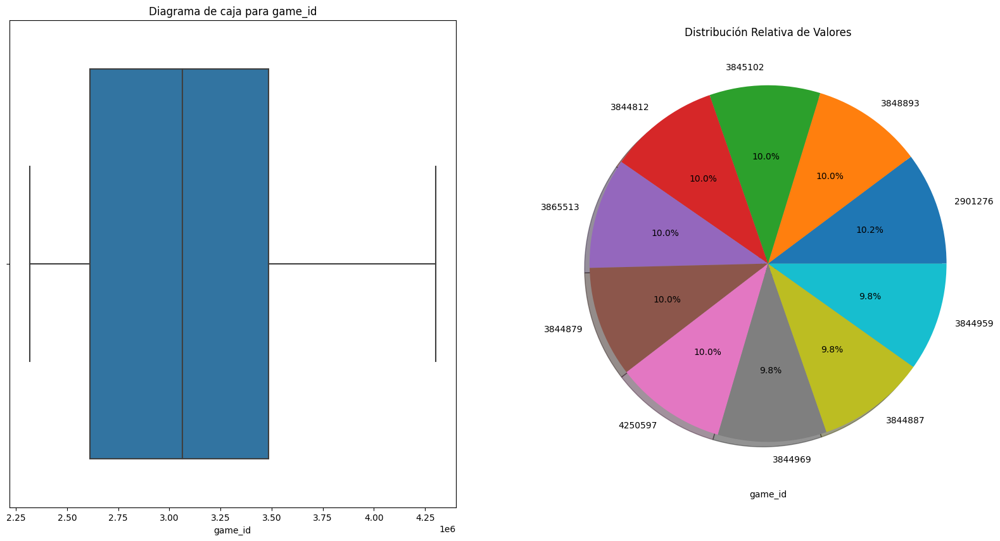



Estadísticas Básicas


count    2.191911e+06
mean     3.079741e+06
std      5.111072e+05
min      2.317258e+06
25%      2.611307e+06
50%      3.063686e+06
75%      3.484182e+06
max      4.300789e+06
Name: game_id, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




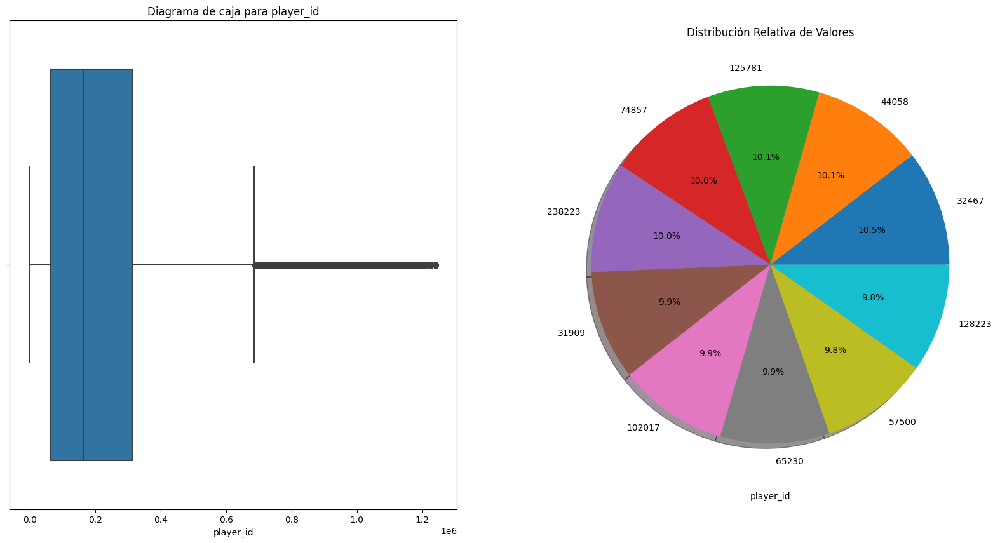



Estadísticas Básicas


count    2.191911e+06
mean     2.137363e+05
std      1.882895e+05
min      1.000000e+01
25%      6.292000e+04
50%      1.634890e+05
75%      3.124730e+05
max      1.244435e+06
Name: player_id, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




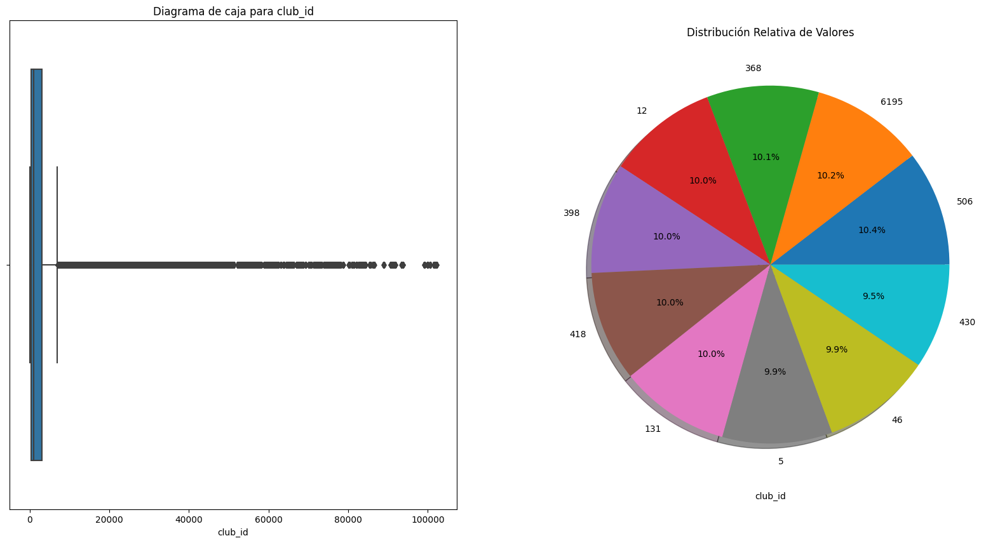



Estadísticas Básicas


count    2.191911e+06
mean     4.394990e+03
std      1.017359e+04
min      1.000000e+00
25%      3.390000e+02
50%      9.850000e+02
75%      3.000000e+03
max      1.022510e+05
Name: club_id, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




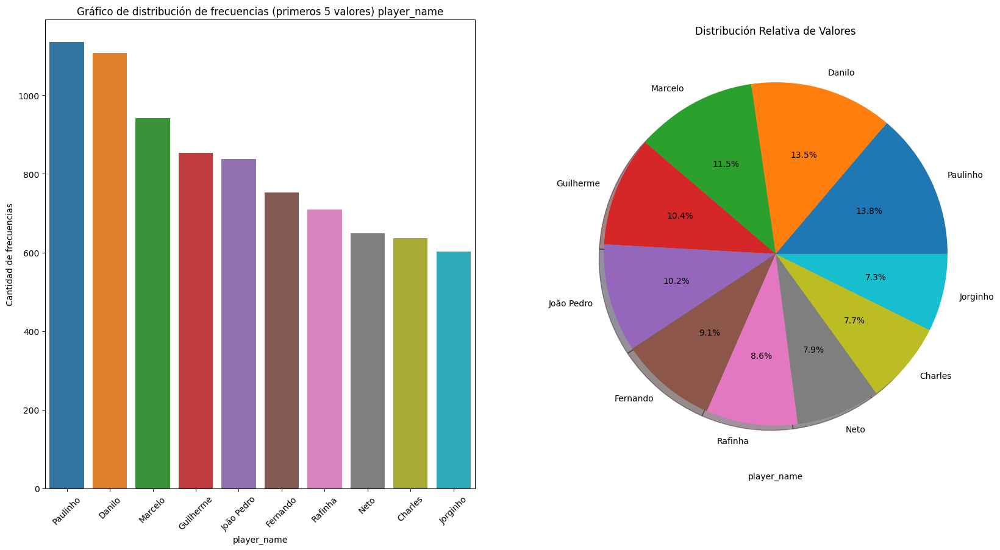



Estadísticas Básicas


count      2191911
unique       82154
top       Paulinho
freq          1136
Name: player_name, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




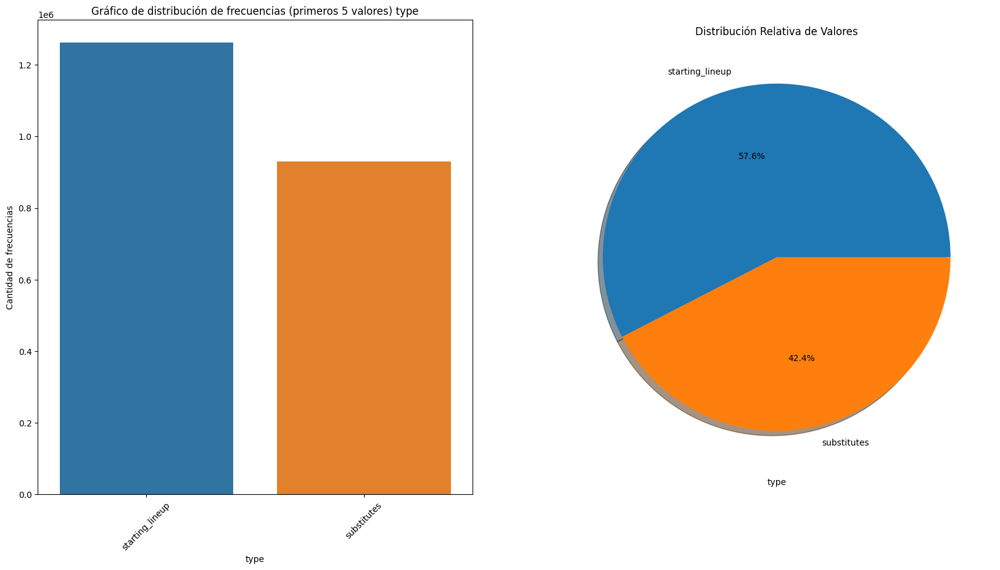



Estadísticas Básicas


count             2191911
unique                  2
top       starting_lineup
freq              1262067
Name: type, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




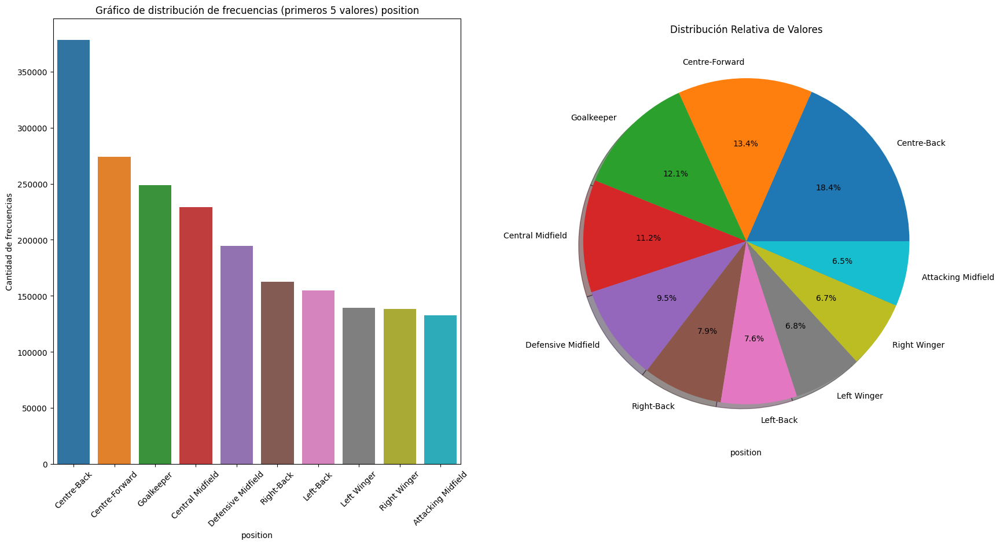



Estadísticas Básicas


count         2191911
unique             18
top       Centre-Back
freq           378533
Name: position, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




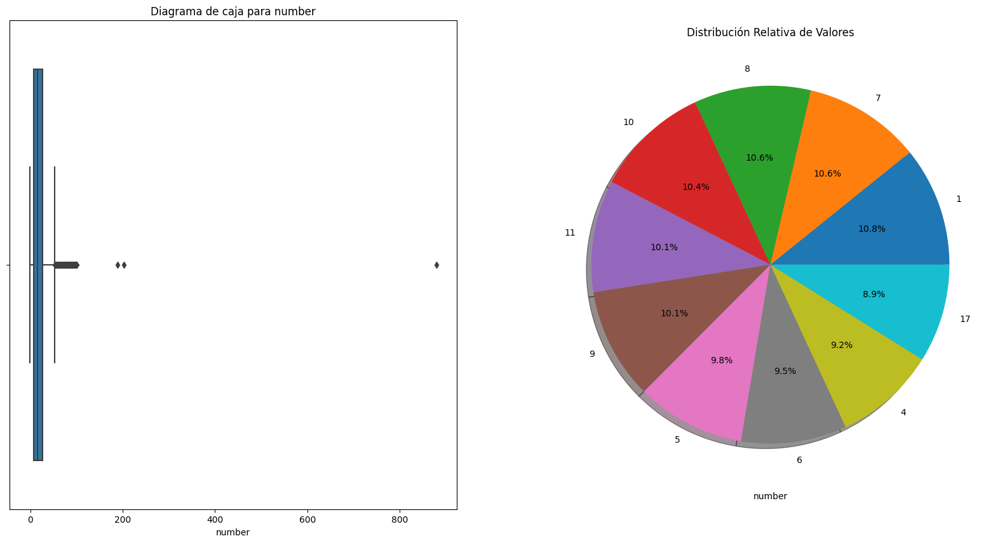



Estadísticas Básicas


count    2.191911e+06
mean     2.071250e+01
std      1.998954e+01
min     -1.000000e+00
25%      8.000000e+00
50%      1.600000e+01
75%      2.600000e+01
max      8.800000e+02
Name: number, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




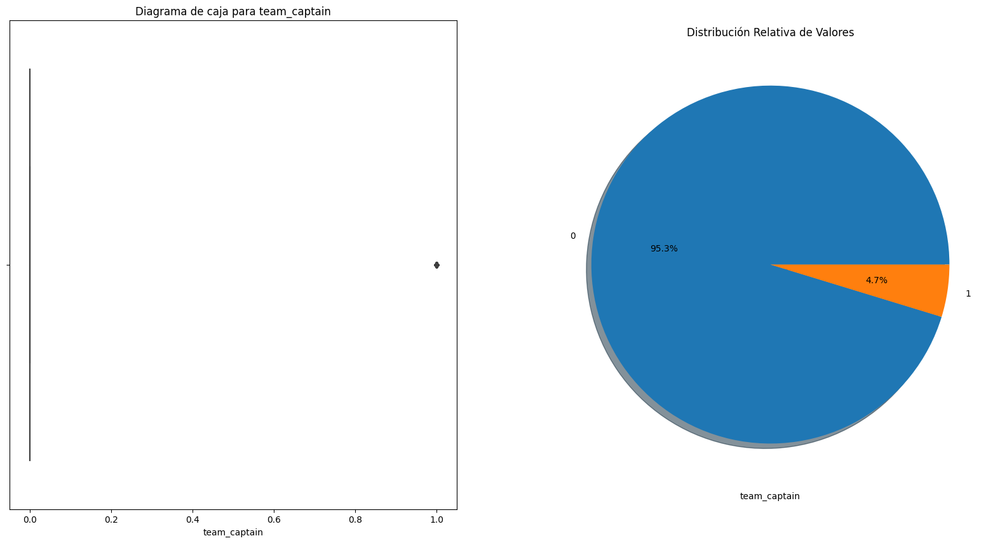



Estadísticas Básicas


count    2.191911e+06
mean     4.720538e-02
std      2.120779e-01
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.000000e+00
Name: team_captain, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




In [96]:
r.descripcion_distribucion(df_game_lineups)

## Games

<h2 align= 'center'><u>Informe Preliminar</u></h2>

### <h3 align= 'center'><u>General</u></h3>

In [97]:
r.informe_dataframe(df_games)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 68172
Columnas: 22

--Numero de datos--
1499784

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 68171
Columnas: ['game_id', 'competition_id', 'season', 'round', 'date', 'home_club_id', 'away_club_id', 'home_club_goals', 'away_club_goals', 'home_club_position', 'away_club_position', 'home_club_manager_name', 'away_club_manager_name', 'stadium', 'attendance', 'referee', 'home_club_formation', 'away_club_formation', 'home_club_name', 'away_club_name', 'aggregate', 'competition_type']

--Tipo de columnas--
game_id                            int64
competition_id                    object
season                             int64
round                             object
date                      datetime64[ns]
home_club_id                       int64
away_club_id                       int64
home_club_goals                    int64
away_club_goals          

'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [98]:
r.verificar_tipo_datos(df_games)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,game_id,[<class 'int'>],100.0,0.0,0
1,competition_id,[<class 'str'>],100.0,0.0,0
2,season,[<class 'int'>],100.0,0.0,0
3,round,[<class 'str'>],100.0,0.0,0
4,date,[<class 'pandas._libs.tslibs.timestamps.Timest...,100.0,0.0,0
5,home_club_id,[<class 'int'>],100.0,0.0,0
6,away_club_id,[<class 'int'>],100.0,0.0,0
7,home_club_goals,[<class 'int'>],100.0,0.0,0
8,away_club_goals,[<class 'int'>],100.0,0.0,0
9,home_club_position,[<class 'int'>],100.0,0.0,0


### <h3 align= 'center'><u>Particular</u></h3>

In [99]:
for columna in df_games.columns:
    r.informe_columna(df_games, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE game_id:

--Numero de datos nulos--
0

--Valores unicos en la columna--
Ej: [2321044 2321060 2321086 2321152 2321205]  -----> Desde 2321044  Hasta 4233201

--Estadisticos Principales de la columna--
Media: 3063156.19
Desviacion Estandar: 590643.39
Primer cuartil: 2559106.75
Mediana: 3047452.5
Tercer cuartil: 3583517.25

--Valores extremos--
Valor maximo: 4340617
Valor minimo: 2211607

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 2321044    1
3058658    1
3050447    1
Name: game_id, dtype: int64

--Valor maximo y minimo--
Maximo: 4340617
Minimo: 2211607

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE competition_id:

--Numero de datos nulos--
0

--Cantidad de valores u

### <h3 size= 22 align= 'center'><u>Análisis Descriptivo</u></h3>

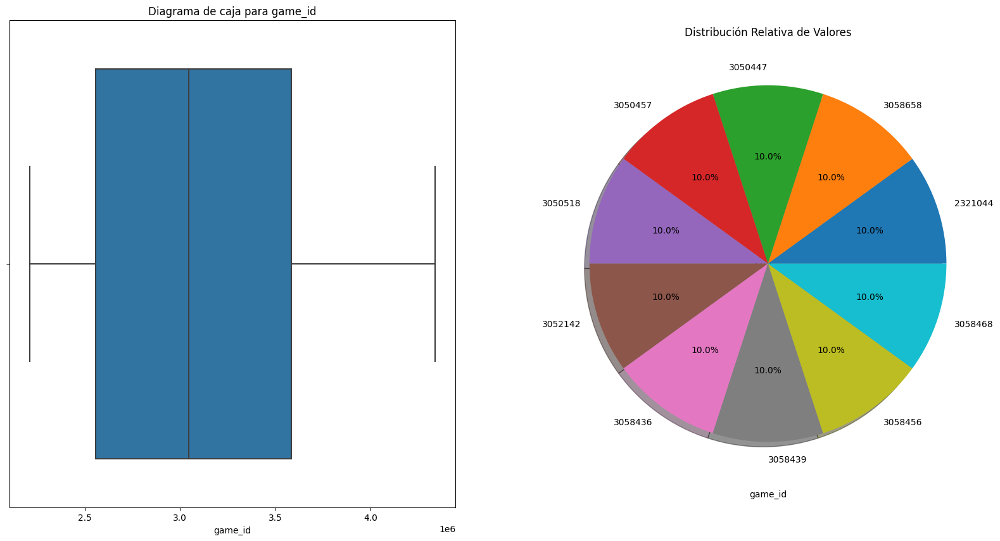



Estadísticas Básicas


count    6.817200e+04
mean     3.063156e+06
std      5.906434e+05
min      2.211607e+06
25%      2.559107e+06
50%      3.047452e+06
75%      3.583517e+06
max      4.340617e+06
Name: game_id, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




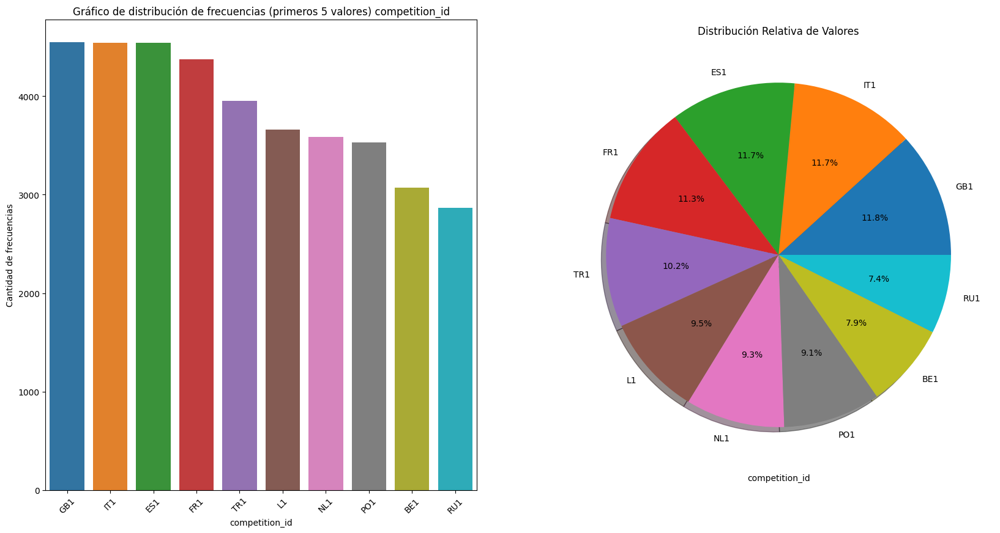



Estadísticas Básicas


count     68172
unique       43
top         GB1
freq       4550
Name: competition_id, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




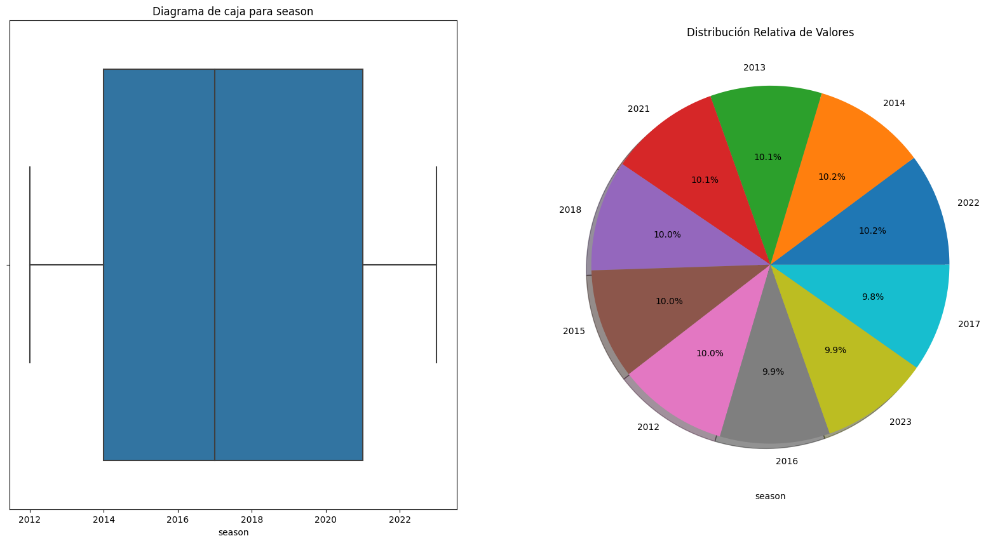



Estadísticas Básicas


count    68172.000000
mean      2017.484979
std          3.463072
min       2012.000000
25%       2014.000000
50%       2017.000000
75%       2021.000000
max       2023.000000
Name: season, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




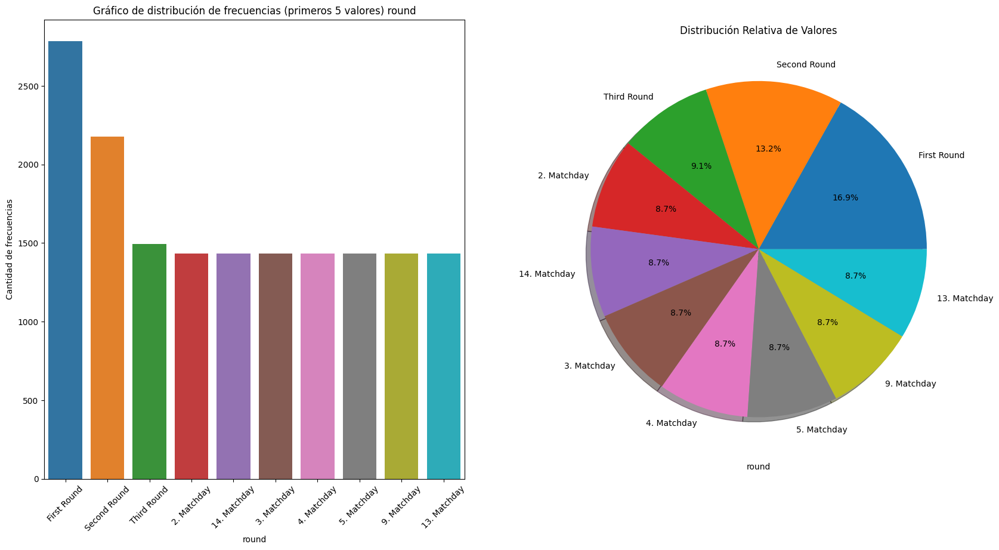



Estadísticas Básicas


count           68172
unique            117
top       First Round
freq             2783
Name: round, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




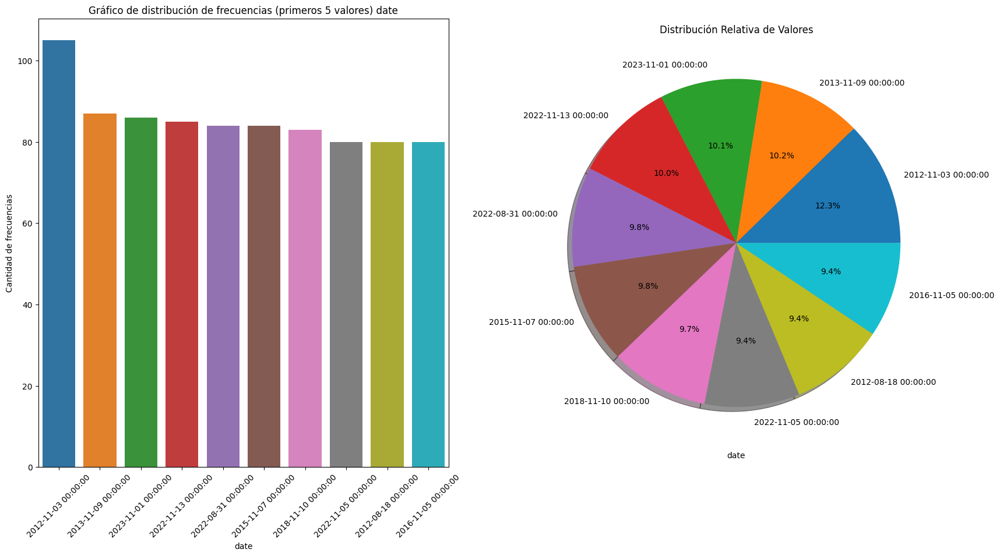



Estadísticas Básicas


count                   68172
unique                   3561
top       2012-11-03 00:00:00
freq                      105
first     2012-07-03 00:00:00
last      2024-05-16 00:00:00
Name: date, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




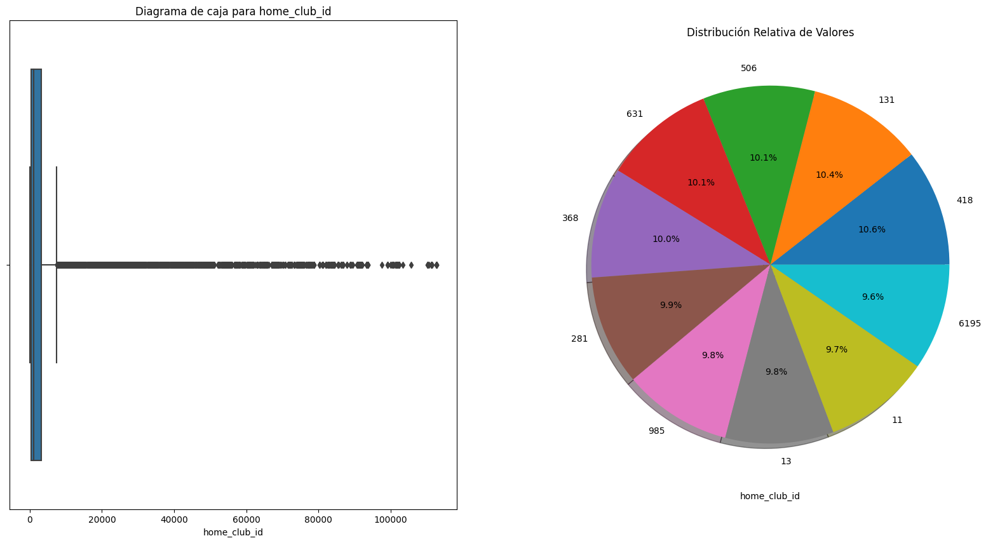



Estadísticas Básicas


count     68172.000000
mean       4886.933961
std       11391.164516
min           1.000000
25%         354.000000
50%         995.000000
75%        3205.000000
max      112753.000000
Name: home_club_id, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




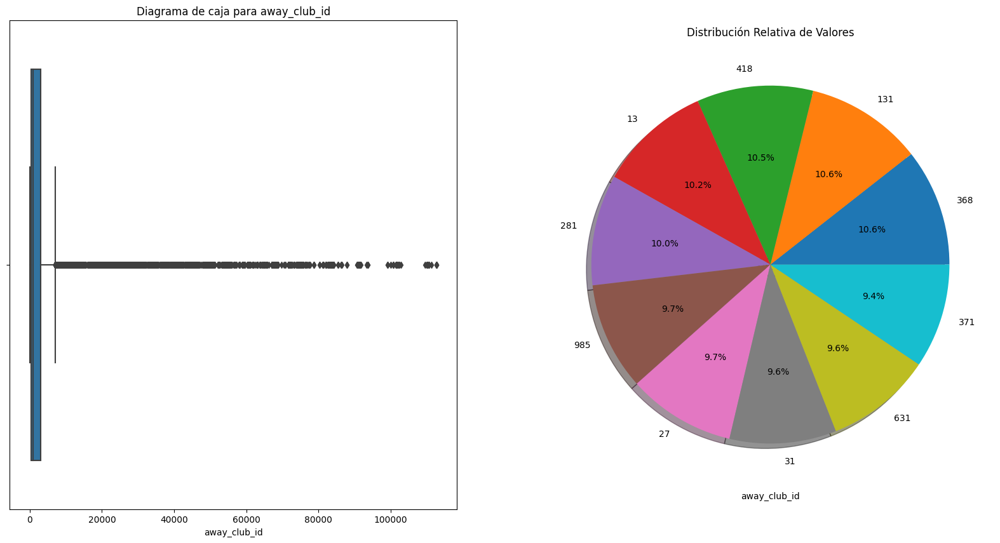



Estadísticas Básicas


count     68172.000000
mean       4419.171669
std       10252.817947
min           2.000000
25%         347.000000
50%         987.000000
75%        3016.000000
max      112755.000000
Name: away_club_id, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




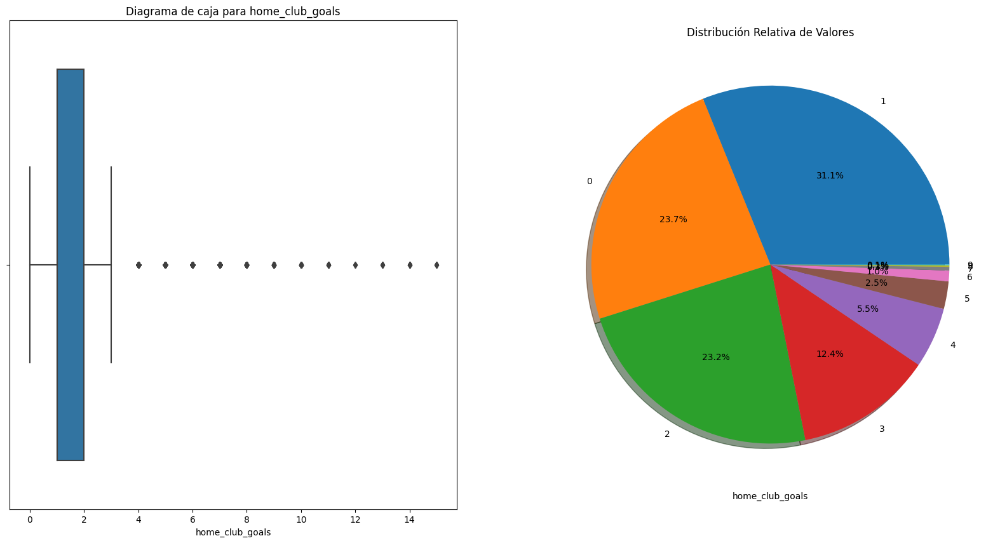



Estadísticas Básicas


count    68172.00000
mean         1.59523
std          1.42589
min          0.00000
25%          1.00000
50%          1.00000
75%          2.00000
max         15.00000
Name: home_club_goals, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




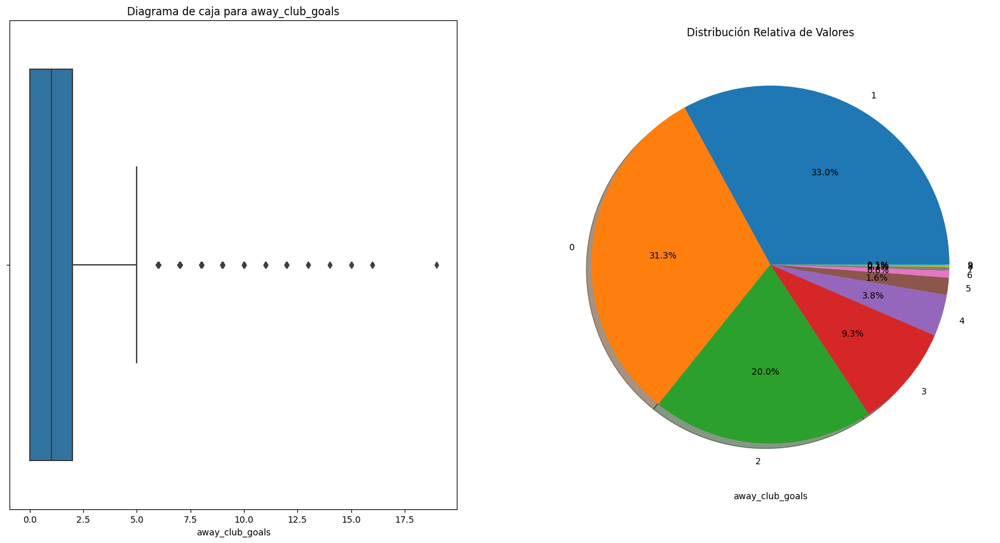



Estadísticas Básicas


count    68172.000000
mean         1.322449
std          1.361341
min          0.000000
25%          0.000000
50%          1.000000
75%          2.000000
max         19.000000
Name: away_club_goals, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




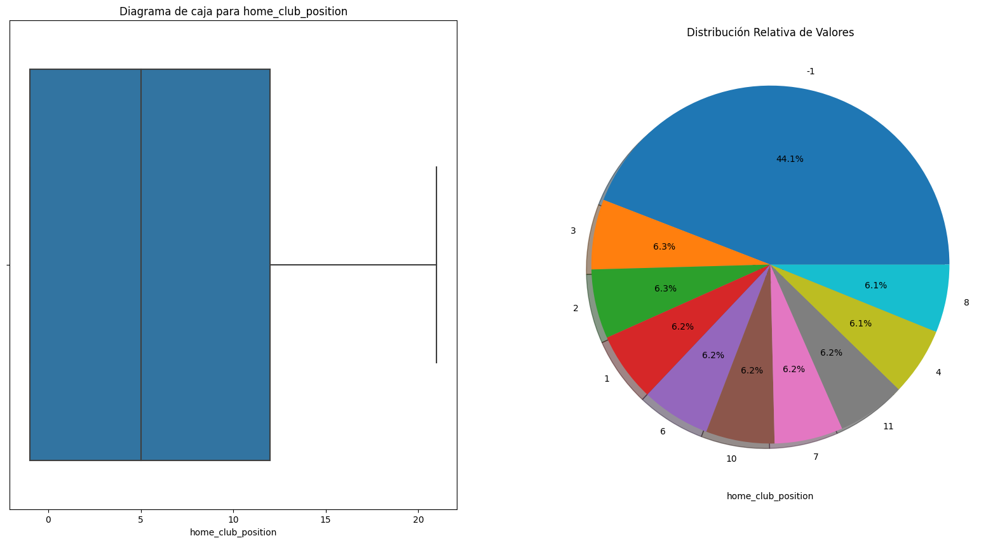



Estadísticas Básicas


count    68172.000000
mean         6.259021
std          6.464535
min         -1.000000
25%         -1.000000
50%          5.000000
75%         12.000000
max         21.000000
Name: home_club_position, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




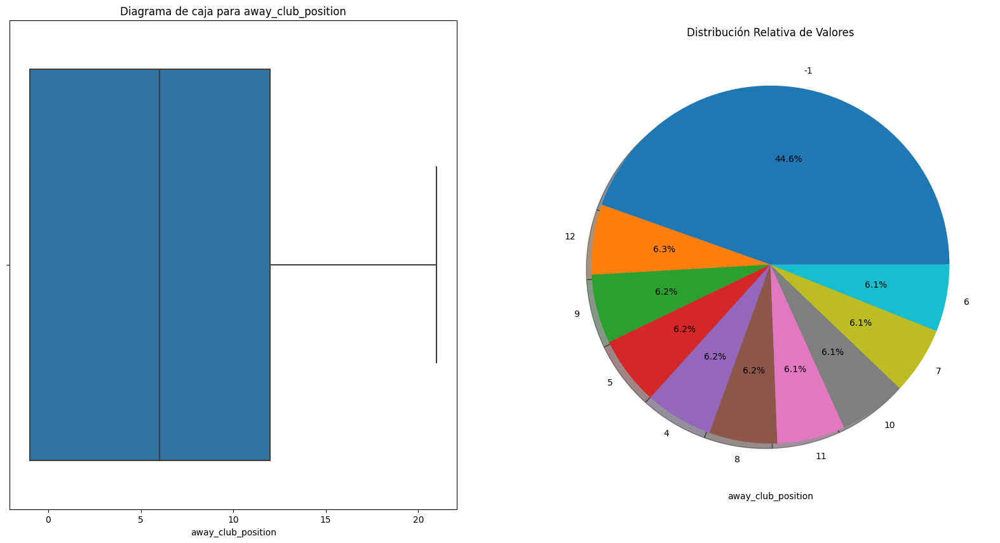



Estadísticas Básicas


count    68172.000000
mean         6.385745
std          6.536453
min         -1.000000
25%         -1.000000
50%          6.000000
75%         12.000000
max         21.000000
Name: away_club_position, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




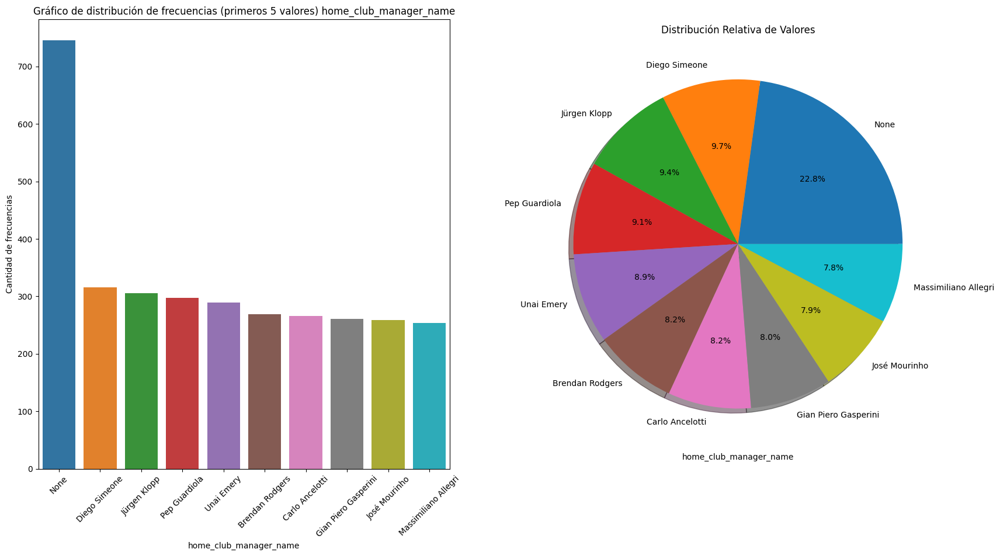



Estadísticas Básicas


count     68172
unique     4909
top        None
freq        745
Name: home_club_manager_name, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




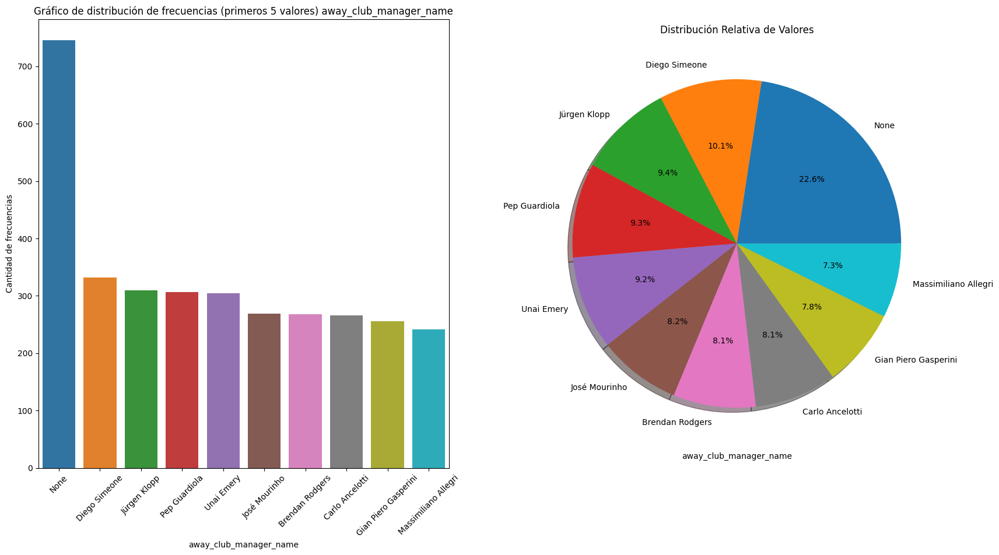



Estadísticas Básicas


count     68172
unique     4638
top        None
freq        745
Name: away_club_manager_name, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




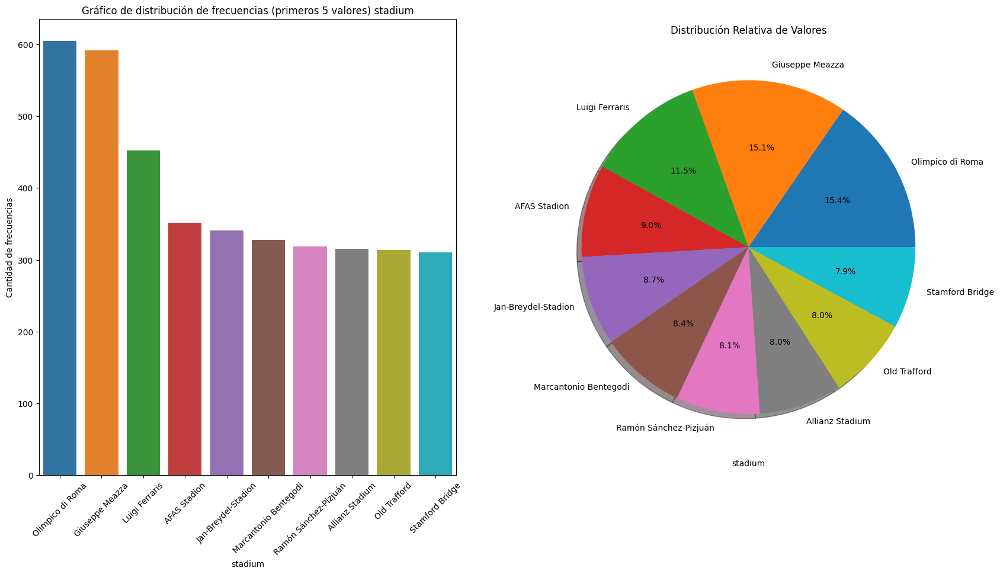



Estadísticas Básicas


count                68172
unique                2323
top       Olimpico di Roma
freq                   605
Name: stadium, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




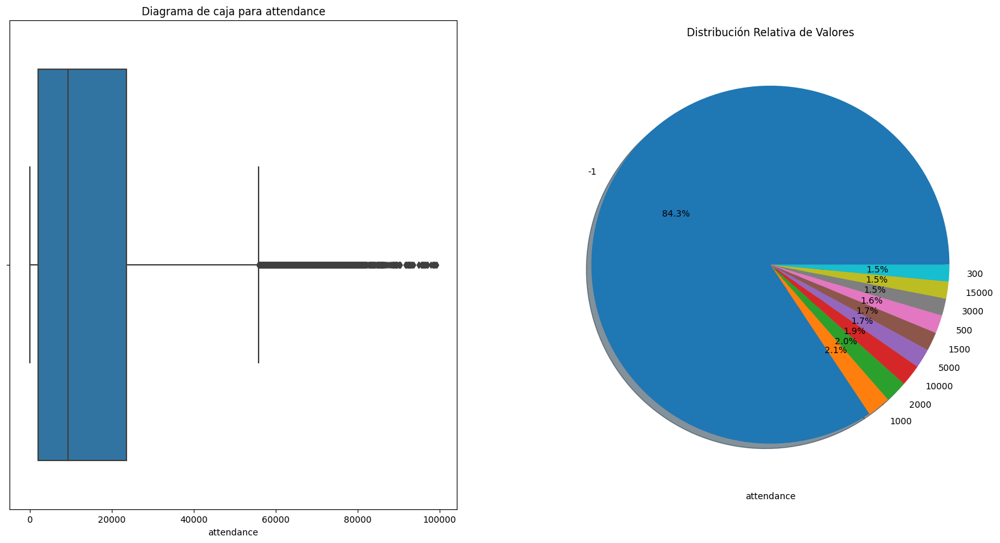



Estadísticas Básicas


count    68172.000000
mean     15692.909083
std      17760.395357
min         -1.000000
25%       2000.000000
50%       9390.000000
75%      23526.500000
max      99354.000000
Name: attendance, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




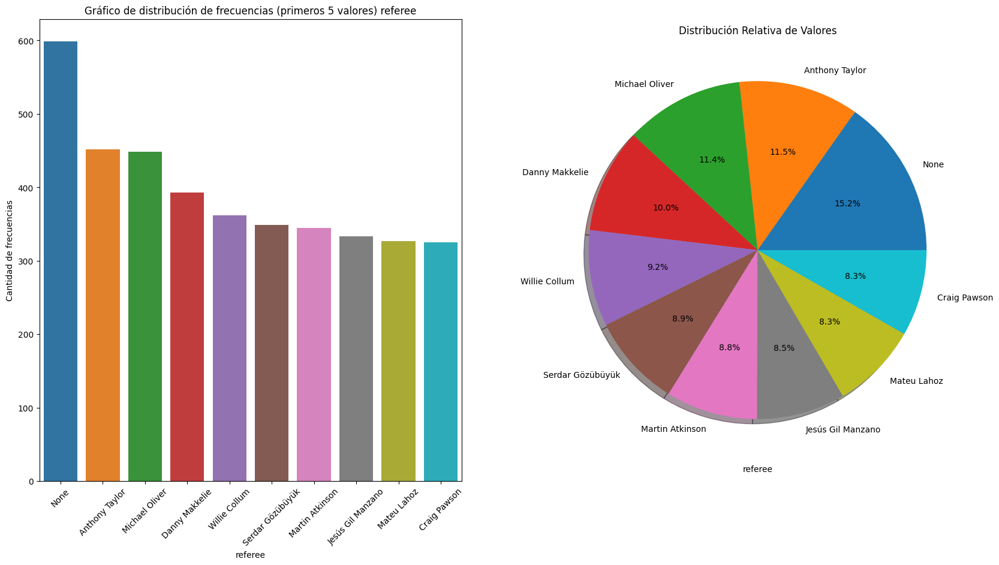



Estadísticas Básicas


count     68172
unique     2399
top        None
freq        599
Name: referee, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




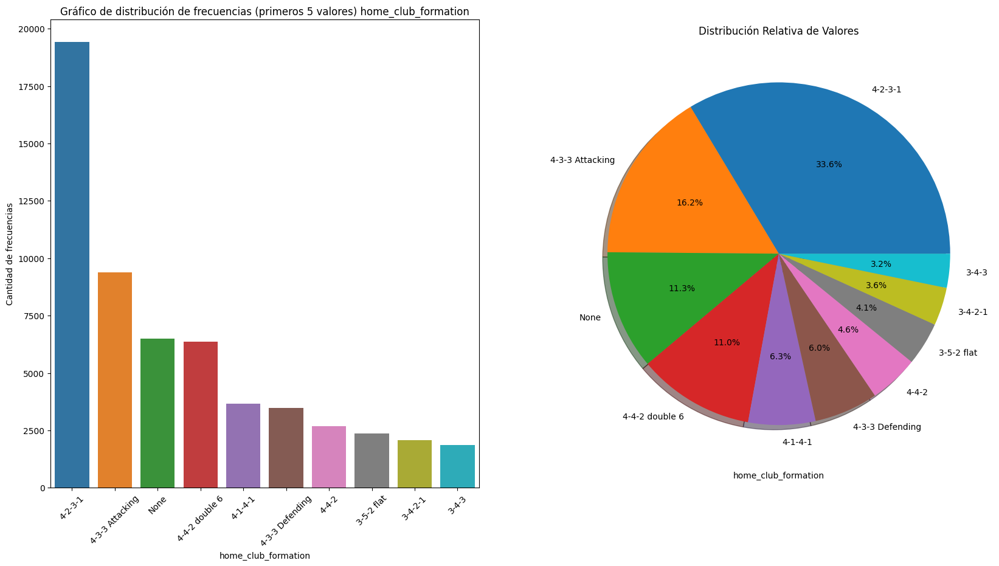



Estadísticas Básicas


count       68172
unique         52
top       4-2-3-1
freq        19424
Name: home_club_formation, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




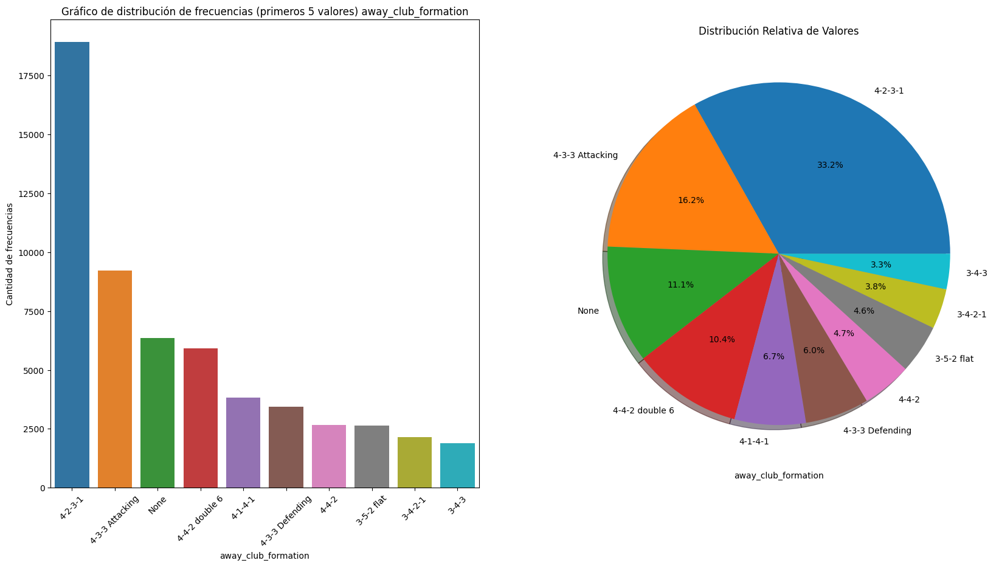



Estadísticas Básicas


count       68172
unique         66
top       4-2-3-1
freq        18929
Name: away_club_formation, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




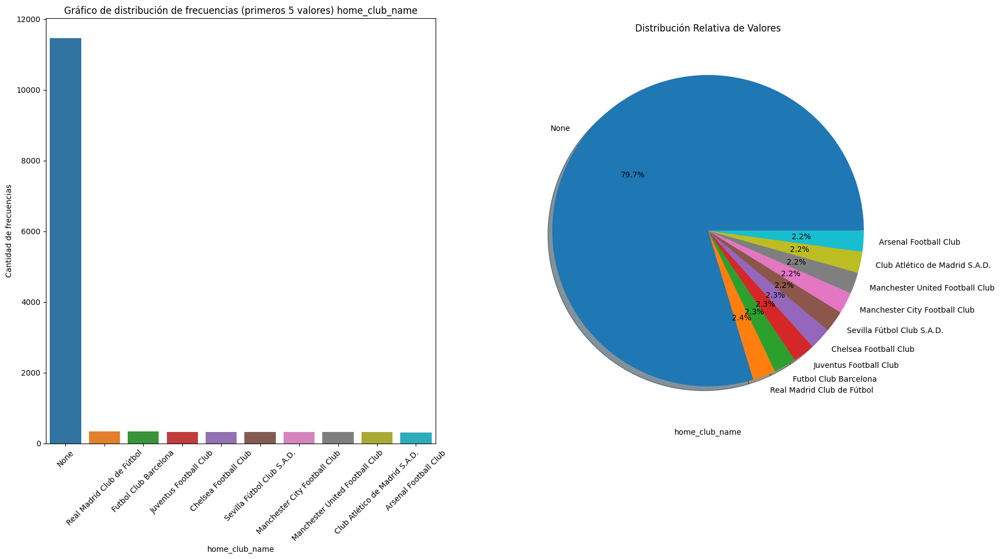



Estadísticas Básicas


count     68172
unique      427
top        None
freq      11458
Name: home_club_name, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




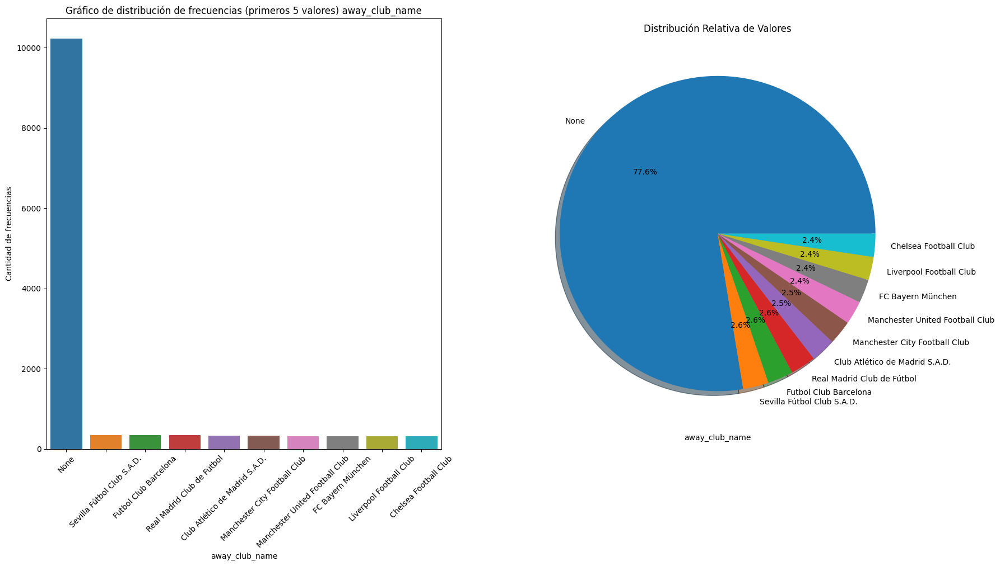



Estadísticas Básicas


count     68172
unique      427
top        None
freq      10219
Name: away_club_name, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




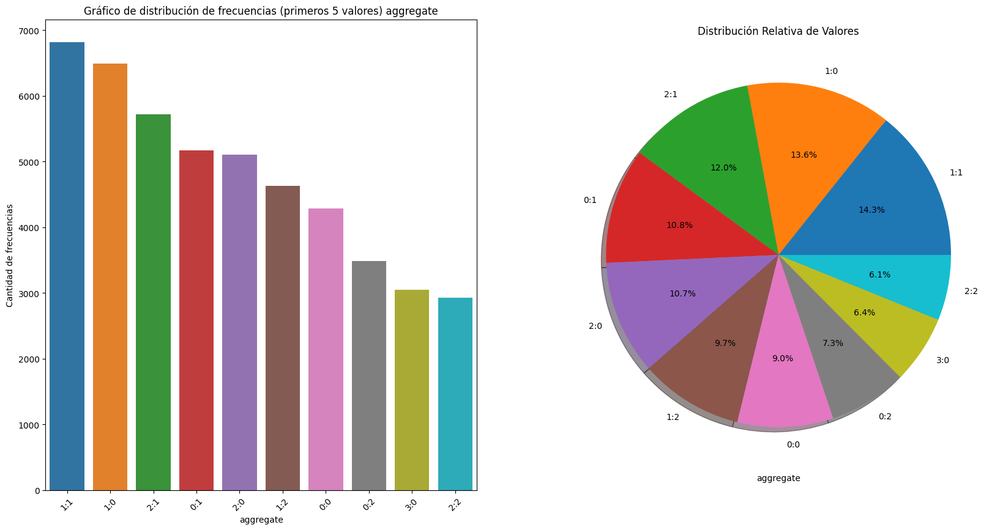



Estadísticas Básicas


count     68172
unique      113
top         1:1
freq       6820
Name: aggregate, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




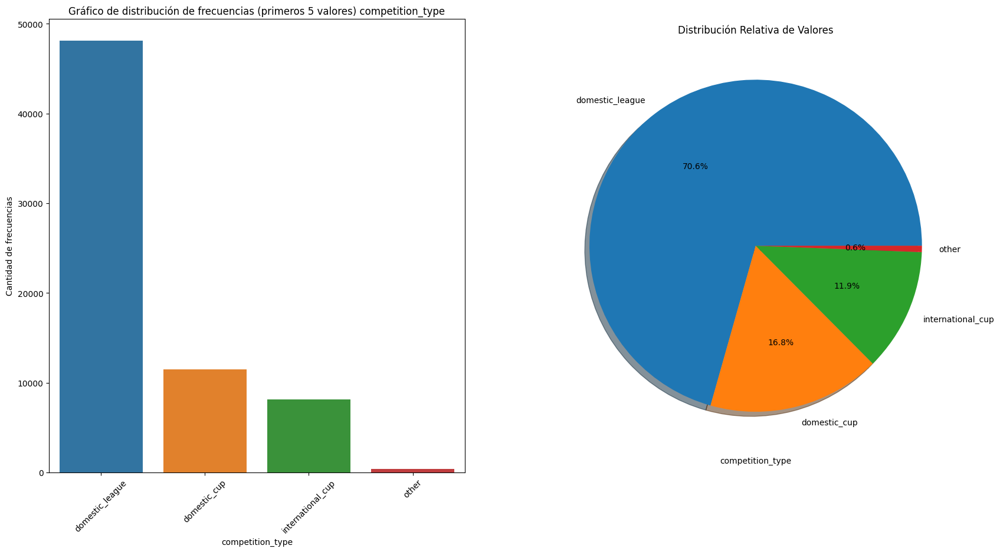



Estadísticas Básicas


count               68172
unique                  4
top       domestic_league
freq                48143
Name: competition_type, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




In [100]:
r.descripcion_distribucion(df_games)

## Player_valuations

<h2 align= 'center'><u>Informe Preliminar</u></h2>

### <h3 align= 'center'><u>General</u></h3>

In [101]:
r.informe_dataframe(df_player_valuations)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 467137
Columnas: 5

--Numero de datos--
2335685

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 467136
Columnas: ['player_id', 'date', 'market_value_in_eur', 'current_club_id', 'player_club_domestic_competition_id']

--Tipo de columnas--
player_id                                       int64
date                                   datetime64[ns]
market_value_in_eur                             int64
current_club_id                                 int64
player_club_domestic_competition_id            object
dtype: object
--Cantidad de registros duplicados--
0



'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [102]:
r.verificar_tipo_datos(df_player_valuations)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,player_id,[<class 'int'>],100.0,0.0,0
1,date,[<class 'pandas._libs.tslibs.timestamps.Timest...,100.0,0.0,0
2,market_value_in_eur,[<class 'int'>],100.0,0.0,0
3,current_club_id,[<class 'int'>],100.0,0.0,0
4,player_club_domestic_competition_id,[<class 'str'>],100.0,0.0,0


### <h3 align= 'center'><u>Particular</u></h3>

In [103]:
for columna in df_player_valuations.columns:
    r.informe_columna(df_player_valuations, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE player_id:

--Numero de datos nulos--
0

--Valores unicos en la columna--
Ej: [405973 342216   3132   6893     10]  -----> Desde 405973  Hasta 983817

--Estadisticos Principales de la columna--
Media: 205933.01
Desviacion Estandar: 187666.52
Primer cuartil: 57091.0
Mediana: 151213.0
Tercer cuartil: 301758.0

--Valores extremos--
Valor maximo: 1225269
Valor minimo: 10

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 39153    52
35664    50
44162    50
Name: player_id, dtype: int64

--Valor maximo y minimo--
Maximo: 1225269
Minimo: 10

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE date:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
5145

--Val

### <h3 size= 22 align= 'center'><u>Análisis Descriptivo</u></h3>

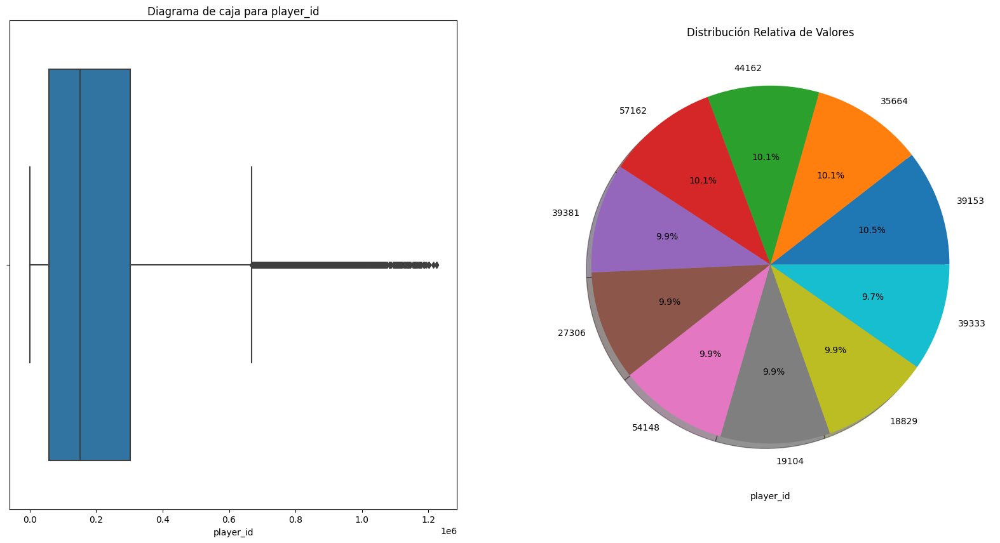



Estadísticas Básicas


count    4.671370e+05
mean     2.059330e+05
std      1.876665e+05
min      1.000000e+01
25%      5.709100e+04
50%      1.512130e+05
75%      3.017580e+05
max      1.225269e+06
Name: player_id, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




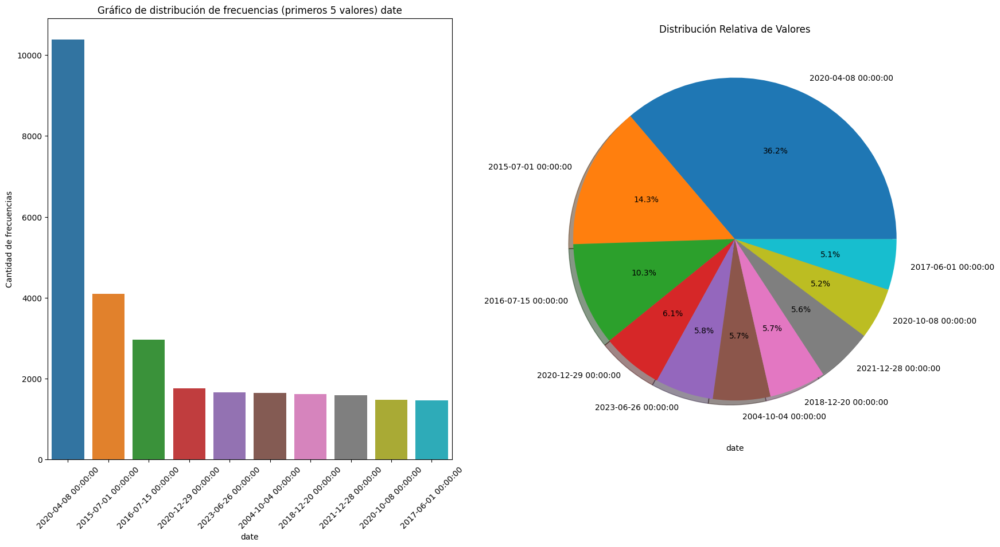



Estadísticas Básicas


count                  467137
unique                   5145
top       2020-04-08 00:00:00
freq                    10385
first     2000-01-20 00:00:00
last      2024-04-18 00:00:00
Name: date, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




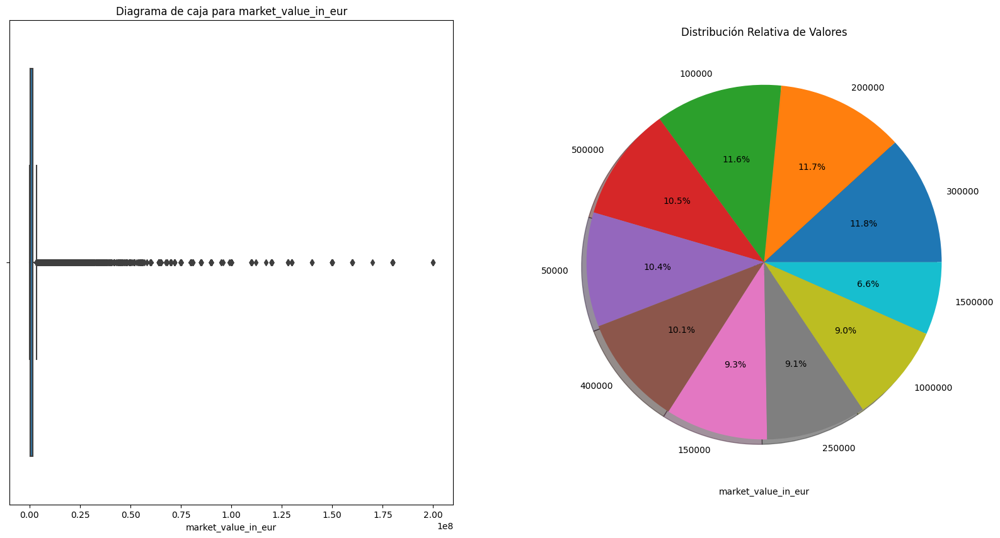



Estadísticas Básicas


count    4.671370e+05
mean     2.377664e+06
std      6.708563e+06
min      0.000000e+00
25%      2.000000e+05
50%      5.000000e+05
75%      1.500000e+06
max      2.000000e+08
Name: market_value_in_eur, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




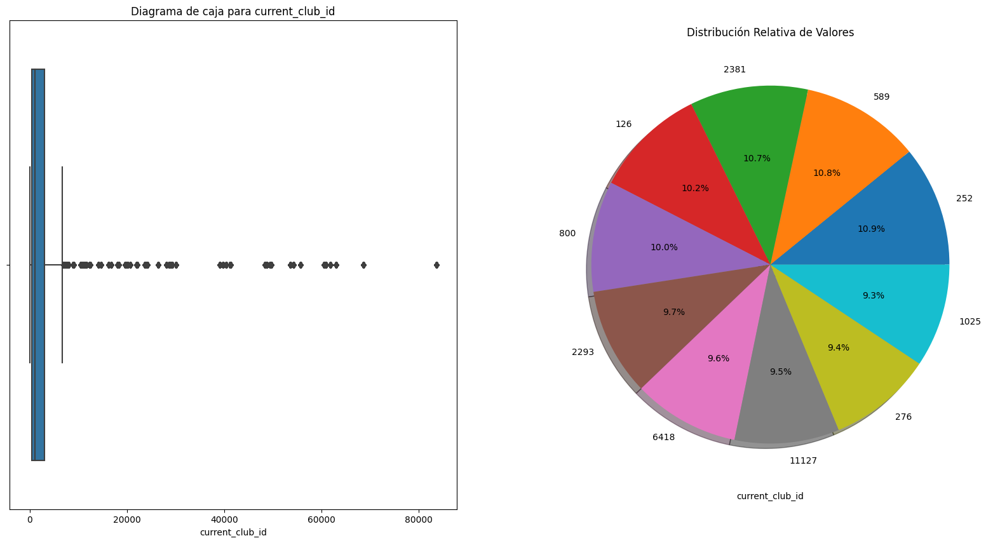



Estadísticas Básicas


count    467137.000000
mean       4085.519417
std        9572.828502
min           3.000000
25%         369.000000
50%        1010.000000
75%        2969.000000
max       83678.000000
Name: current_club_id, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




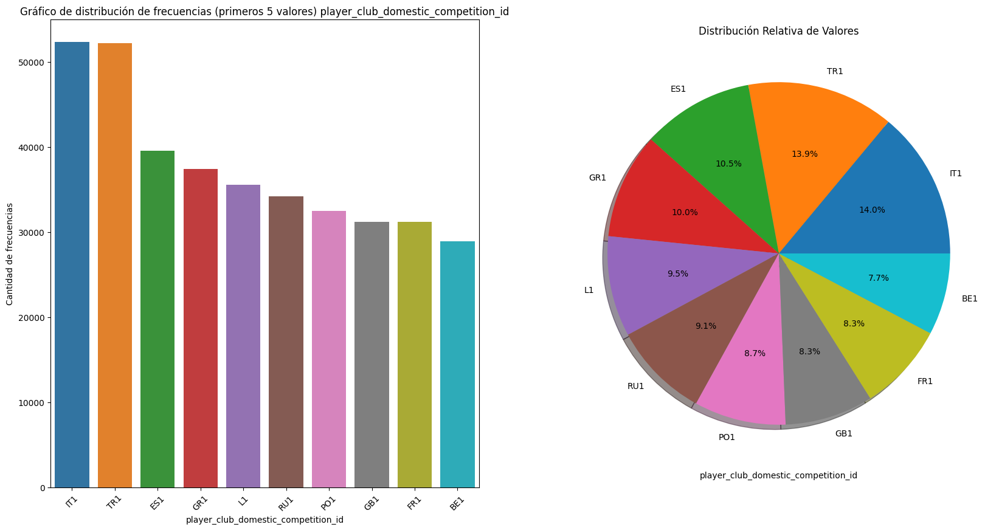



Estadísticas Básicas


count     467137
unique        14
top          IT1
freq       52390
Name: player_club_domestic_competition_id, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




In [104]:
r.descripcion_distribucion(df_player_valuations)

## Players

<h2 align= 'center'><u>Informe Preliminar</u></h2>

### <h3 align= 'center'><u>General</u></h3>

In [105]:
r.informe_dataframe(df_players)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 30518
Columnas: 17

--Numero de datos--
518761

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 30517
Columnas: ['player_id', 'name', 'last_season', 'current_club_id', 'player_code', 'country_of_birth', 'city_of_birth', 'country_of_citizenship', 'date_of_birth', 'sub_position', 'position', 'foot', 'height_in_cm', 'current_club_domestic_competition_id', 'current_club_name', 'market_value_in_eur', 'highest_market_value_in_eur']

--Tipo de columnas--
player_id                                        int64
name                                            object
last_season                                      int64
current_club_id                                  int64
player_code                                     object
country_of_birth                                object
city_of_birth                                   object
country_of_citizenship   

'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [106]:
r.verificar_tipo_datos(df_players)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,player_id,[<class 'int'>],100.00,0.00,0
1,name,[<class 'str'>],100.00,0.00,0
2,last_season,[<class 'int'>],100.00,0.00,0
3,current_club_id,[<class 'int'>],100.00,0.00,0
4,player_code,[<class 'str'>],100.00,0.00,0
5,country_of_birth,[<class 'str'>],100.00,0.00,0
6,city_of_birth,[<class 'str'>],100.00,0.00,0
7,country_of_citizenship,[<class 'str'>],100.00,0.00,0
8,date_of_birth,[<class 'pandas._libs.tslibs.timestamps.Timest...,99.85,0.15,45
9,sub_position,[<class 'str'>],100.00,0.00,0


### <h3 align= 'center'><u>Particular</u></h3>

In [107]:
for columna in df_players.columns:
    r.informe_columna(df_players, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE player_id:

--Numero de datos nulos--
0

--Valores unicos en la columna--
Ej: [10 26 65 77 80]  -----> Desde 10  Hasta 1240762

--Estadisticos Principales de la columna--
Media: 314777.71
Desviacion Estandar: 253725.34
Primer cuartil: 96015.25
Mediana: 259886.5
Tercer cuartil: 470831.75

--Valores extremos--
Valor maximo: 1240762
Valor minimo: 10

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 10        1
387110    1
387218    1
Name: player_id, dtype: int64

--Valor maximo y minimo--
Maximo: 1240762
Minimo: 10

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE name:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
29870

--Valores unicos en la co

### <h3 size= 22 align= 'center'><u>Análisis Descriptivo</u></h3>

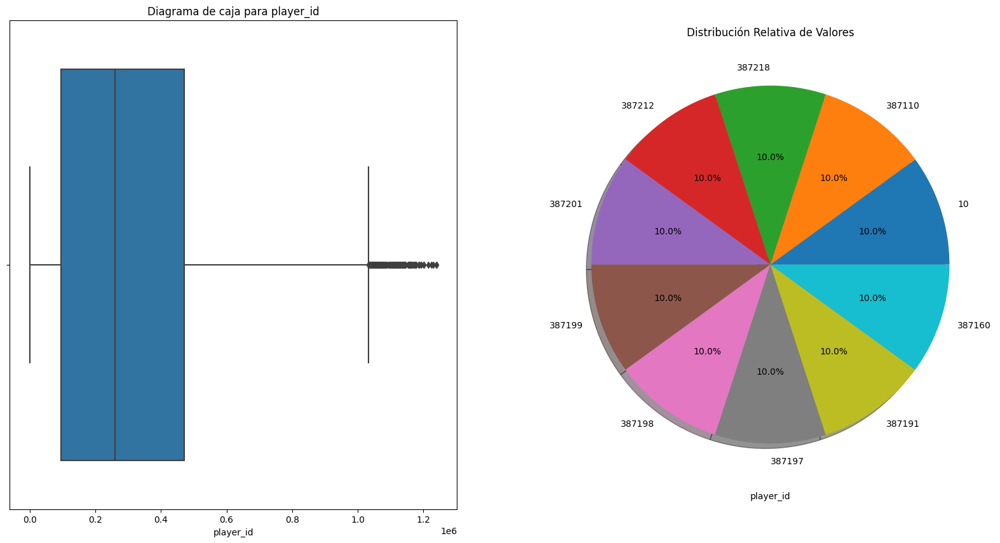



Estadísticas Básicas


count    3.051800e+04
mean     3.147777e+05
std      2.537253e+05
min      1.000000e+01
25%      9.601525e+04
50%      2.598865e+05
75%      4.708318e+05
max      1.240762e+06
Name: player_id, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




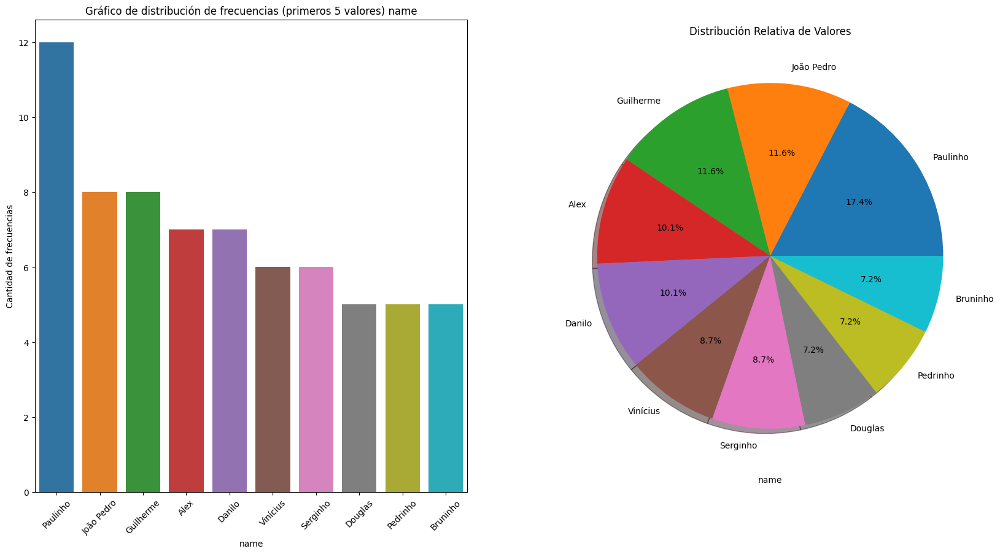



Estadísticas Básicas


count        30518
unique       29870
top       Paulinho
freq            12
Name: name, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




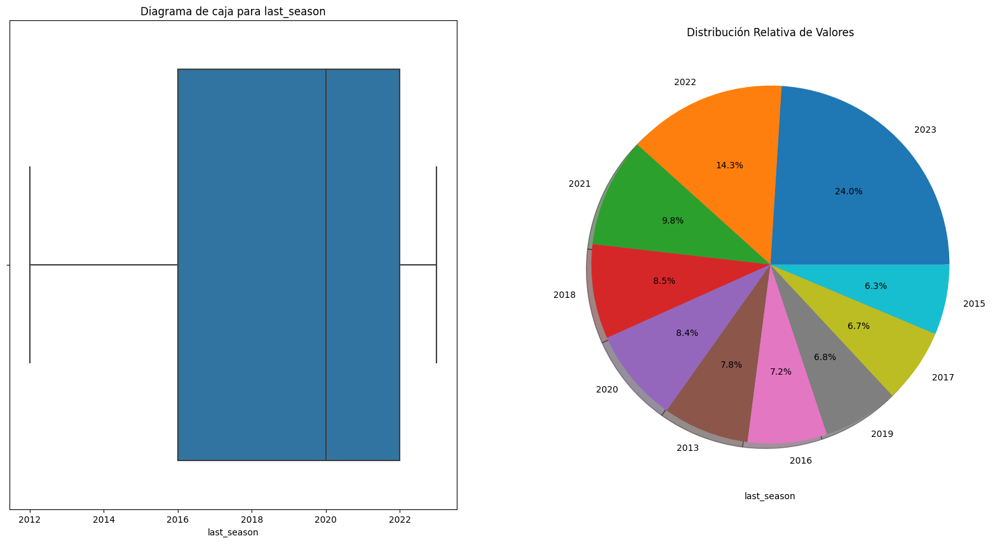



Estadísticas Básicas


count    30518.000000
mean      2018.792483
std          3.650216
min       2012.000000
25%       2016.000000
50%       2020.000000
75%       2022.000000
max       2023.000000
Name: last_season, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




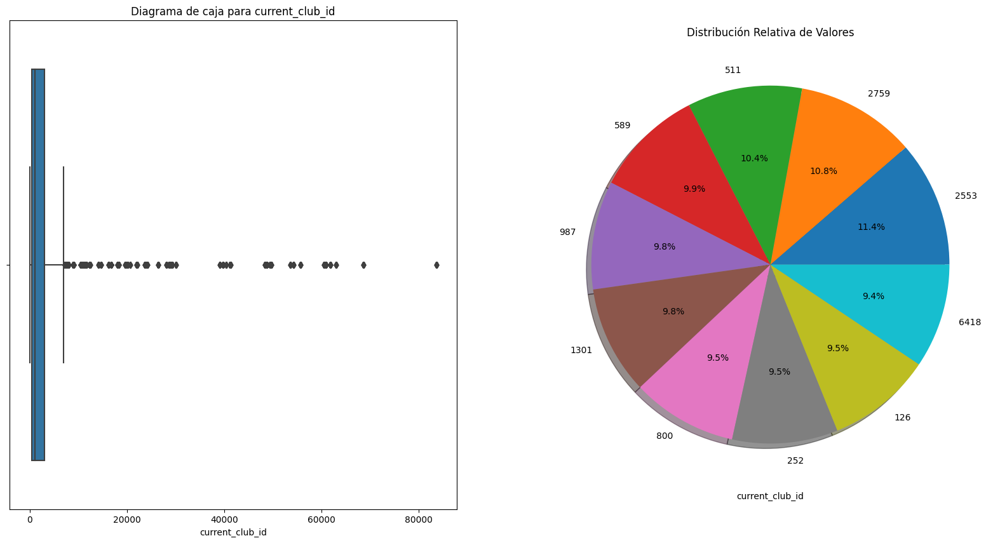



Estadísticas Básicas


count    30518.000000
mean      4405.004194
std      10126.676629
min          3.000000
25%        403.000000
50%       1075.000000
75%       3057.000000
max      83678.000000
Name: current_club_id, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




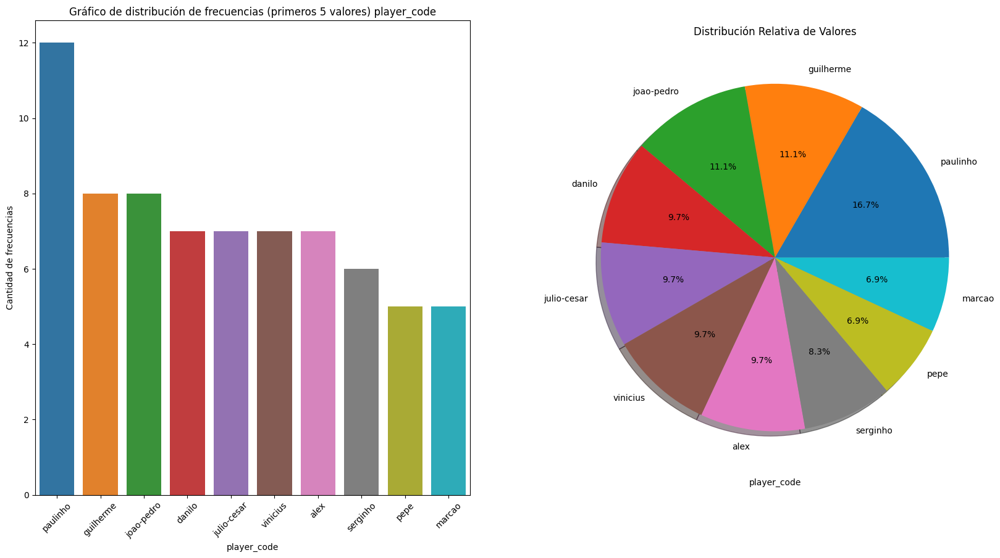



Estadísticas Básicas


count        30518
unique       29831
top       paulinho
freq            12
Name: player_code, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




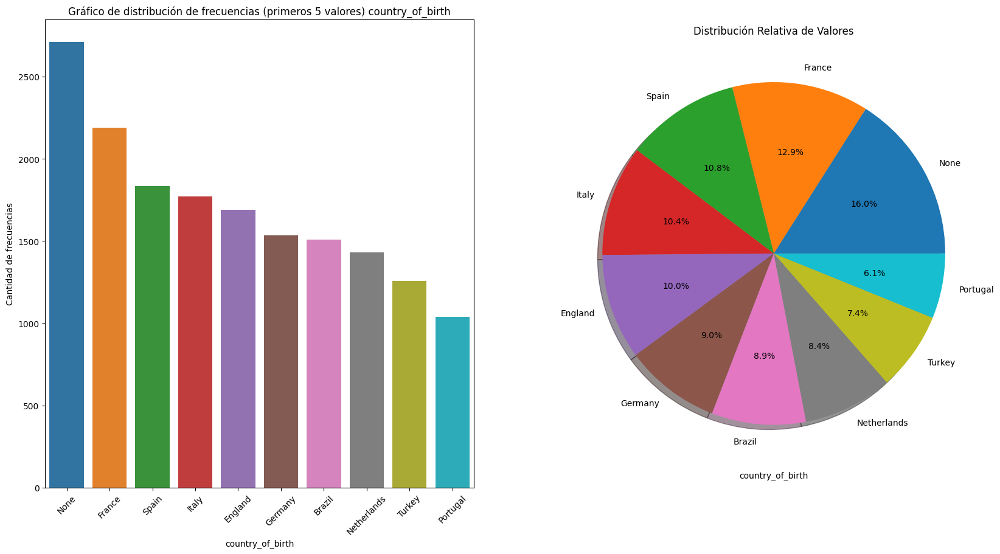



Estadísticas Básicas


count     30518
unique      185
top        None
freq       2712
Name: country_of_birth, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




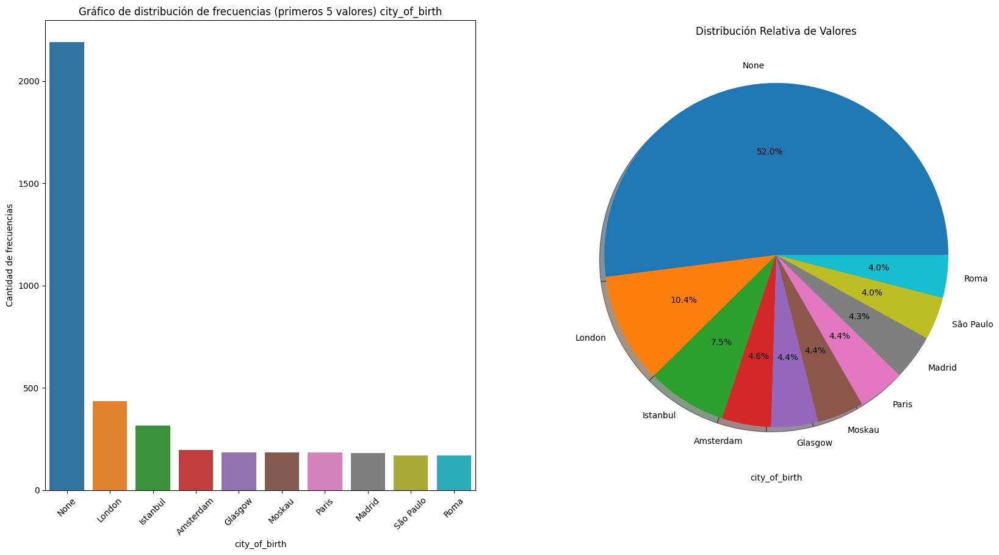



Estadísticas Básicas


count     30518
unique     8234
top        None
freq       2189
Name: city_of_birth, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




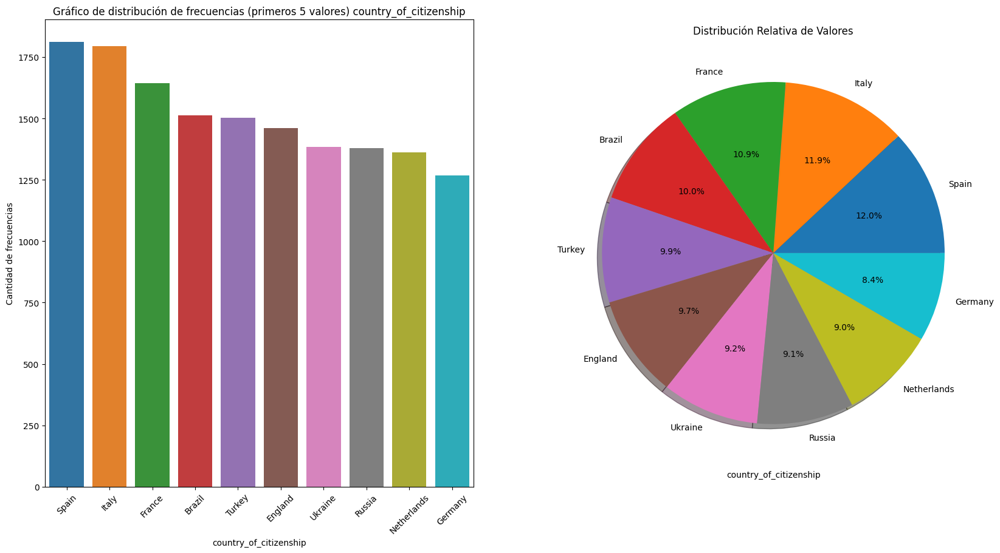



Estadísticas Básicas


count     30518
unique      183
top       Spain
freq       1813
Name: country_of_citizenship, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




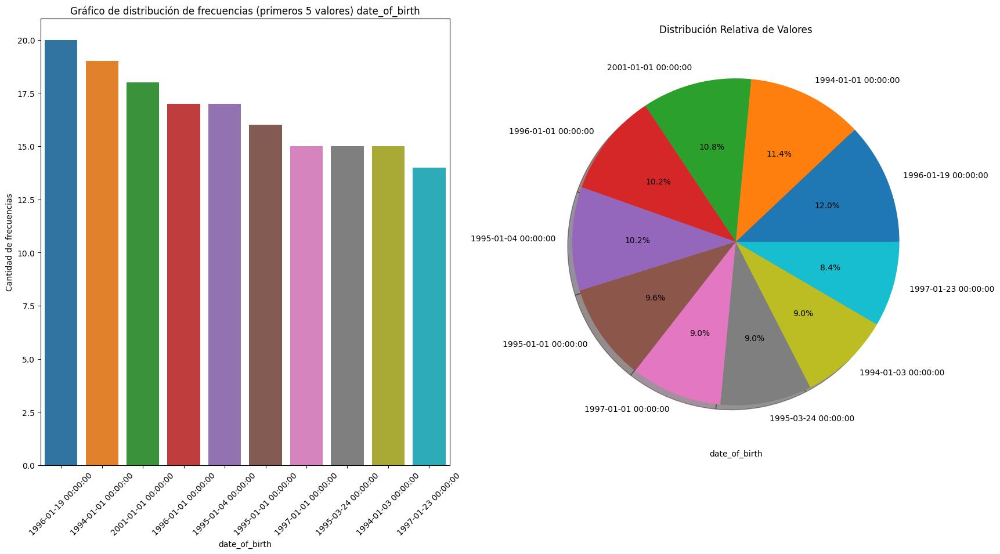



Estadísticas Básicas


count                   30473
unique                   8944
top       1996-01-19 00:00:00
freq                       20
first     1968-07-31 00:00:00
last      2008-02-29 00:00:00
Name: date_of_birth, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




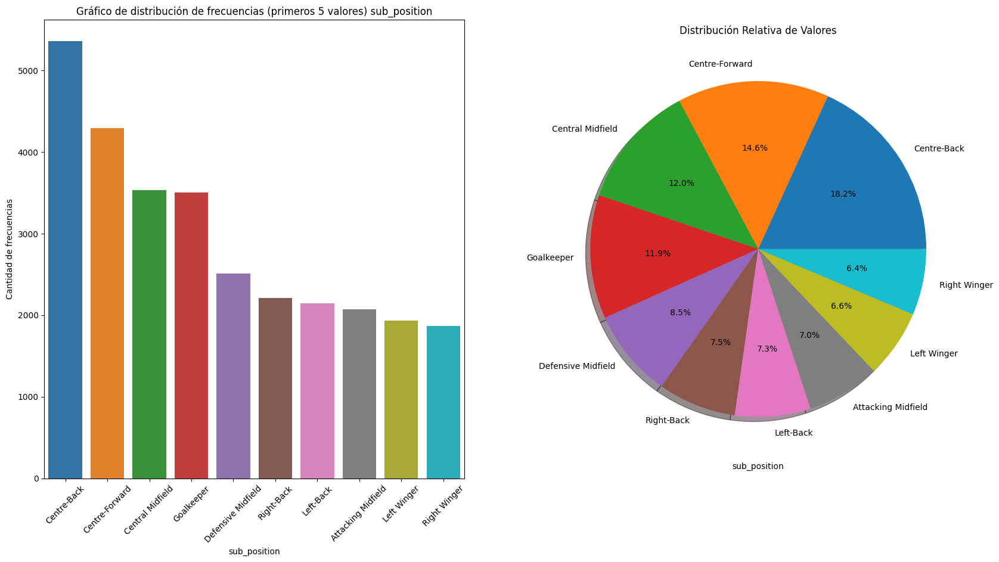



Estadísticas Básicas


count           30518
unique             14
top       Centre-Back
freq             5355
Name: sub_position, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




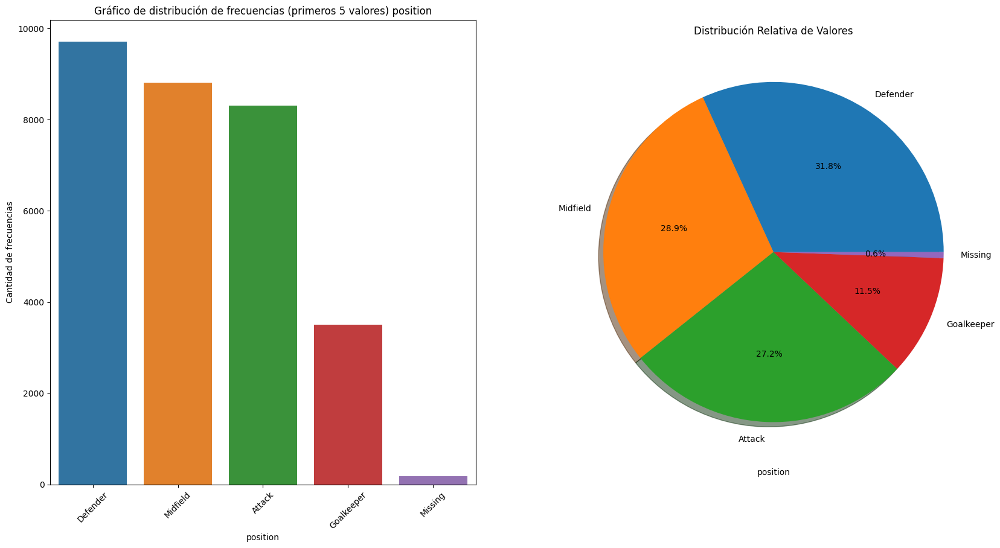



Estadísticas Básicas


count        30518
unique           5
top       Defender
freq          9710
Name: position, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




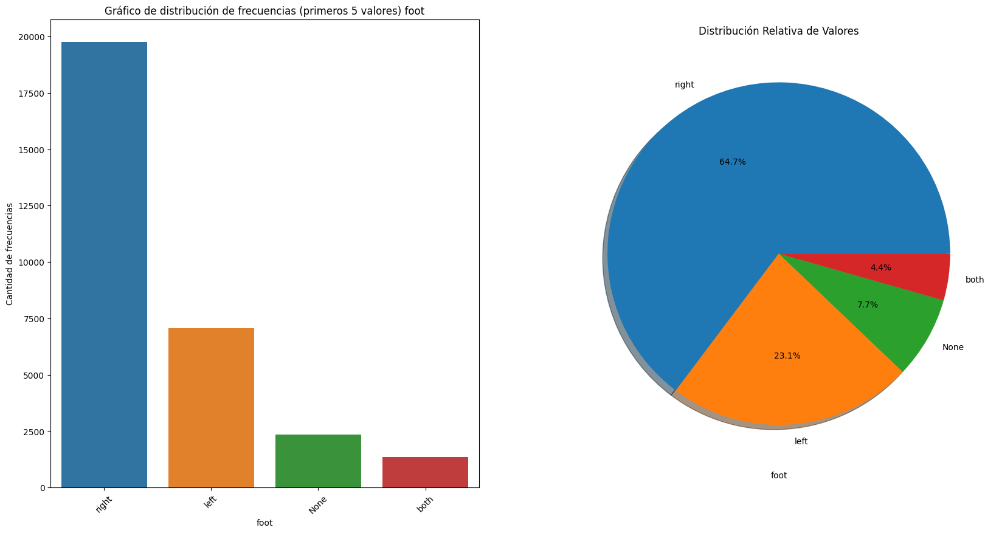



Estadísticas Básicas


count     30518
unique        4
top       right
freq      19757
Name: foot, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




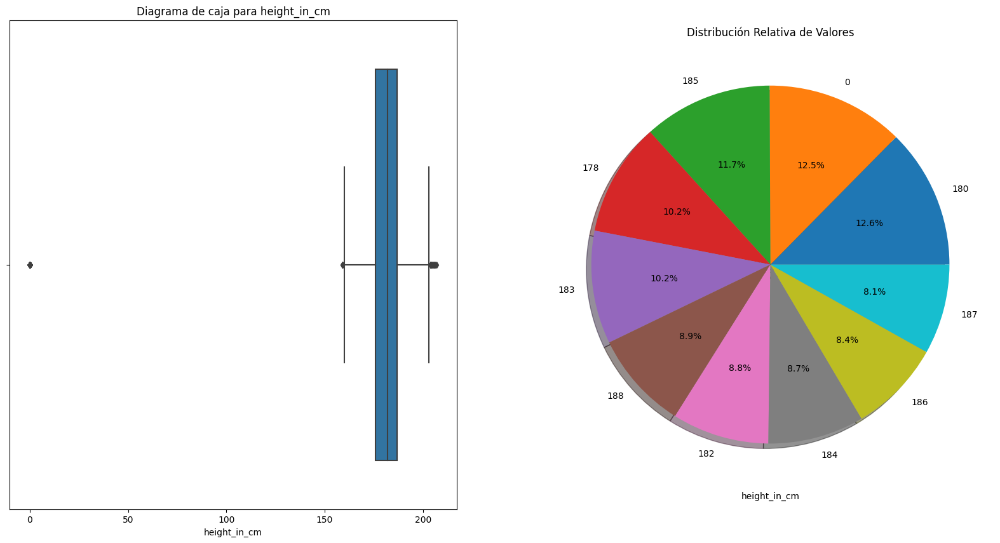



Estadísticas Básicas


count    30518.000000
mean       170.087915
std         45.969836
min          0.000000
25%        176.000000
50%        182.000000
75%        187.000000
max        207.000000
Name: height_in_cm, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




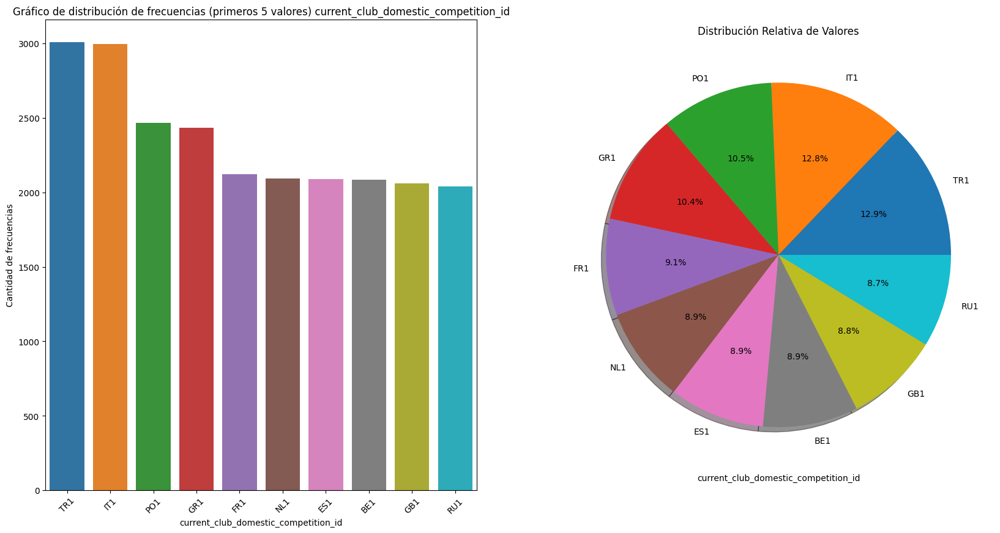



Estadísticas Básicas


count     30518
unique       14
top         TR1
freq       3010
Name: current_club_domestic_competition_id, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




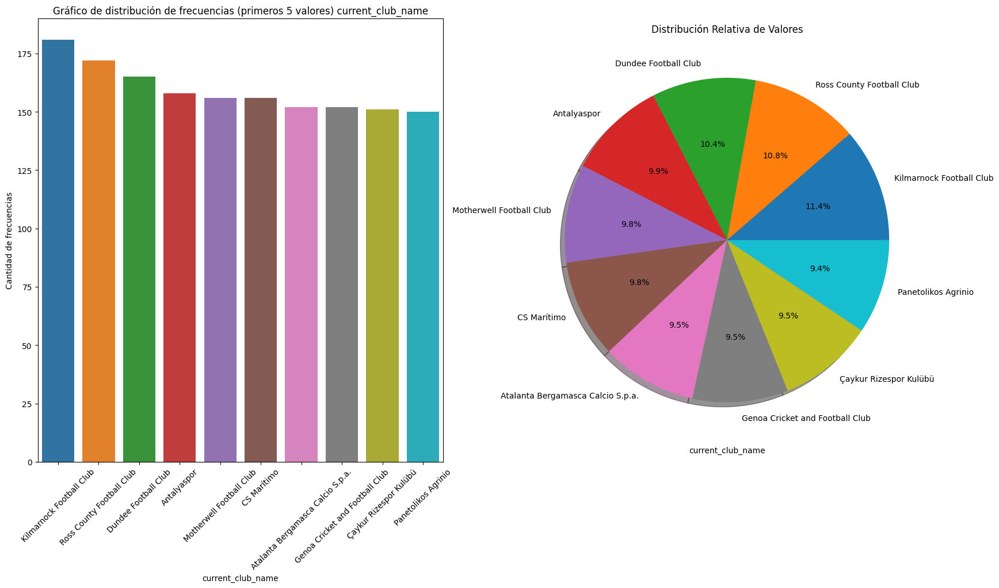



Estadísticas Básicas


count                        30518
unique                         424
top       Kilmarnock Football Club
freq                           181
Name: current_club_name, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




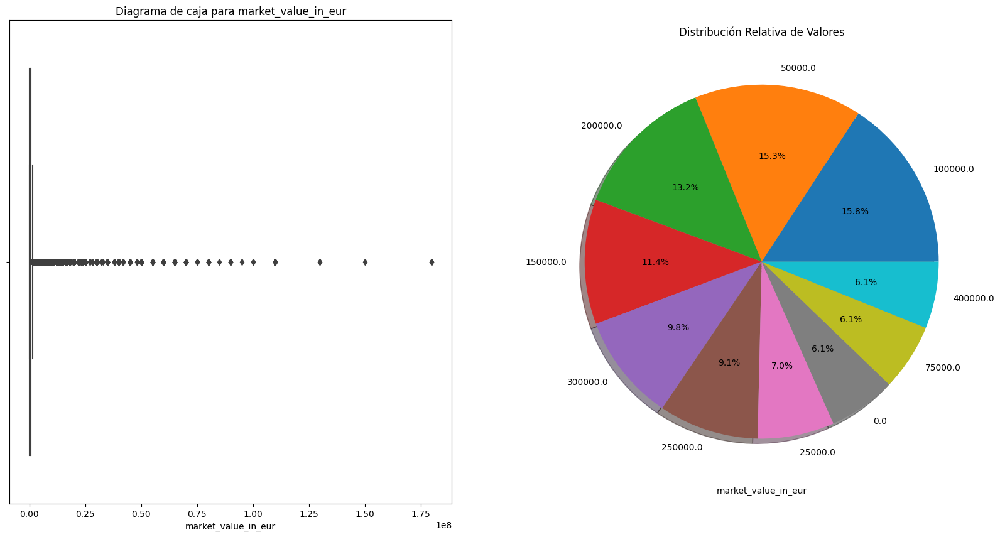



Estadísticas Básicas


count    3.051800e+04
mean     1.539867e+06
std      6.103212e+06
min      0.000000e+00
25%      1.000000e+05
50%      2.500000e+05
75%      6.000000e+05
max      1.800000e+08
Name: market_value_in_eur, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




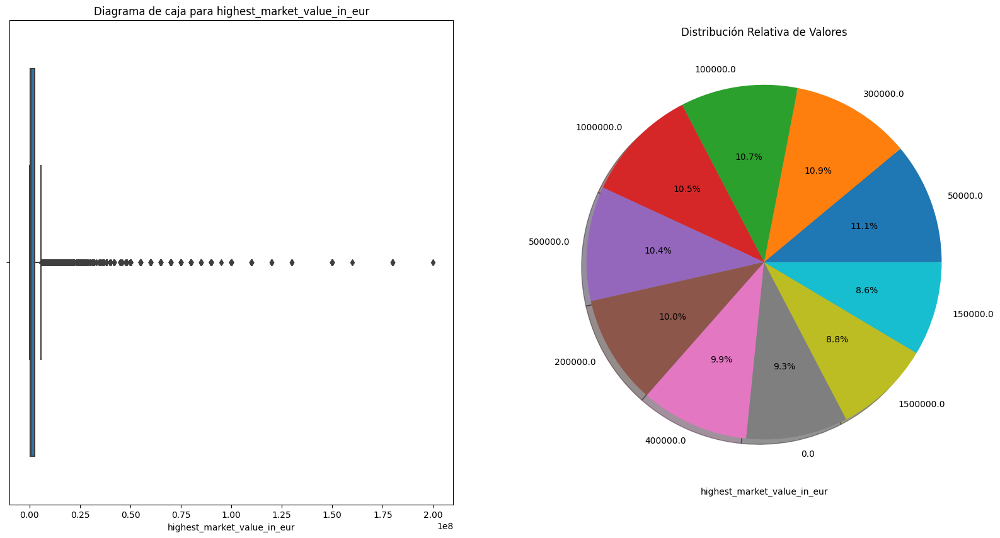



Estadísticas Básicas


count    3.051800e+04
mean     3.549790e+06
std      9.405254e+06
min      0.000000e+00
25%      2.500000e+05
50%      7.000000e+05
75%      2.500000e+06
max      2.000000e+08
Name: highest_market_value_in_eur, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




In [108]:
r.descripcion_distribucion(df_players)